Using sheet: 'Probe Frequency Domain'
Available columns before renaming: ['Probe', 'Time', 'Frequency (Hz)', 'Voltage Magnitude |V(t)|(V)', 'Current Magnitude |I(t)|(A)', 'Voltage Phase ∠V (degree)', 'Current Phase ∠I (degree)', 'Impedance Magnitude |Z(f)|(Ω)', 'Phase Difference (degree)', 'Real Impedance Re{z}(Ω)', 'Negative Imaginary Impedance -Im{z}(Ω)']
Available columns after renaming: ['Probe', 'time', 'frequency', 'Voltage Magnitude |V(t)|(V)', 'Current Magnitude |I(t)|(A)', 'Voltage Phase ∠V (degree)', 'Current Phase ∠I (degree)', 'Impedance Magnitude |Z(f)|(Ω)', 'Phase Difference (degree)', 'Z_real', 'Z_imag_neg']


Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 75/75 [00:06<00:00, 12.12it/s]


TSFRESH features saved to 'ecm_features.xlsx'.
Saved ECM fitting results to 'ECM_fitting_results_advanced.xlsx'
       model_name                                             params  \
0  Advanced_2RCPE  [5e-324, 0.03761107914520926, 0.07902309698904...   
1  Advanced_2RCPE  [7.045384613262934e-09, 0.04027785016605508, 0...   
2  Advanced_2RCPE  [6.0967988626392084e-09, 0.032068462567683656,...   
3  Advanced_2RCPE  [7.057724824939383e-09, 0.04573823685960637, 0...   
4  Advanced_2RCPE  [7.210451107219214e-09, 0.04551139213412436, 0...   

                                         param_names      rmse          aic  \
0  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.003102 -1449.332705   
1  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.000943 -1735.138415   
2  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.002043 -1549.565608   
3  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.000925 -1739.762860   
4  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.0009

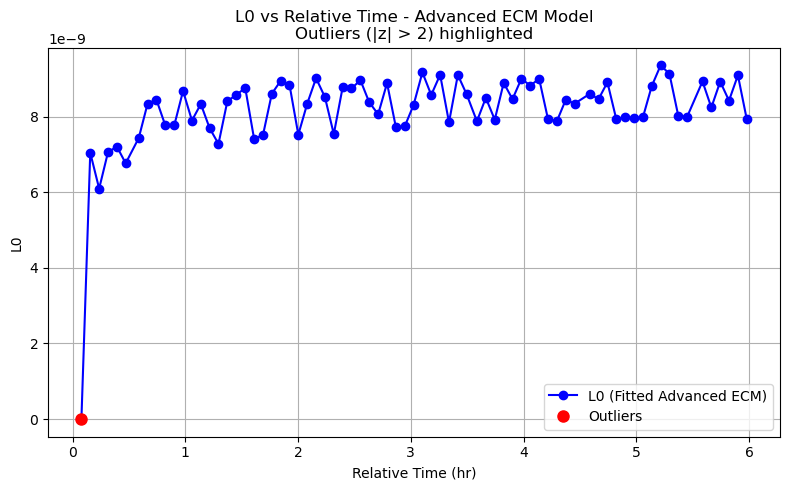

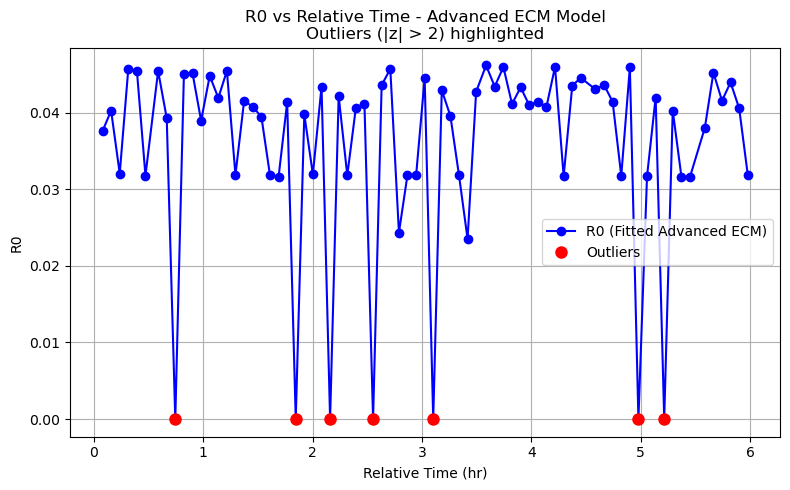

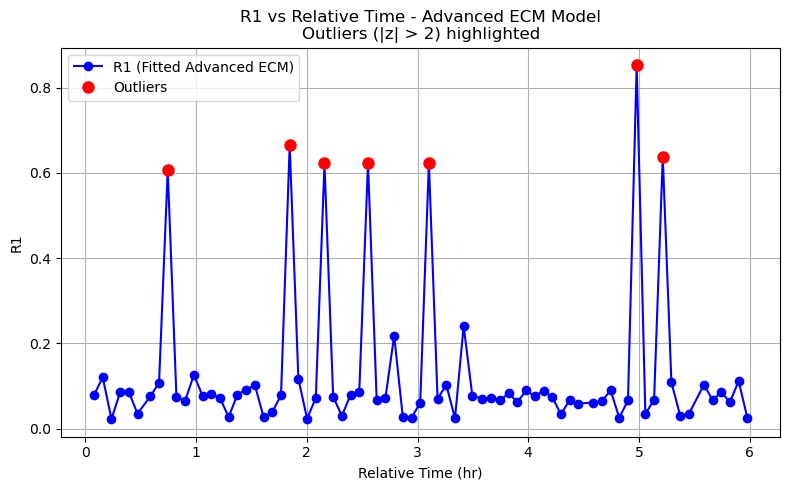

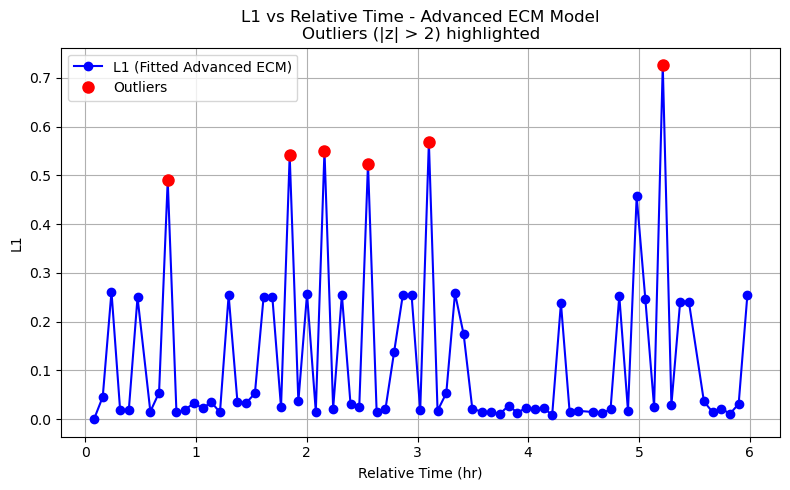

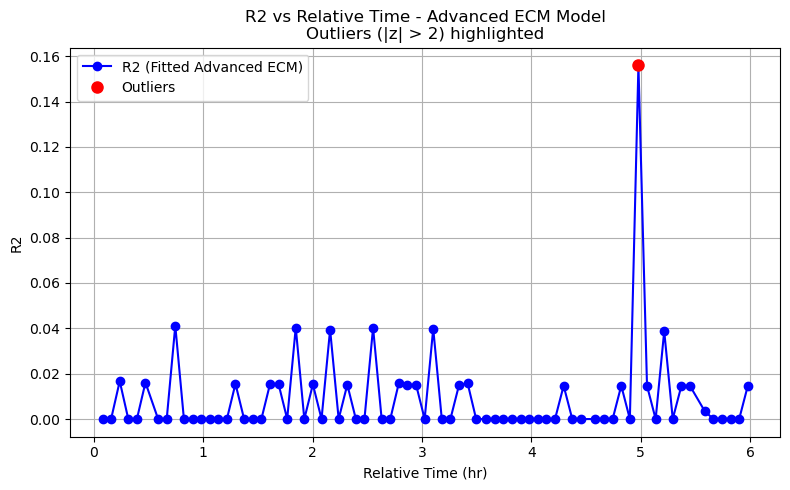

...

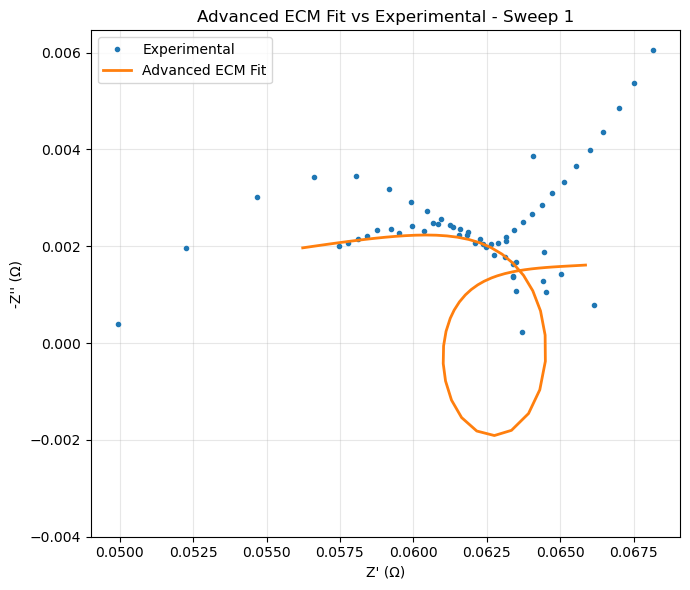

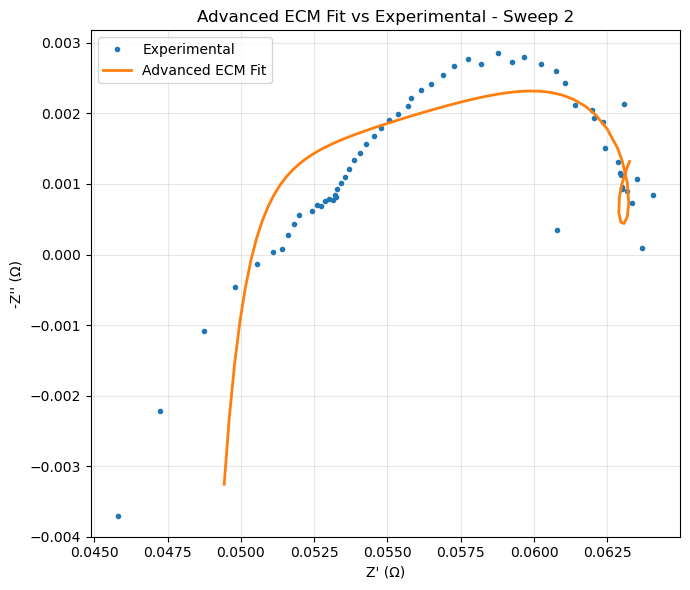

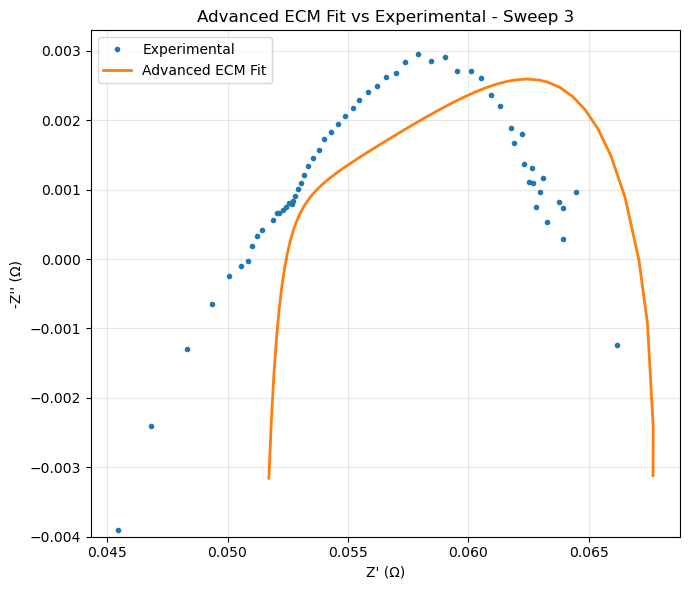

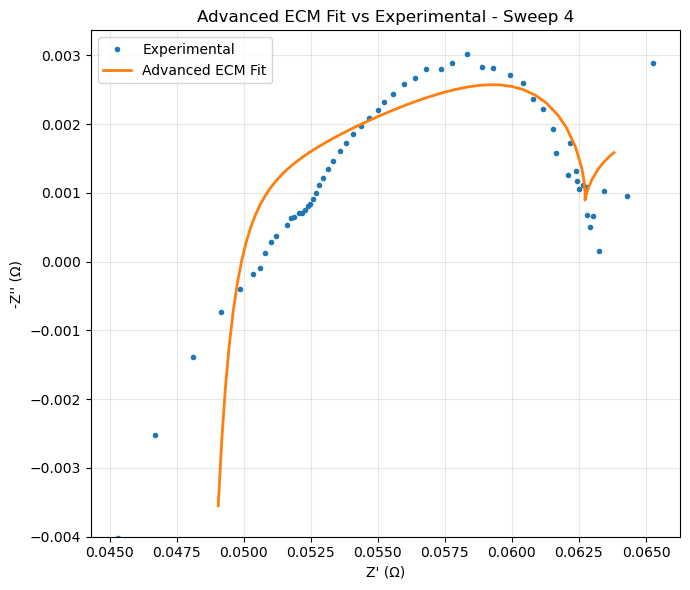

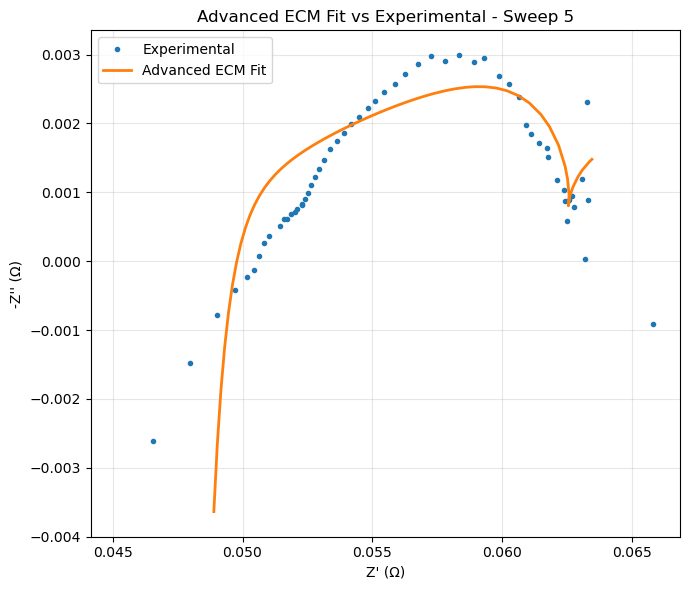

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from datetime import datetime
from pathlib import Path

from impedance.models.circuits import CustomCircuit
from impedance import preprocessing

from tsfresh import extract_features
from tsfresh.utilities.dataframe_functions import impute

warnings.filterwarnings("ignore")

###############################################################################
# 1. DATA LOADING: MULTI-SHEET EXCEL (6300.xls)
###############################################################################
file_path = "6300.xls"  # Path to your Excel file
all_sheets = pd.read_excel(file_path, sheet_name=None)

# Prefer the "Probe Frequency Domain" sheet if available
if "Probe Frequency Domain" in all_sheets and not all_sheets["Probe Frequency Domain"].empty:
    df_eis = all_sheets["Probe Frequency Domain"]
    print("Using sheet: 'Probe Frequency Domain'")
elif "EIS_Data" in all_sheets and not all_sheets["EIS_Data"].empty:
    df_eis = all_sheets["EIS_Data"]
    print("Using sheet: 'EIS_Data'")
else:
    for sheet_name, sheet_df in all_sheets.items():
        if not sheet_df.empty:
            df_eis = sheet_df
            print(f"Using sheet: '{sheet_name}' (fallback)")
            break
    else:
        raise ValueError("No nonempty sheet found in 6300.xls.")

###############################################################################
# 2. DATA CLEANUP & TIME DERIVATION
###############################################################################
print("Available columns before renaming:", df_eis.columns.tolist())
rename_map = {
    "Frequency (Hz)": "frequency",
    "Real Impedance Re{z}(Ω)": "Z_real",
    "Negative Imaginary Impedance -Im{z}(Ω)": "Z_imag_neg",
    "Time": "time"
}
df_eis.rename(columns=rename_map, inplace=True)
print("Available columns after renaming:", df_eis.columns.tolist())

required_cols = ["frequency", "Z_real", "Z_imag_neg"]
missing = [col for col in required_cols if col not in df_eis.columns]
if missing:
    raise KeyError(f"Missing required columns: {missing}.")
df_eis.dropna(subset=required_cols, inplace=True)

if "time" in df_eis.columns:
    df_eis["time"] = pd.to_datetime(df_eis["time"], errors="coerce")
    df_eis.dropna(subset=["time"], inplace=True)
    df_eis["RelTime_sec"] = (df_eis["time"] - df_eis["time"].min()).dt.total_seconds()
    df_eis["RelTime_hr"] = df_eis["RelTime_sec"] / 3600
else:
    df_eis["RelTime_hr"] = np.arange(len(df_eis)) * 0.1

df_eis["sweep_id"] = df_eis.groupby("time").ngroup() if "time" in df_eis.columns else 0

###############################################################################
# 3. AUTO-FEATURIZATION WITH TSFRESH (OPTIONAL)
###############################################################################
df_tsfresh = df_eis[["sweep_id", "frequency", "Z_real"]].rename(
    columns={"sweep_id": "id", "frequency": "time", "Z_real": "value"}
)
extracted_features = extract_features(df_tsfresh, column_id="id", column_sort="time", n_jobs=0)
extracted_features = impute(extracted_features)
extracted_features.reset_index(inplace=True)
extracted_features.rename(columns={"index": "sweep_id"}, inplace=True)
extracted_features.to_excel("ecm_features.xlsx", index=False)
print("TSFRESH features saved to 'ecm_features.xlsx'.")

###############################################################################
# 4. DEFINE ECM MODELS WITH INITIAL GUESSES
###############################################################################
# Advanced model candidate information
advanced_model_info = {
    "name": "Advanced_2RCPE",
    "circuit": "L0-R0-p(R1-L1, R2-CPE1, R3-CPE3)",
    "initial_guess": [
        0.0,       # L0
        0.04941,   # R0
        0.0083883, # R1
        2.0785,    # L1
        0.0083683, # R2
        0.46421,   # CPE1-Q
        1.0,       # CPE1-alpha
        2.2071,    # R3
        1.0,       # CPE3-Q
        1.0        # CPE3-alpha
    ],
    "param_names": ["L0", "R0", "R1", "L1", "R2", "CPE1-Q", "CPE1-alpha", "R3", "CPE3-Q", "CPE3-alpha"]
}

# (You can define other candidate models if needed; here we focus on advanced_model_info)
model_candidates = [advanced_model_info]

###############################################################################
# 5. ECM FITTING FUNCTION FOR ADVANCED MODEL
###############################################################################
def fit_and_evaluate_model(model_dict, freq, Z_exp):
    circuit_str = model_dict["circuit"]
    init_guess = model_dict["initial_guess"]
    circuit_model = CustomCircuit(circuit=circuit_str, initial_guess=init_guess)
    circuit_model.fit(freq, Z_exp)
    Z_fit = circuit_model.predict(freq)
    residuals = Z_exp - Z_fit
    rmse = np.sqrt(np.mean(np.abs(residuals)**2))
    n = len(freq)
    k = len(circuit_model.parameters_)
    rss = np.sum(np.abs(residuals)**2)
    N_eff = 2 * n
    aic = 2 * k + N_eff * np.log(rss / N_eff + 1e-15)
    bic = np.log(N_eff) * k + N_eff * np.log(rss / N_eff + 1e-15)
    param_names = model_dict["param_names"]
    fitted_params = circuit_model.parameters_
    for name, value in zip(param_names, fitted_params):
        if (name.startswith('R') or name.startswith('L')) and value < 0:
            return None
    return {
        "model_name": model_dict["name"],
        "params": fitted_params,
        "param_names": param_names,
        "rmse": rmse,
        "aic": aic,
        "bic": bic
    }

# For simplicity, fit the advanced model for each sweep
fit_results = []
for sweep_id, group in df_eis.groupby("sweep_id"):
    group = group.sort_values("frequency")
    if len(group) < 3:
        continue
    freq = group["frequency"].values
    Z_exp = group["Z_real"].values + 1j * (-group["Z_imag_neg"].values)
    if not np.all(np.isfinite(Z_exp)) or np.any(freq <= 0):
        continue
    result = fit_and_evaluate_model(advanced_model_info, freq, Z_exp)
    if result is not None and (result["rmse"]/np.mean(np.abs(Z_exp))*100) <= 10.0:
        time_val = group["time"].iloc[0] if "time" in group.columns else None
        rel_time_hr = group["RelTime_hr"].iloc[0] if "RelTime_hr" in group.columns else None
        result.update({"sweep_id": sweep_id, "time": time_val, "RelTime_hr": rel_time_hr})
        fit_results.append(result)

fit_df = pd.DataFrame(fit_results)
if fit_df.empty:
    raise RuntimeError("No valid advanced model ECM fits found.")
fit_df.to_excel("ECM_fitting_results_advanced.xlsx", index=False)
print("Saved ECM fitting results to 'ECM_fitting_results_advanced.xlsx'")
print(fit_df.head())

###############################################################################
# 6. PLOT ADVANCED MODEL PARAMETERS VS. EXPERIMENTAL VALUES WITH OUTLIER DETECTION
###############################################################################
# Expand advanced model parameters into separate columns
param_names = advanced_model_info["param_names"]
for i, pname in enumerate(param_names):
    fit_df[pname] = fit_df["params"].apply(lambda x: x[i] if len(x) > i else np.nan)

# Merge relative time from df_eis if not already present
if "RelTime_hr" not in fit_df.columns:
    rel_time = df_eis.groupby("sweep_id")["RelTime_hr"].mean().reset_index()
    fit_df = pd.merge(fit_df, rel_time, on="sweep_id", how="left")

# Plot each parameter vs. relative time and highlight outliers
for pname in param_names:
    plt.figure(figsize=(8, 5))
    plt.plot(fit_df["RelTime_hr"], fit_df[pname], 'bo-', label=f'{pname} (Fitted Advanced ECM)')
    
    # Compute z-scores and flag outliers (|z| > 2)
    z_scores = (fit_df[pname] - fit_df[pname].mean()) / fit_df[pname].std()
    outliers = fit_df[abs(z_scores) > 2]
    if not outliers.empty:
        plt.plot(outliers["RelTime_hr"], outliers[pname], 'ro', markersize=8, label='Outliers')
    
    plt.xlabel("Relative Time (hr)")
    plt.ylabel(pname)
    plt.title(f"{pname} vs Relative Time - Advanced ECM Model\nOutliers (|z| > 2) highlighted")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

###############################################################################
# 7. COMPARE ADVANCED MODEL FIT (ECM) VS EXPERIMENTAL (NYQUIST PLOT)
###############################################################################
# Select a specific sweep to compare advanced model fit vs experimental
sweep_to_plot_ids = fit_df["sweep_id"].iloc[0:5]

# Iterate through each sweep ID to plot
for sweep_id in sweep_to_plot_ids:
    # Filter data for the current sweep
    group = df_eis[df_eis["sweep_id"] == sweep_id].sort_values("frequency")
    freq_plot = group["frequency"].values
    Z_exp_plot = group["Z_real"].values + 1j * (-group["Z_imag_neg"].values)

    # Use the advanced model fit for the current sweep
    advanced_row = fit_df[fit_df["sweep_id"] == sweep_id].iloc[0]
    circuit_adv = CustomCircuit(circuit=advanced_model_info["circuit"], initial_guess=advanced_model_info["initial_guess"])
    circuit_adv.parameters_ = advanced_row["params"]
    Z_fit_adv = circuit_adv.predict(freq_plot)

    # Plot Nyquist comparison
    plt.figure(figsize=(7, 6))
    plt.plot(Z_exp_plot.real, -Z_exp_plot.imag, 'o', label='Experimental', markersize=3)
    plt.plot(Z_fit_adv.real, -Z_fit_adv.imag, '-', label='Advanced ECM Fit', linewidth=2)
    plt.xlabel("Z' (Ω)")
    plt.ylabel("-Z'' (Ω)")
    plt.title(f'Advanced ECM Fit vs Experimental - Sweep {sweep_id}')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.ylim(-0.004, None)
    plt.tight_layout()
    plt.show()

Using sheet: 'Probe Frequency Domain'
Available columns before renaming: ['Probe', 'Time', 'Frequency (Hz)', 'Voltage Magnitude |V(t)|(V)', 'Current Magnitude |I(t)|(A)', 'Voltage Phase ∠V (degree)', 'Current Phase ∠I (degree)', 'Impedance Magnitude |Z(f)|(Ω)', 'Phase Difference (degree)', 'Real Impedance Re{z}(Ω)', 'Negative Imaginary Impedance -Im{z}(Ω)']
Available columns after renaming: ['Probe', 'time', 'frequency', 'Voltage Magnitude |V(t)|(V)', 'Current Magnitude |I(t)|(A)', 'Voltage Phase ∠V (degree)', 'Current Phase ∠I (degree)', 'Impedance Magnitude |Z(f)|(Ω)', 'Phase Difference (degree)', 'Z_real', 'Z_imag_neg']


Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 75/75 [00:06<00:00, 12.08it/s]


TSFRESH features saved to 'ecm_features.xlsx'.
Saved ECM fitting results to 'ECM_fitting_results_advanced.xlsx'
       model_name                                             params  \
0  Advanced_2RCPE  [5e-324, 0.03761107914520926, 0.07902309698904...   
1  Advanced_2RCPE  [7.045384613262934e-09, 0.04027785016605508, 0...   
2  Advanced_2RCPE  [6.0967988626392084e-09, 0.032068462567683656,...   
3  Advanced_2RCPE  [7.057724824939383e-09, 0.04573823685960637, 0...   
4  Advanced_2RCPE  [7.210451107219214e-09, 0.04551139213412436, 0...   

                                         param_names      RMSE          AIC  \
0  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.003102 -1449.332705   
1  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.000943 -1735.138415   
2  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.002043 -1549.565608   
3  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.000925 -1739.762860   
4  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.0009

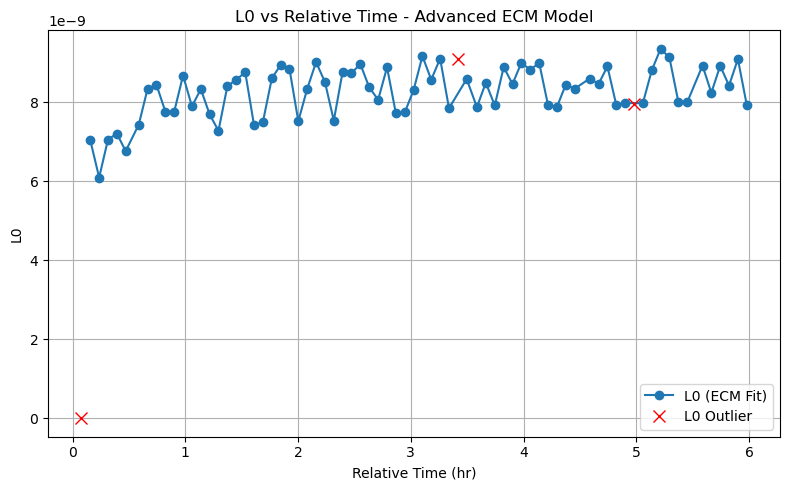

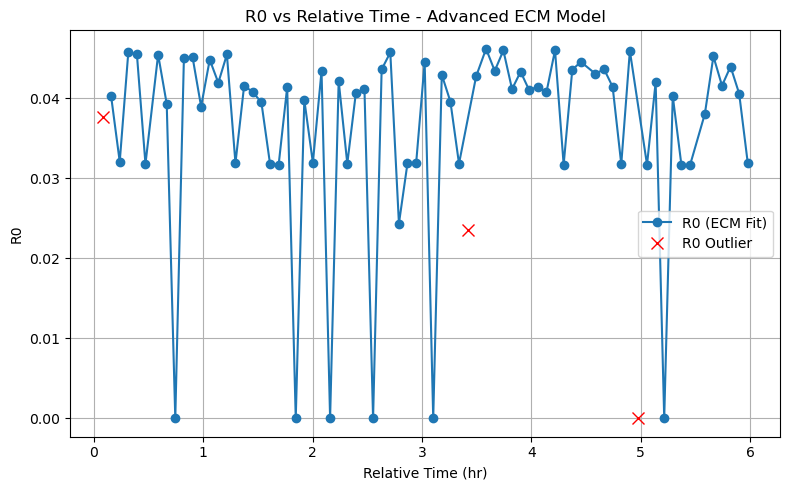

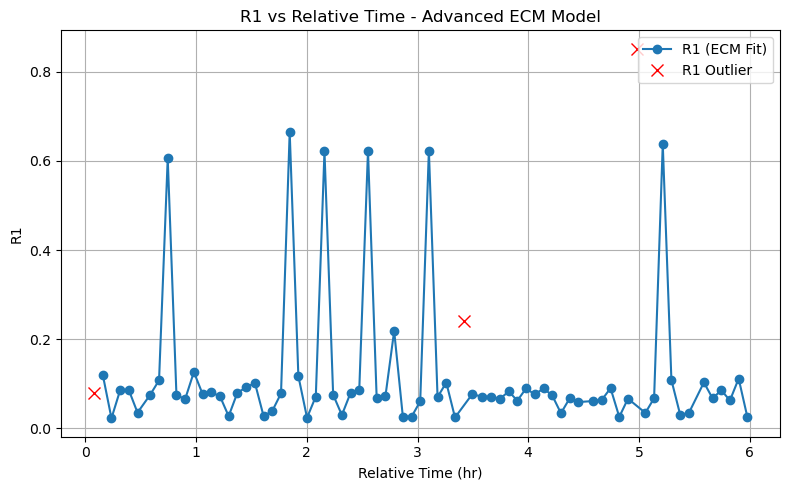

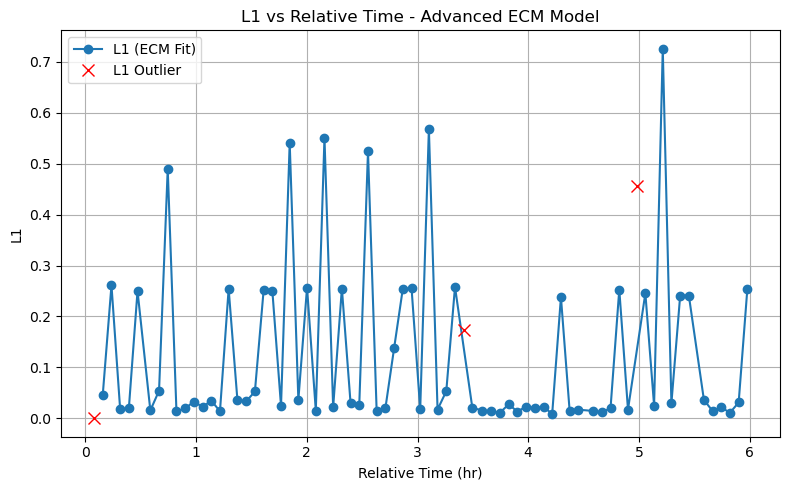

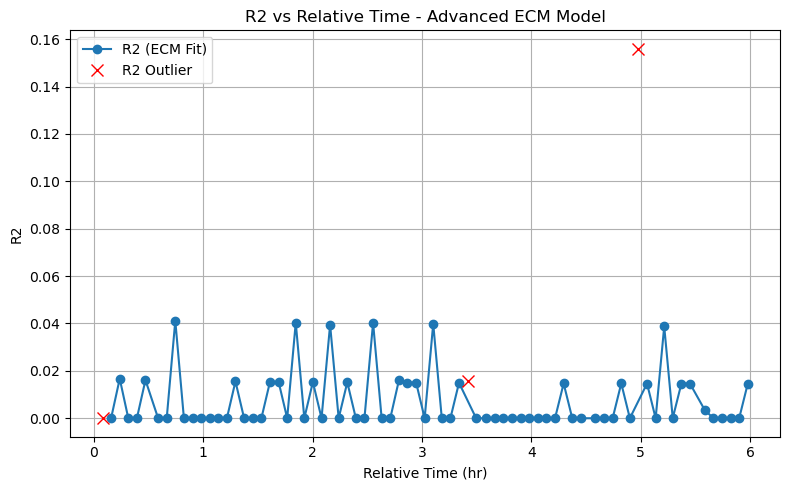

...

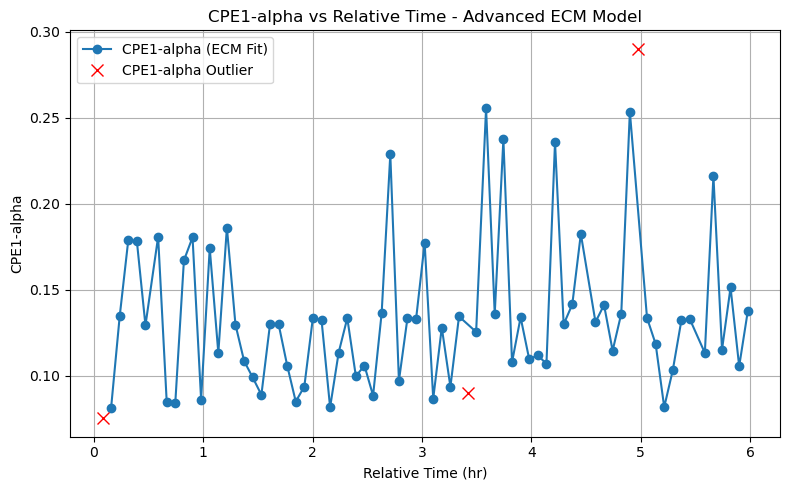

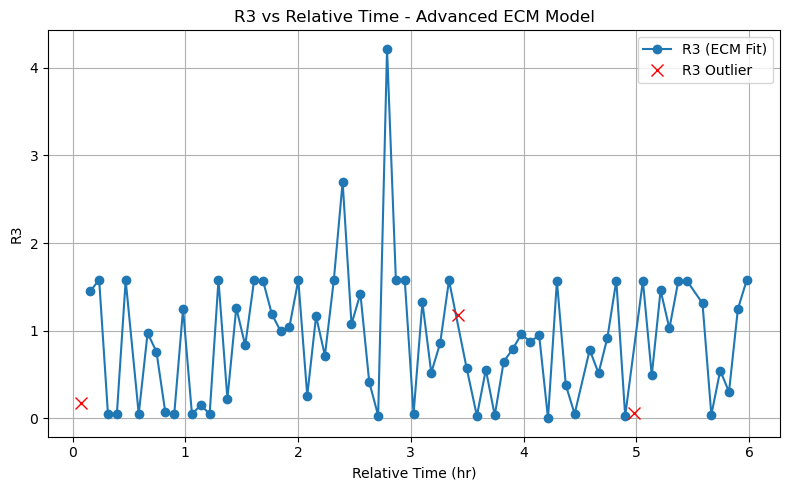

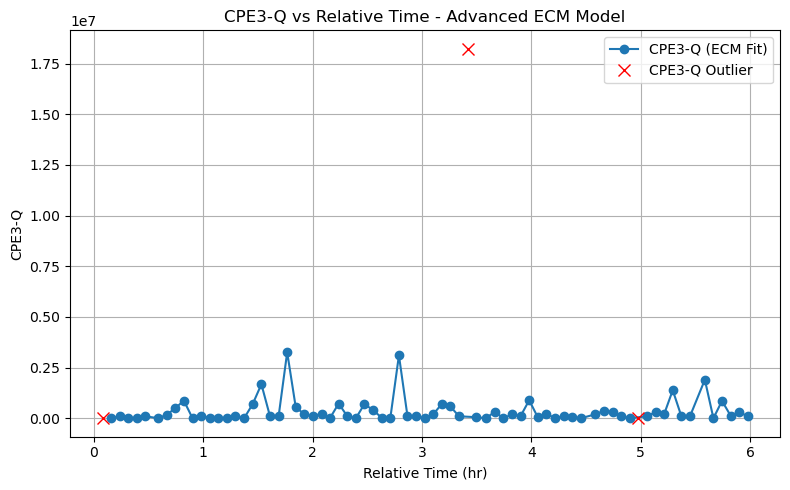

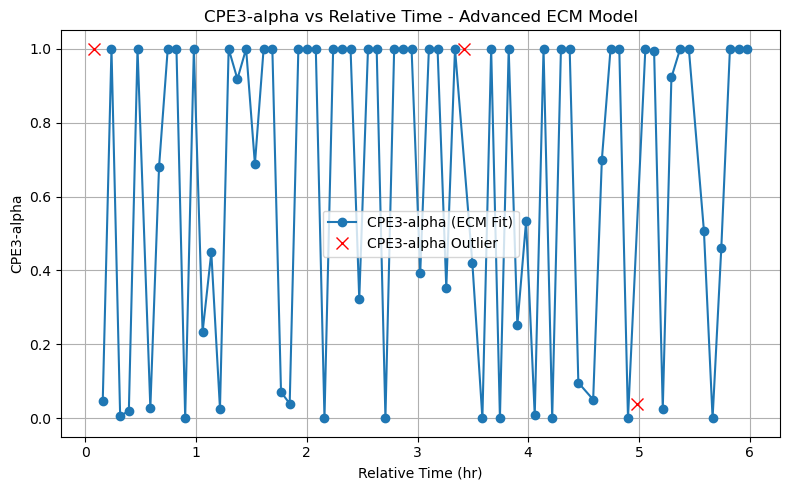

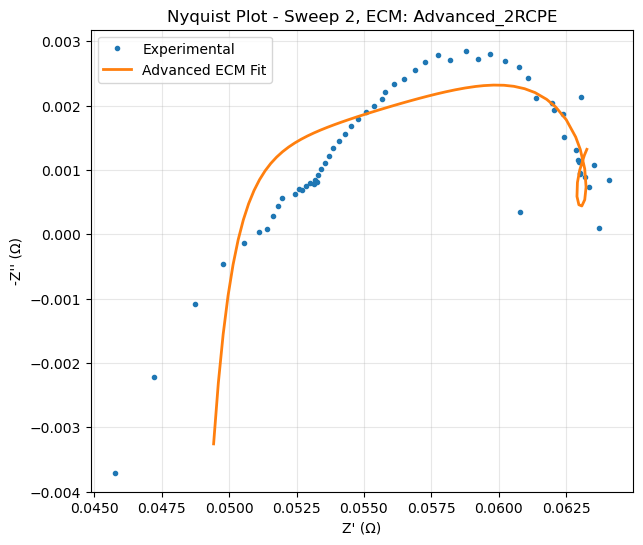

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from datetime import datetime
from pathlib import Path

from impedance.models.circuits import CustomCircuit
from impedance import preprocessing

from tsfresh import extract_features
from tsfresh.utilities.dataframe_functions import impute

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.multioutput import MultiOutputRegressor
import xgboost as xgb

warnings.filterwarnings("ignore")

###############################################################################
# 1. DATA LOADING: MULTI-SHEET EXCEL (6300.xls)
###############################################################################
file_path = "6300.xls"  # Adjust file path as needed
all_sheets = pd.read_excel(file_path, sheet_name=None)

# Prefer the "Probe Frequency Domain" sheet if available
if "Probe Frequency Domain" in all_sheets and not all_sheets["Probe Frequency Domain"].empty:
    df_eis = all_sheets["Probe Frequency Domain"]
    print("Using sheet: 'Probe Frequency Domain'")
elif "EIS_Data" in all_sheets and not all_sheets["EIS_Data"].empty:
    df_eis = all_sheets["EIS_Data"]
    print("Using sheet: 'EIS_Data'")
else:
    for sheet_name, sheet_df in all_sheets.items():
        if not sheet_df.empty:
            df_eis = sheet_df
            print(f"Using sheet: '{sheet_name}' (fallback)")
            break
    else:
        raise ValueError("No nonempty sheet found in 6300.xls.")

###############################################################################
# 2. DATA CLEANUP & TIME DERIVATION
###############################################################################
print("Available columns before renaming:", df_eis.columns.tolist())
rename_map = {
    "Frequency (Hz)": "frequency",
    "Real Impedance Re{z}(Ω)": "Z_real",
    "Negative Imaginary Impedance -Im{z}(Ω)": "Z_imag_neg",
    "Time": "time"
}
df_eis.rename(columns=rename_map, inplace=True)
print("Available columns after renaming:", df_eis.columns.tolist())

required_cols = ["frequency", "Z_real", "Z_imag_neg"]
if any(col not in df_eis.columns for col in required_cols):
    raise KeyError("Missing one or more required columns.")
df_eis.dropna(subset=required_cols, inplace=True)

if "time" in df_eis.columns:
    df_eis["time"] = pd.to_datetime(df_eis["time"], errors="coerce")
    df_eis.dropna(subset=["time"], inplace=True)
    df_eis["RelTime_sec"] = (df_eis["time"] - df_eis["time"].min()).dt.total_seconds()
    df_eis["RelTime_hr"] = df_eis["RelTime_sec"] / 3600
else:
    df_eis["RelTime_hr"] = np.arange(len(df_eis)) * 0.1

# Create a sweep_id column if not present.
if "sweep_id" not in df_eis.columns:
    df_eis["sweep_id"] = df_eis.groupby("time").ngroup() if "time" in df_eis.columns else np.arange(len(df_eis))

###############################################################################
# 3. AUTO-FEATURIZATION WITH TSFRESH (OPTIONAL)
###############################################################################
df_tsfresh = df_eis[["sweep_id", "frequency", "Z_real"]].rename(
    columns={"sweep_id": "id", "frequency": "time", "Z_real": "value"}
)
extracted_features = extract_features(df_tsfresh, column_id="id", column_sort="time", n_jobs=0)
extracted_features = impute(extracted_features)
extracted_features.reset_index(inplace=True)
extracted_features.rename(columns={"index": "sweep_id"}, inplace=True)
extracted_features.to_excel("ecm_features.xlsx", index=False)
print("TSFRESH features saved to 'ecm_features.xlsx'.")

###############################################################################
# 4. DEFINE ADVANCED ECM MODEL WITH INITIAL GUESSES
###############################################################################
advanced_model_info = {
    "name": "Advanced_2RCPE",
    "circuit": "L0-R0-p(R1-L1, R2-CPE1, R3-CPE3)",
    "initial_guess": [
        0.0,       # L0
        0.04941,   # R0
        0.0083883, # R1
        2.0785,    # L1
        0.0083683, # R2
        0.46421,   # CPE1-Q
        1.0,       # CPE1-alpha
        2.2071,    # R3
        1.0,       # CPE3-Q
        1.0        # CPE3-alpha
    ],
    "param_names": ["L0", "R0", "R1", "L1", "R2", "CPE1-Q", "CPE1-alpha", "R3", "CPE3-Q", "CPE3-alpha"]
}
model_candidates = [advanced_model_info]

###############################################################################
# 5. ECM FITTING FUNCTION FOR ADVANCED MODEL
###############################################################################
def fit_and_evaluate_model(model_dict, freq, Z_exp):
    circuit_str = model_dict["circuit"]
    init_guess = model_dict["initial_guess"]
    circuit_model = CustomCircuit(circuit=circuit_str, initial_guess=init_guess)
    circuit_model.fit(freq, Z_exp)
    Z_fit = circuit_model.predict(freq)
    residuals = Z_exp - Z_fit
    RMSE = np.sqrt(np.mean(np.abs(residuals)**2))  # Capital RMSE
    n = len(freq)
    k = len(circuit_model.parameters_)
    rss = np.sum(np.abs(residuals)**2)
    N_eff = 2 * n
    aic = 2 * k + N_eff * np.log(rss / N_eff + 1e-15)
    bic = np.log(N_eff) * k + N_eff * np.log(rss / N_eff + 1e-15)
    param_names = model_dict["param_names"]
    fitted_params = circuit_model.parameters_
    for name, value in zip(param_names, fitted_params):
        if (name.startswith('R') or name.startswith('L')) and value < 0:
            return None
    return {
        "model_name": model_dict["name"],
        "params": fitted_params,
        "param_names": param_names,
        "RMSE": RMSE,
        "AIC": aic,
        "BIC": bic
    }

###############################################################################
# 6. LOOP OVER SWEEPS AND SELECT ADVANCED MODEL FITS PER SWEEP
###############################################################################
error_threshold_percent = 10.0  # Only keep sweeps with relative RMSE ≤ 10%
fit_results = []
for sweep_id, group in df_eis.groupby("sweep_id"):
    group = group.sort_values("frequency")
    if len(group) < 3:
        continue
    freq = group["frequency"].values
    Z_exp = group["Z_real"].values + 1j * (-group["Z_imag_neg"].values)
    if not np.all(np.isfinite(Z_exp)) or np.any(freq <= 0):
        continue
    result = fit_and_evaluate_model(advanced_model_info, freq, Z_exp)
    if result is not None and (result["RMSE"] / np.mean(np.abs(Z_exp)) * 100) <= error_threshold_percent:
        time_val = group["time"].iloc[0] if "time" in group.columns else None
        rel_time_hr = group["RelTime_hr"].iloc[0] if "RelTime_hr" in group.columns else None
        result.update({"sweep_id": sweep_id, "time": time_val, "RelTime_hr": rel_time_hr})
        fit_results.append(result)
fit_df = pd.DataFrame(fit_results)
if fit_df.empty:
    raise RuntimeError("No valid advanced model ECM fits found.")
fit_df.to_excel("ECM_fitting_results_advanced.xlsx", index=False)
print("Saved ECM fitting results to 'ECM_fitting_results_advanced.xlsx'")
print(fit_df.head())

###############################################################################
# 6A. OUTLIER REJECTION USING THE 6-SIGMA METHOD
###############################################################################
# Expand the 'params' column into individual advanced model parameter columns.
for i, pname in enumerate(advanced_model_info["param_names"]):
    fit_df[pname] = fit_df["params"].apply(lambda x: x[i] if len(x) > i else np.nan)
    
# Identify outliers: rows dropped by 6-sigma rejection for any parameter.
df_clean = fit_df.copy()
for pname in advanced_model_info["param_names"]:
    mu = df_clean[pname].mean()
    sigma = df_clean[pname].std()
    df_clean = df_clean[(df_clean[pname] >= mu - 6 * sigma) & (df_clean[pname] <= mu + 6 * sigma)]
print("After outlier rejection (6-sigma), number of sweeps:", len(df_clean))
df_clean.to_excel("ECM_fitting_results_advanced_clean.xlsx", index=False)

# Also, determine the outliers (those removed) for later plotting.
df_outliers = fit_df.loc[~fit_df.index.isin(df_clean.index)]
print("Number of outlier sweeps detected:", len(df_outliers))

###############################################################################
# 7. PLOT ADVANCED MODEL PARAMETERS VS. RELATIVE TIME (with Outliers Highlighted)
###############################################################################
for pname in advanced_model_info["param_names"]:
    plt.figure(figsize=(8, 5))
    plt.plot(df_clean["RelTime_hr"], df_clean[pname], 'o-', label=f'{pname} (ECM Fit)')
    if not df_outliers.empty:
        plt.plot(df_outliers["RelTime_hr"], df_outliers[pname], 'rx', markersize=8, label=f'{pname} Outlier')
    plt.xlabel("Relative Time (hr)")
    plt.ylabel(pname)
    plt.title(f"{pname} vs Relative Time - Advanced ECM Model")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

###############################################################################
# 8. (OPTIONAL) PLOT TRIPLE NYQUIST PLOT: EXPERIMENTAL vs ECM FIT
###############################################################################
def plot_nyquist(sweep_id, df_eis, df_clean):
    group = df_eis[df_eis["sweep_id"] == sweep_id].sort_values("frequency")
    if group.empty:
        print(f"No data found for sweep {sweep_id}.")
        return
    freq = group["frequency"].values
    Z_exp = group["Z_real"].values + 1j * (-group["Z_imag_neg"].values)
    
    row = df_clean[df_clean["sweep_id"] == sweep_id]
    if row.empty:
        print(f"No cleaned ECM fit for sweep {sweep_id}.")
        return
    fitted_params = row.iloc[0]["params"]
    model_name = row.iloc[0]["model_name"]
    circuit_fit = CustomCircuit(circuit=advanced_model_info["circuit"],
                                initial_guess=advanced_model_info["initial_guess"])
    circuit_fit.parameters_ = fitted_params
    Z_fit = circuit_fit.predict(freq)
    
    plt.figure(figsize=(7, 6))
    plt.plot(Z_exp.real, -Z_exp.imag, 'o', label='Experimental', markersize=3)
    plt.plot(Z_fit.real, -Z_fit.imag, '-', label='Advanced ECM Fit', linewidth=2)
    plt.xlabel("Z' (Ω)")
    plt.ylabel("-Z'' (Ω)")
    plt.title(f'Nyquist Plot - Sweep {sweep_id}, ECM: {model_name}')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.ylim(-0.004, None)  # Force lower limit to -0.004
    plt.show()

# Plot Nyquist for one sweep (e.g., the first valid sweep in df_clean)
sweep_to_plot = df_clean["sweep_id"].unique()[0]
plot_nyquist(sweep_to_plot, df_eis, df_clean)

Using sheet: 'Probe Frequency Domain'
Available columns before renaming: ['Probe', 'Time', 'Frequency (Hz)', 'Voltage Magnitude |V(t)|(V)', 'Current Magnitude |I(t)|(A)', 'Voltage Phase ∠V (degree)', 'Current Phase ∠I (degree)', 'Impedance Magnitude |Z(f)|(Ω)', 'Phase Difference (degree)', 'Real Impedance Re{z}(Ω)', 'Negative Imaginary Impedance -Im{z}(Ω)']
Available columns after renaming: ['Probe', 'time', 'frequency', 'Voltage Magnitude |V(t)|(V)', 'Current Magnitude |I(t)|(A)', 'Voltage Phase ∠V (degree)', 'Current Phase ∠I (degree)', 'Impedance Magnitude |Z(f)|(Ω)', 'Phase Difference (degree)', 'Z_real', 'Z_imag_neg']


Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 75/75 [00:06<00:00, 12.44it/s]


TSFRESH features saved to 'ecm_features.xlsx'.
Saved ECM fitting results to 'ECM_fitting_results_advanced.xlsx'
       model_name                                             params  \
0  Advanced_2RCPE  [5e-324, 0.03761107914520926, 0.07902309698904...   
1  Advanced_2RCPE  [7.045384613262934e-09, 0.04027785016605508, 0...   
2  Advanced_2RCPE  [6.0967988626392084e-09, 0.032068462567683656,...   
3  Advanced_2RCPE  [7.057724824939383e-09, 0.04573823685960637, 0...   
4  Advanced_2RCPE  [7.210451107219214e-09, 0.04551139213412436, 0...   

                                         param_names      rmse          aic  \
0  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.003102 -1449.332705   
1  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.000943 -1735.138415   
2  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.002043 -1549.565608   
3  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.000925 -1739.762860   
4  [L0, R0, R1, L1, R2, CPE1-Q, CPE1-alpha, R3, C...  0.0009

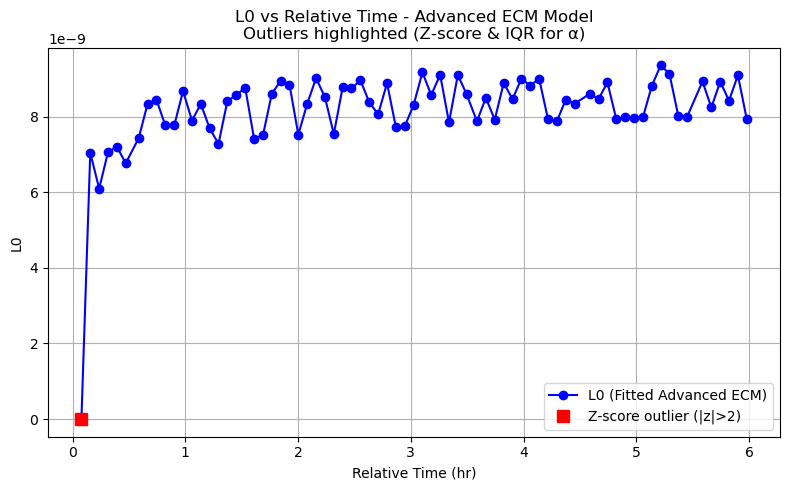

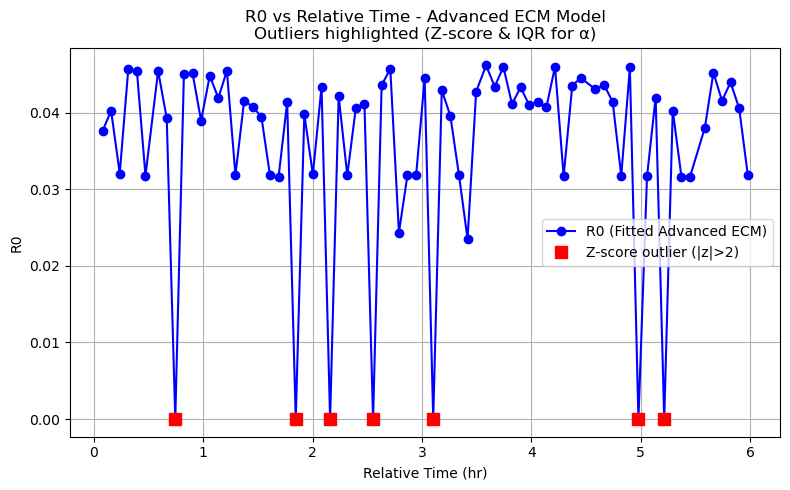

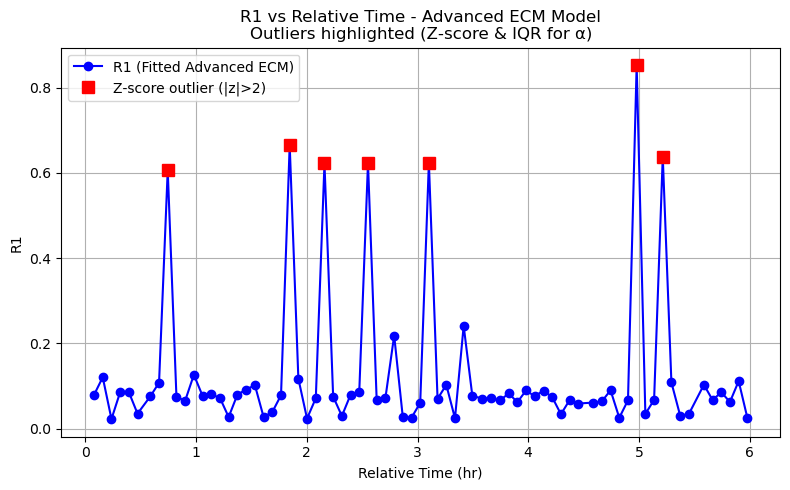

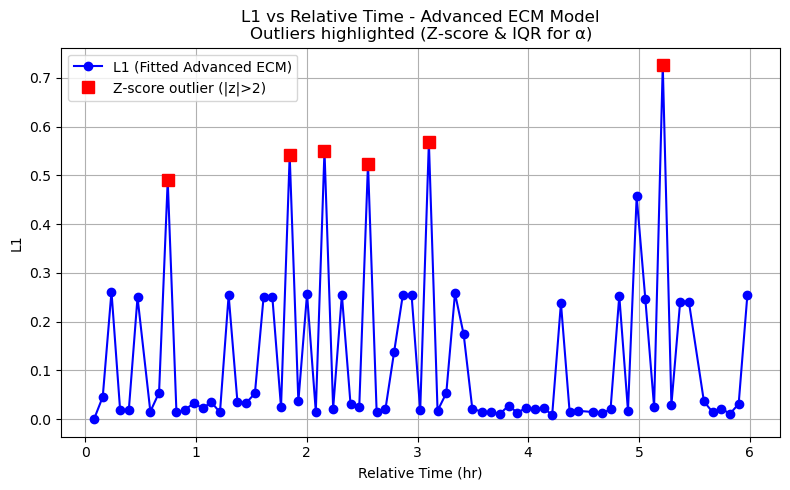

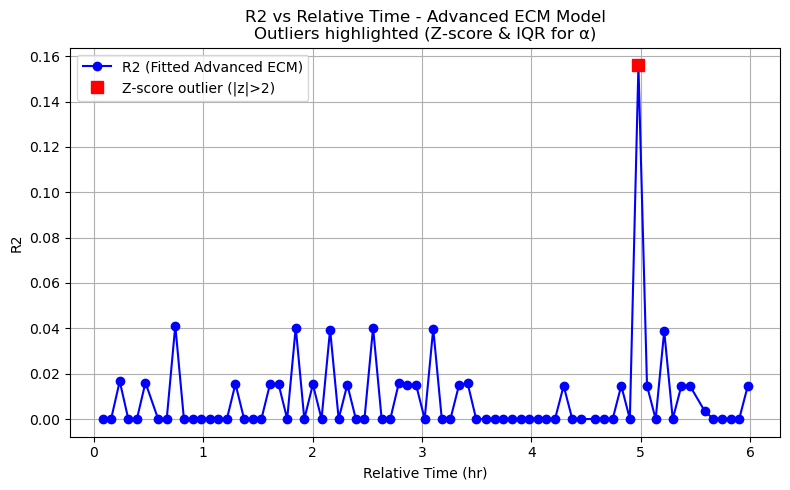

...

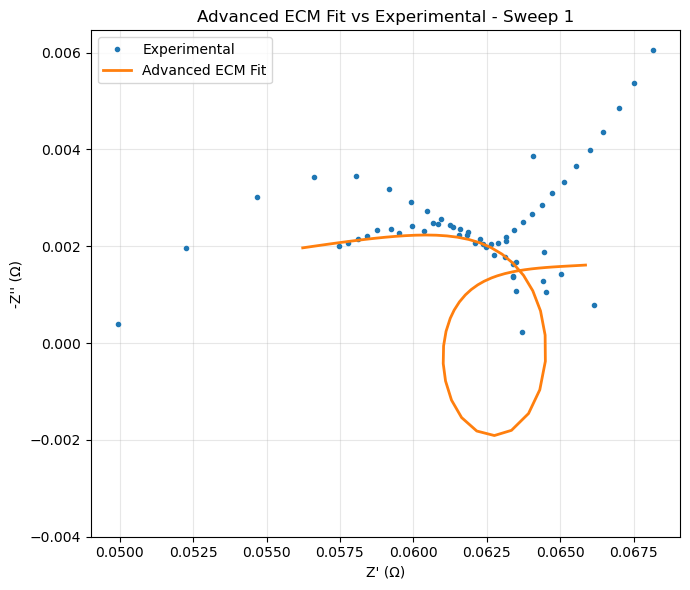

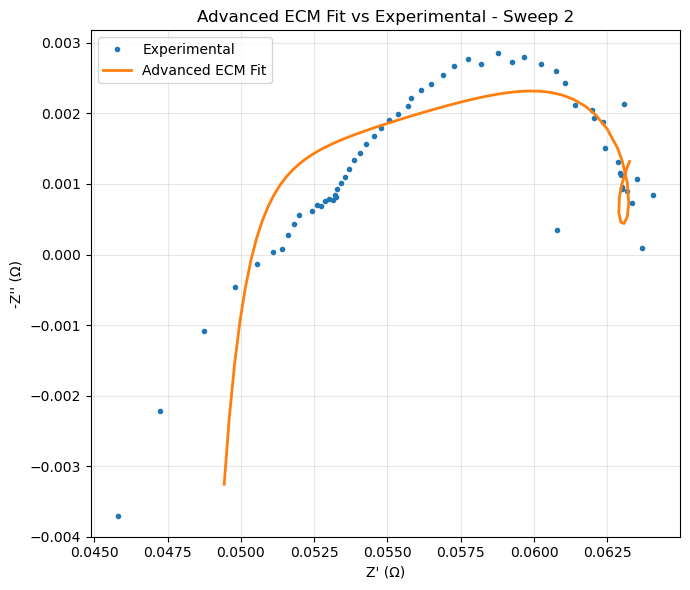

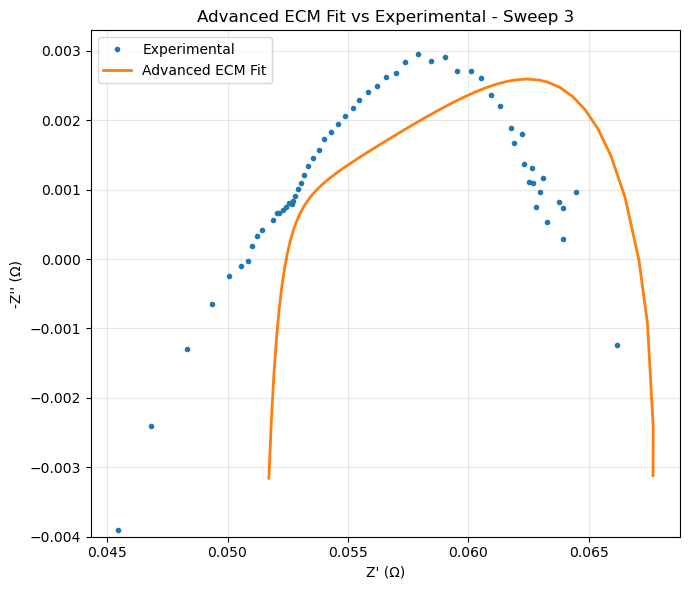

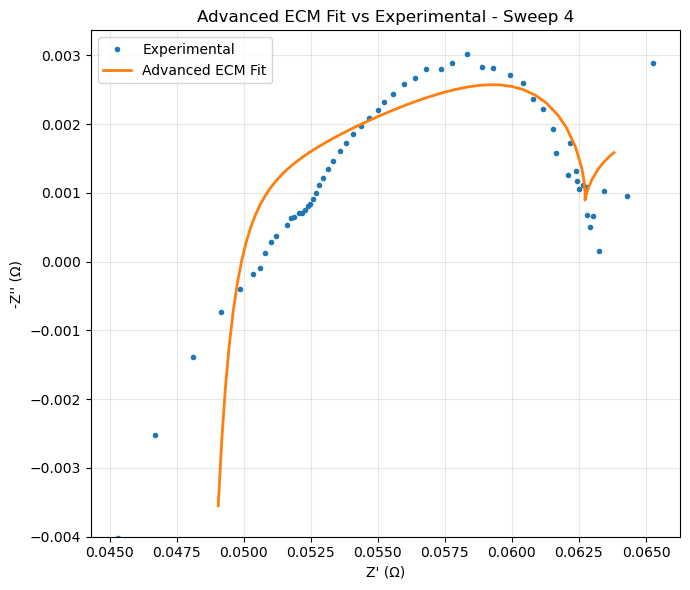

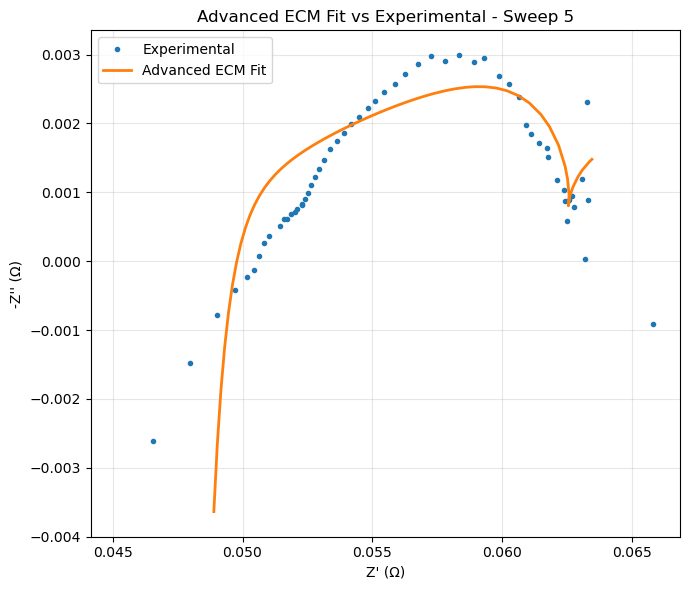

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from datetime import datetime
from pathlib import Path

from impedance.models.circuits import CustomCircuit
from impedance import preprocessing

from tsfresh import extract_features
from tsfresh.utilities.dataframe_functions import impute

warnings.filterwarnings("ignore")

###############################################################################
# 1. DATA LOADING: MULTI-SHEET EXCEL (6300.xls)
###############################################################################
file_path = "6300.xls"  # Path to your Excel file
all_sheets = pd.read_excel(file_path, sheet_name=None)

# Prefer the "Probe Frequency Domain" sheet if available
if "Probe Frequency Domain" in all_sheets and not all_sheets["Probe Frequency Domain"].empty:
    df_eis = all_sheets["Probe Frequency Domain"]
    print("Using sheet: 'Probe Frequency Domain'")
elif "EIS_Data" in all_sheets and not all_sheets["EIS_Data"].empty:
    df_eis = all_sheets["EIS_Data"]
    print("Using sheet: 'EIS_Data'")
else:
    for sheet_name, sheet_df in all_sheets.items():
        if not sheet_df.empty:
            df_eis = sheet_df
            print(f"Using sheet: '{sheet_name}' (fallback)")
            break
    else:
        raise ValueError("No nonempty sheet found in 6300.xls.")

###############################################################################
# 2. DATA CLEANUP & TIME DERIVATION
###############################################################################
print("Available columns before renaming:", df_eis.columns.tolist())
rename_map = {
    "Frequency (Hz)": "frequency",
    "Real Impedance Re{z}(Ω)": "Z_real",
    "Negative Imaginary Impedance -Im{z}(Ω)": "Z_imag_neg",
    "Time": "time"
}
df_eis.rename(columns=rename_map, inplace=True)
print("Available columns after renaming:", df_eis.columns.tolist())

required_cols = ["frequency", "Z_real", "Z_imag_neg"]
missing = [col for col in required_cols if col not in df_eis.columns]
if missing:
    raise KeyError(f"Missing required columns: {missing}.")
df_eis.dropna(subset=required_cols, inplace=True)

if "time" in df_eis.columns:
    df_eis["time"] = pd.to_datetime(df_eis["time"], errors="coerce")
    df_eis.dropna(subset=["time"], inplace=True)
    df_eis["RelTime_sec"] = (df_eis["time"] - df_eis["time"].min()).dt.total_seconds()
    df_eis["RelTime_hr"] = df_eis["RelTime_sec"] / 3600
else:
    df_eis["RelTime_hr"] = np.arange(len(df_eis)) * 0.1

df_eis["sweep_id"] = df_eis.groupby("time").ngroup() if "time" in df_eis.columns else 0

###############################################################################
# 3. AUTO-FEATURIZATION WITH TSFRESH (OPTIONAL)
###############################################################################
df_tsfresh = df_eis[["sweep_id", "frequency", "Z_real"]].rename(
    columns={"sweep_id": "id", "frequency": "time", "Z_real": "value"}
)
extracted_features = extract_features(df_tsfresh, column_id="id", column_sort="time", n_jobs=0)
extracted_features = impute(extracted_features)
extracted_features.reset_index(inplace=True)
extracted_features.rename(columns={"index": "sweep_id"}, inplace=True)
extracted_features.to_excel("ecm_features.xlsx", index=False)
print("TSFRESH features saved to 'ecm_features.xlsx'.")

###############################################################################
# 4. DEFINE ECM MODELS WITH INITIAL GUESSES
###############################################################################
# Advanced model candidate information
advanced_model_info = {
    "name": "Advanced_2RCPE",
    "circuit": "L0-R0-p(R1-L1, R2-CPE1, R3-CPE3)",
    "initial_guess": [
        0.0,       # L0
        0.04941,   # R0
        0.0083883, # R1
        2.0785,    # L1
        0.0083683, # R2
        0.46421,   # CPE1-Q
        1.0,       # CPE1-alpha
        2.2071,    # R3
        1.0,       # CPE3-Q
        1.0        # CPE3-alpha
    ],
    "param_names": ["L0", "R0", "R1", "L1", "R2", "CPE1-Q", "CPE1-alpha", "R3", "CPE3-Q", "CPE3-alpha"]
}

# (You can define other candidate models if needed; here we focus on advanced_model_info)
model_candidates = [advanced_model_info]

###############################################################################
# 5. ECM FITTING FUNCTION FOR ADVANCED MODEL
###############################################################################
def fit_and_evaluate_model(model_dict, freq, Z_exp):
    circuit_str = model_dict["circuit"]
    init_guess = model_dict["initial_guess"]
    circuit_model = CustomCircuit(circuit=circuit_str, initial_guess=init_guess)
    circuit_model.fit(freq, Z_exp)
    Z_fit = circuit_model.predict(freq)
    residuals = Z_exp - Z_fit
    rmse = np.sqrt(np.mean(np.abs(residuals)**2))
    n = len(freq)
    k = len(circuit_model.parameters_)
    rss = np.sum(np.abs(residuals)**2)
    N_eff = 2 * n
    aic = 2 * k + N_eff * np.log(rss / N_eff + 1e-15)
    bic = np.log(N_eff) * k + N_eff * np.log(rss / N_eff + 1e-15)
    param_names = model_dict["param_names"]
    fitted_params = circuit_model.parameters_
    for name, value in zip(param_names, fitted_params):
        if (name.startswith('R') or name.startswith('L')) and value < 0:
            return None
    return {
        "model_name": model_dict["name"],
        "params": fitted_params,
        "param_names": param_names,
        "rmse": rmse,
        "aic": aic,
        "bic": bic
    }

# For simplicity, fit the advanced model for each sweep
fit_results = []
for sweep_id, group in df_eis.groupby("sweep_id"):
    group = group.sort_values("frequency")
    if len(group) < 3:
        continue
    freq = group["frequency"].values
    Z_exp = group["Z_real"].values + 1j * (-group["Z_imag_neg"].values)
    if not np.all(np.isfinite(Z_exp)) or np.any(freq <= 0):
        continue
    result = fit_and_evaluate_model(advanced_model_info, freq, Z_exp)
    if result is not None and (result["rmse"]/np.mean(np.abs(Z_exp))*100) <= 10.0:
        time_val = group["time"].iloc[0] if "time" in group.columns else None
        rel_time_hr = group["RelTime_hr"].iloc[0] if "RelTime_hr" in group.columns else None
        result.update({"sweep_id": sweep_id, "time": time_val, "RelTime_hr": rel_time_hr})
        fit_results.append(result)

fit_df = pd.DataFrame(fit_results)
if fit_df.empty:
    raise RuntimeError("No valid advanced model ECM fits found.")
fit_df.to_excel("ECM_fitting_results_advanced.xlsx", index=False)
print("Saved ECM fitting results to 'ECM_fitting_results_advanced.xlsx'")
print(fit_df.head())

###############################################################################
# 6. PLOT ADVANCED MODEL PARAMETERS VS. EXPERIMENTAL VALUES WITH OUTLIER DETECTION
###############################################################################
# Expand advanced model parameters into separate columns
param_names = advanced_model_info["param_names"]
for i, pname in enumerate(param_names):
    fit_df[pname] = fit_df["params"].apply(lambda x: x[i] if len(x) > i else np.nan)

# Merge relative time from df_eis if not already present
if "RelTime_hr" not in fit_df.columns:
    rel_time = df_eis.groupby("sweep_id")["RelTime_hr"].mean().reset_index()
    fit_df = pd.merge(fit_df, rel_time, on="sweep_id", how="left")

# Plot each parameter vs. relative time and highlight outliers
for pname in param_names:
    plt.figure(figsize=(8, 5))
    plt.plot(fit_df["RelTime_hr"], fit_df[pname], 'bo-', label=f'{pname} (Fitted Advanced ECM)')
    
    # --- Z‑score outliers (|z| > 2) for most parameters ---
    z_scores = (fit_df[pname] - fit_df[pname].mean()) / fit_df[pname].std()
    z_outliers = fit_df[abs(z_scores) > 2]
    
    # --- IQR outliers for CPE‑alpha parameters (bounded, skewed) ---
    if 'alpha' in pname.lower():
        Q1 = fit_df[pname].quantile(0.25)
        Q3 = fit_df[pname].quantile(0.75)
        IQR = Q3 - Q1
        iqr_mask = (fit_df[pname] < (Q1 - 1.5 * IQR)) | (fit_df[pname] > (Q3 + 1.5 * IQR))
        iqr_outliers = fit_df[iqr_mask]
    else:
        iqr_outliers = pd.DataFrame()  # no IQR outliers for other params

    # Plot Z‑score outliers
    if not z_outliers.empty:
        plt.plot(z_outliers["RelTime_hr"], z_outliers[pname],
                 'rs', markersize=8, label='Z‑score outlier (|z|>2)')
    
    # Plot IQR outliers
    if not iqr_outliers.empty:
        plt.plot(iqr_outliers["RelTime_hr"], iqr_outliers[pname],
                 'mD', markersize=8, label='IQR outlier (1.5×IQR)')

    plt.xlabel("Relative Time (hr)")
    plt.ylabel(pname)
    plt.title(f"{pname} vs Relative Time - Advanced ECM Model\n"
              "Outliers highlighted (Z‑score & IQR for α)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
###############################################################################
# 7. COMPARE ADVANCED MODEL FIT (ECM) VS EXPERIMENTAL (NYQUIST PLOT)
###############################################################################
# Select a specific sweep to compare advanced model fit vs experimental
sweep_to_plot_ids = fit_df["sweep_id"].iloc[0:5]

# Iterate through each sweep ID to plot
for sweep_id in sweep_to_plot_ids:
    # Filter data for the current sweep
    group = df_eis[df_eis["sweep_id"] == sweep_id].sort_values("frequency")
    freq_plot = group["frequency"].values
    Z_exp_plot = group["Z_real"].values + 1j * (-group["Z_imag_neg"].values)

    # Use the advanced model fit for the current sweep
    advanced_row = fit_df[fit_df["sweep_id"] == sweep_id].iloc[0]
    circuit_adv = CustomCircuit(circuit=advanced_model_info["circuit"], initial_guess=advanced_model_info["initial_guess"])
    circuit_adv.parameters_ = advanced_row["params"]
    Z_fit_adv = circuit_adv.predict(freq_plot)

    # Plot Nyquist comparison
    plt.figure(figsize=(7, 6))
    plt.plot(Z_exp_plot.real, -Z_exp_plot.imag, 'o', label='Experimental', markersize=3)
    plt.plot(Z_fit_adv.real, -Z_fit_adv.imag, '-', label='Advanced ECM Fit', linewidth=2)
    plt.xlabel("Z' (Ω)")
    plt.ylabel("-Z'' (Ω)")
    plt.title(f'Advanced ECM Fit vs Experimental - Sweep {sweep_id}')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.ylim(-0.004, None)
    plt.tight_layout()
    plt.show()

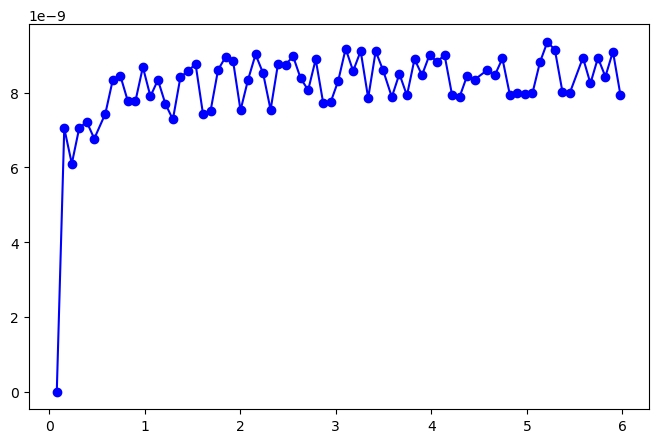

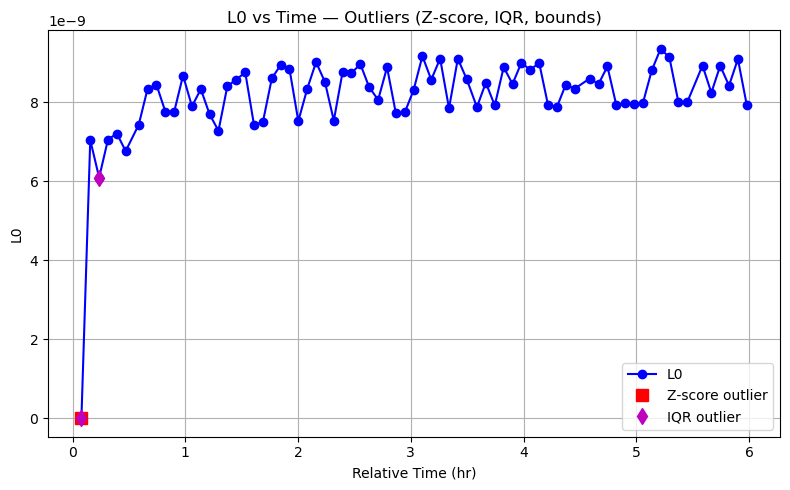

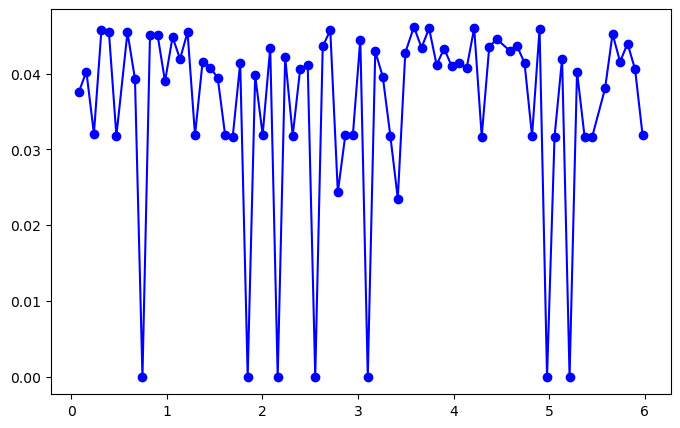

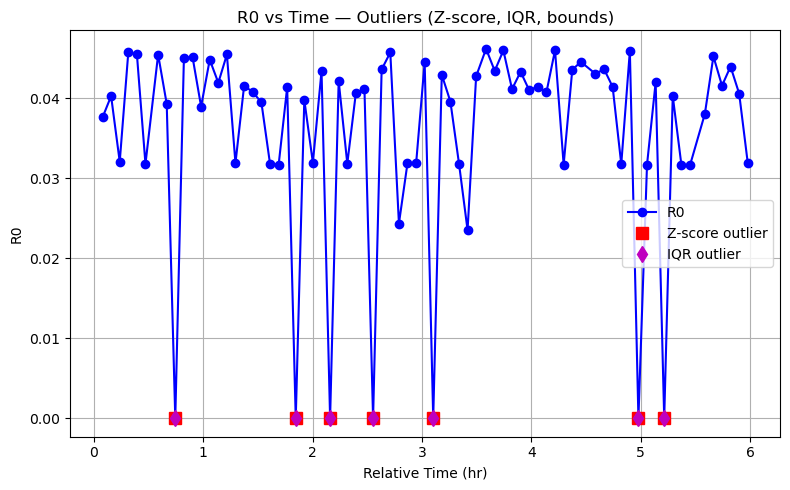

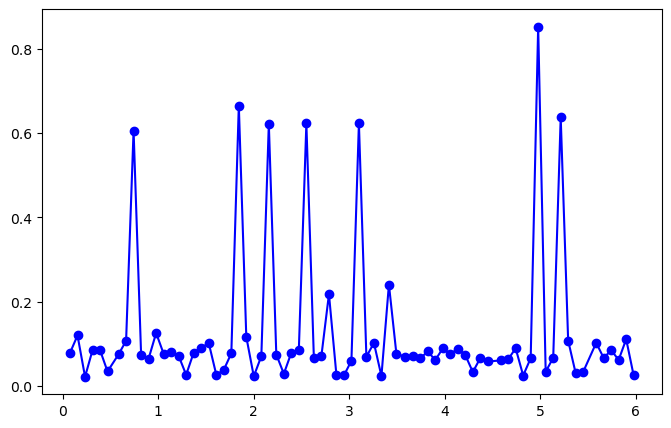

...

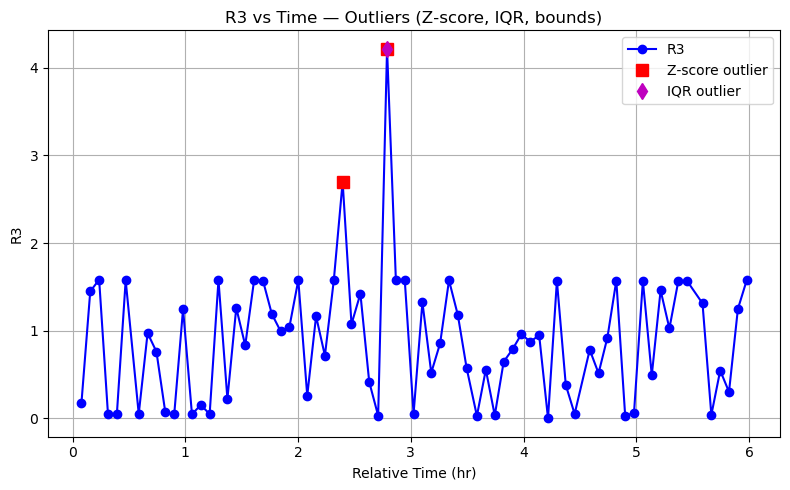

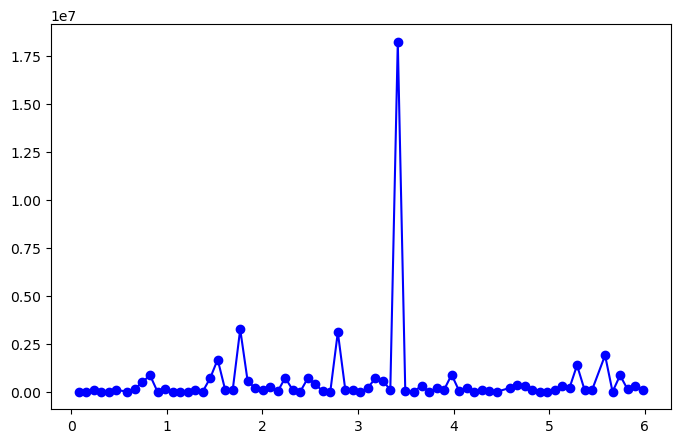

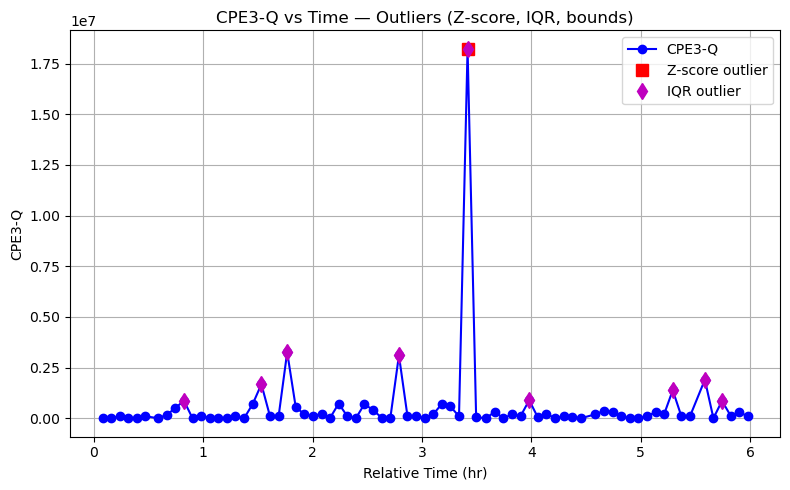

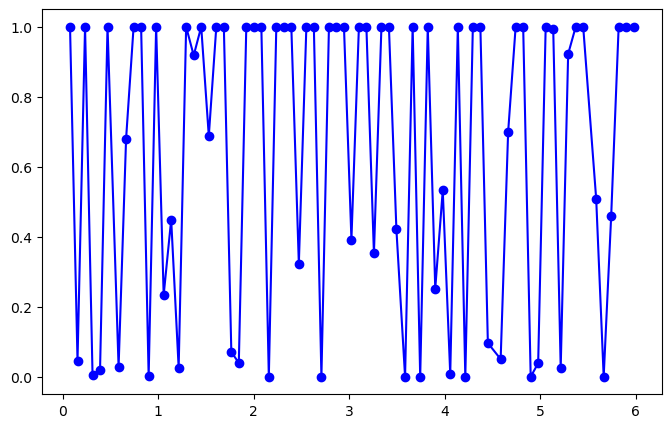

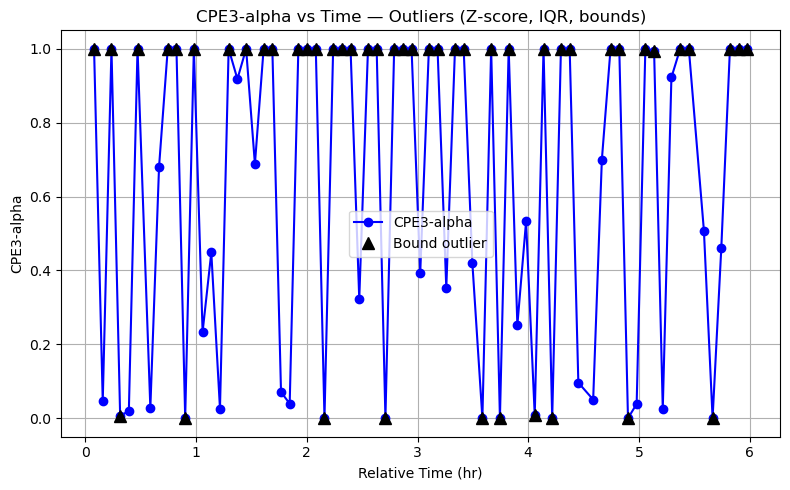

In [4]:
###############################################################################
# 6. PLOT ADVANCED MODEL PARAMETERS VS. EXPERIMENTAL VALUES WITH OUTLIER DETECTION
###############################################################################
# Expand advanced model parameters into separate columns
param_names = advanced_model_info["param_names"]
for i, pname in enumerate(param_names):
    fit_df[pname] = fit_df["params"].apply(lambda x: x[i] if len(x) > i else np.nan)

# Merge relative time from df_eis if not already present
if "RelTime_hr" not in fit_df.columns:
    rel_time = df_eis.groupby("sweep_id")["RelTime_hr"].mean().reset_index()
    fit_df = pd.merge(fit_df, rel_time, on="sweep_id", how="left")

# Plot each parameter vs. relative time and highlight outliers
for pname in param_names:
    plt.figure(figsize=(8, 5))
    plt.plot(fit_df["RelTime_hr"], fit_df[pname], 'bo-', label=f'{pname} (Fitted Advanced ECM)')

    # --- Z‑score outliers for most parameters ---
    z_scores = (fit_df[pname] - fit_df[pname].mean()) / fit_df[pname].std()
    z_outliers = fit_df[abs(z_scores) > 2]

    # --- IQR outliers for alpha (as before) ---
    Q1, Q3 = fit_df[pname].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    iqr_mask = (fit_df[pname] < (Q1 - 1.5 * IQR)) | (fit_df[pname] > (Q3 + 1.5 * IQR))
    iqr_outliers = fit_df[iqr_mask]

    # --- Bound‐violation outliers for alpha at 0 or 1 ---
    if 'alpha' in pname.lower():
        bound_mask = (fit_df[pname] <= 0.01) | (fit_df[pname] >= 0.99)
        bound_outliers = fit_df[bound_mask]
    else:
        bound_outliers = pd.DataFrame()

    # Plot the data
    plt.figure(figsize=(8,5))
    plt.plot(fit_df["RelTime_hr"], fit_df[pname], 'bo-', label=f'{pname}')
    if not z_outliers.empty:
        plt.plot(z_outliers["RelTime_hr"], z_outliers[pname], 'rs', markersize=8, label='Z‑score outlier')
    if not iqr_outliers.empty:
        plt.plot(iqr_outliers["RelTime_hr"], iqr_outliers[pname], 'md', markersize=8, label='IQR outlier')
    if not bound_outliers.empty:
        plt.plot(bound_outliers["RelTime_hr"], bound_outliers[pname], 'k^', markersize=8, label='Bound outlier')

    plt.xlabel("Relative Time (hr)")
    plt.ylabel(pname)
    plt.title(f"{pname} vs Time — Outliers (Z‑score, IQR, bounds)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

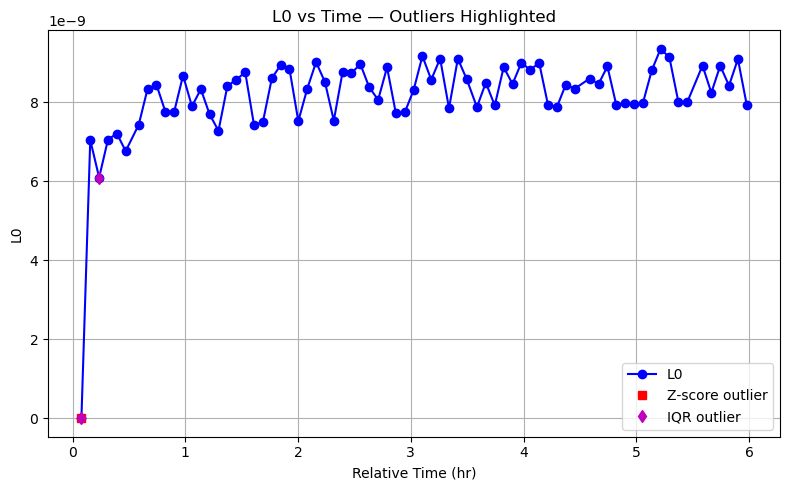

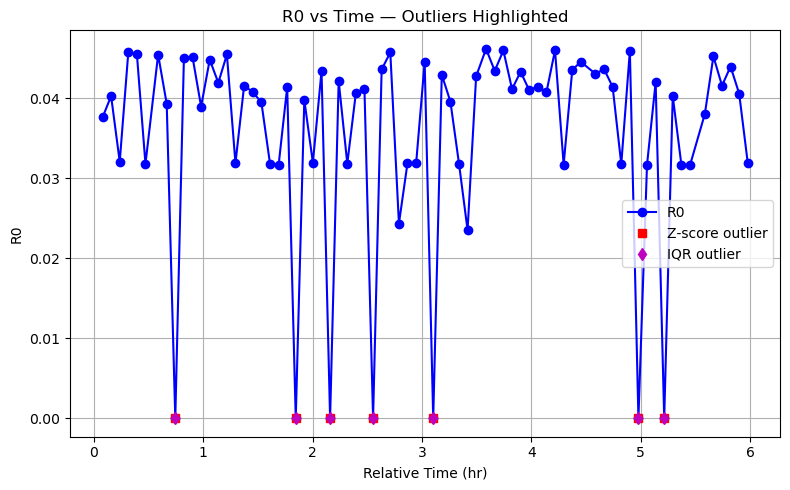

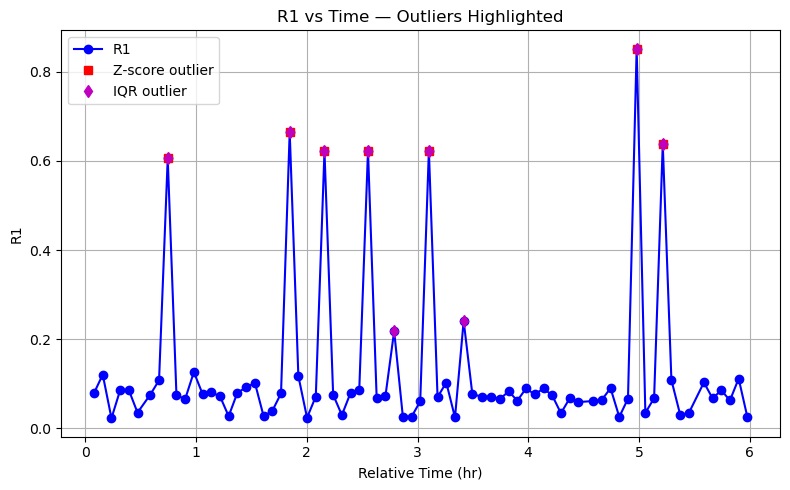

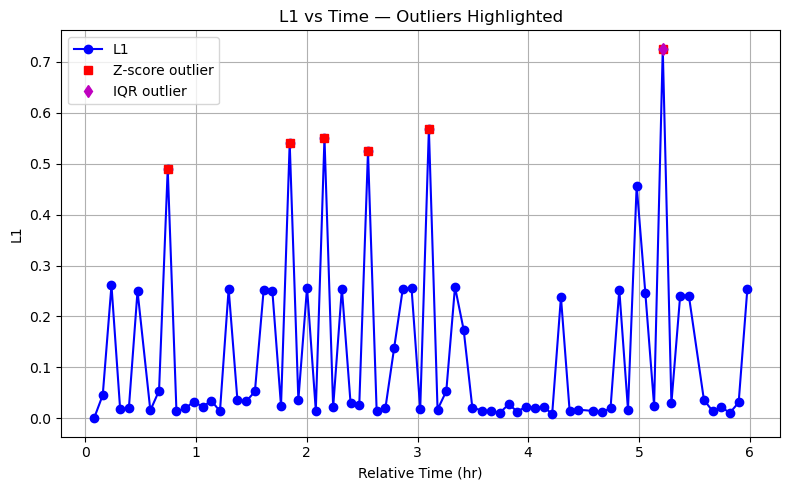

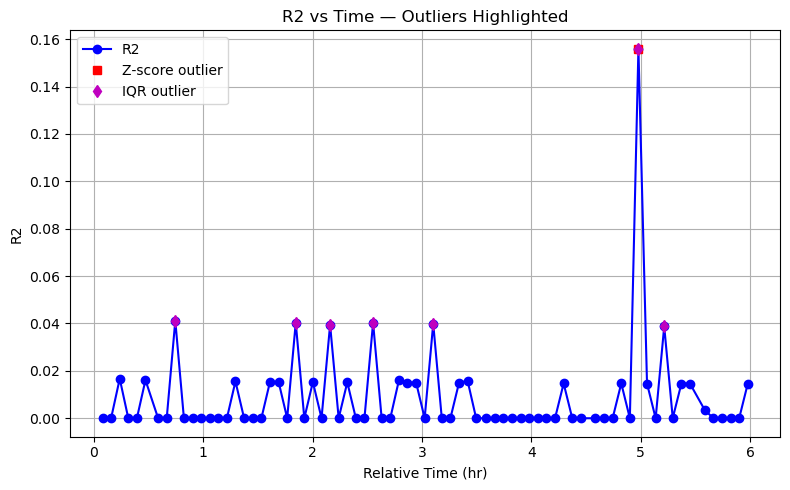

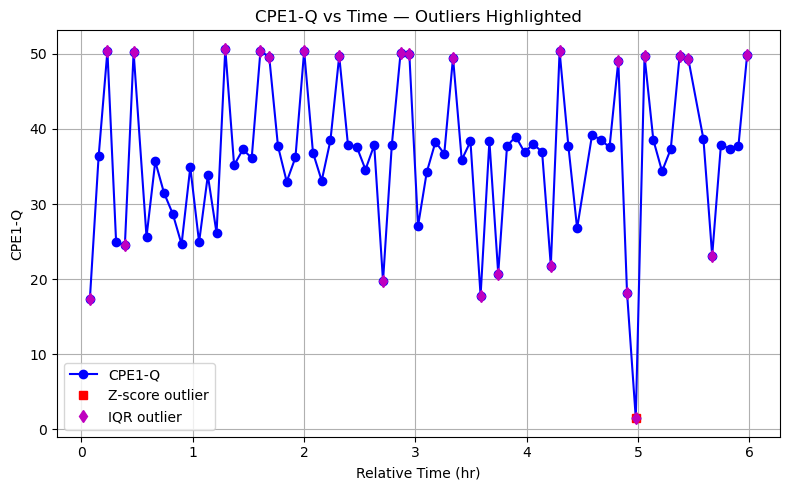

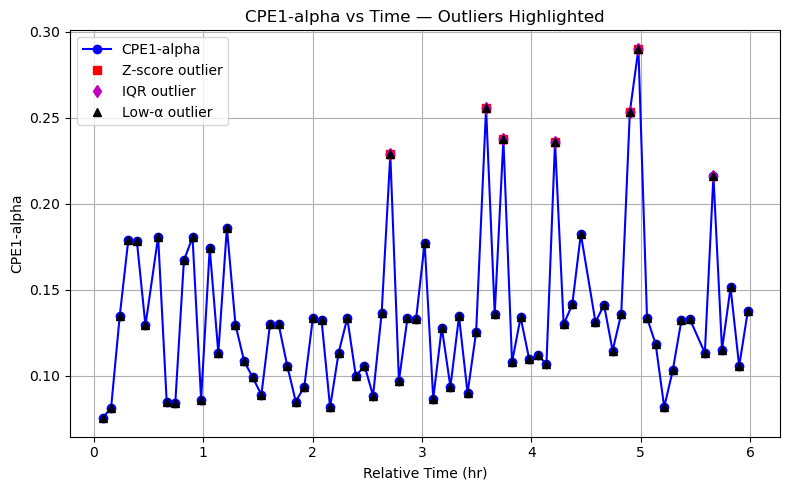

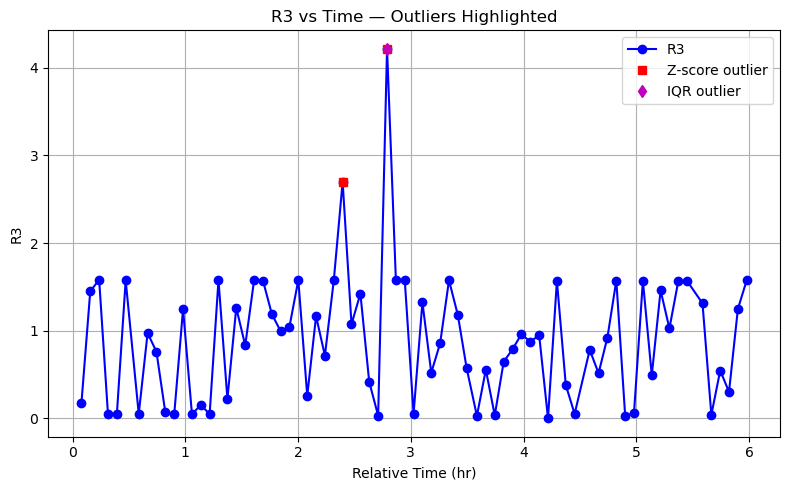

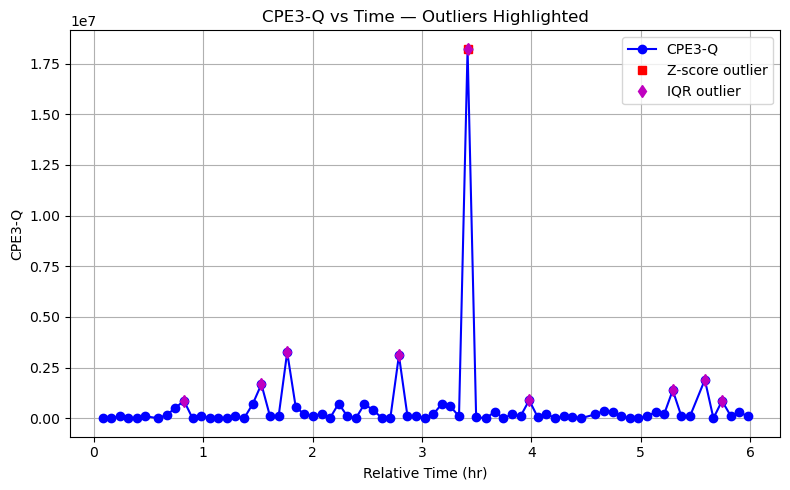

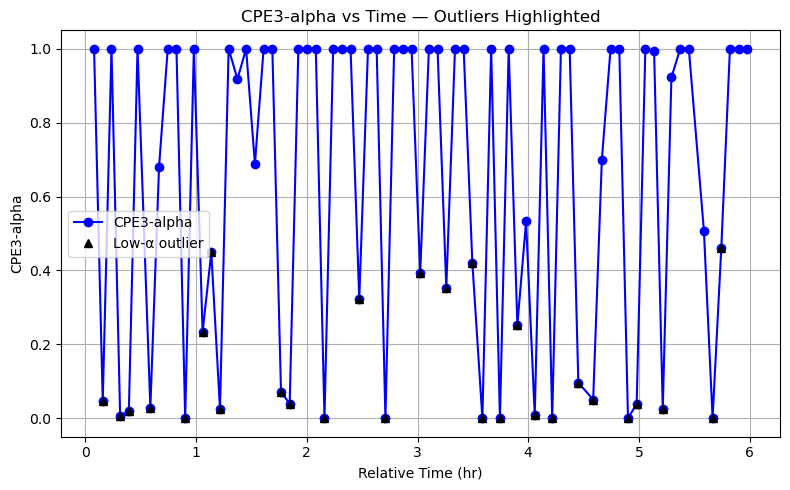

In [5]:
for pname in param_names:
    plt.figure(figsize=(8,5))
    plt.plot(fit_df["RelTime_hr"], fit_df[pname], 'bo-', label=pname)

    # Z‑score
    z_scores = (fit_df[pname] - fit_df[pname].mean()) / fit_df[pname].std()
    z_out = fit_df[abs(z_scores) > 2]
    if not z_out.empty:
        plt.plot(z_out["RelTime_hr"], z_out[pname], 'rs', label='Z‑score outlier')

    # IQR
    Q1, Q3 = fit_df[pname].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    iqr_mask = (fit_df[pname] < Q1 - 1.5*IQR) | (fit_df[pname] > Q3 + 1.5*IQR)
    iqr_out = fit_df[iqr_mask]
    if not iqr_out.empty:
        plt.plot(iqr_out["RelTime_hr"], iqr_out[pname], 'md', label='IQR outlier')

    # α‐bound (flag low α)
    if 'alpha' in pname.lower():
        bound_mask = fit_df[pname] < 0.5
        bound_out = fit_df[bound_mask]
        if not bound_out.empty:
            plt.plot(bound_out["RelTime_hr"], bound_out[pname], 'k^', label='Low‑α outlier')

    plt.xlabel("Relative Time (hr)")
    plt.ylabel(pname)
    plt.title(f"{pname} vs Time — Outliers Highlighted")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [7]:
###############################################################################
# 8. OUTLIER VS MAJORITY RMSE COMPARISON & VISUALIZATION
###############################################################################
# 1) Tag each sweep as outlier or majority
#    Here we define alpha‐outliers as those with any alpha < 0.5
alpha_cols = [c for c in param_names if 'alpha' in c.lower()]
fit_df['is_alpha_outlier'] = fit_df[alpha_cols].min(axis=1) < 0.5

# 2) Compute and print mean & median RMSE for majority vs outliers
maj = fit_df[~fit_df['is_alpha_outlier']]
out = fit_df[ fit_df['is_alpha_outlier']]

maj_mean = maj['rmse'].mean()    if not maj.empty else np.nan
maj_med  = maj['rmse'].median()  if not maj.empty else np.nan
out_mean = out['rmse'].mean()    if not out.empty else np.nan
out_med  = out['rmse'].median()  if not out.empty else np.nan

print("RMSE statistics:")
print(f"  Majority fits: mean RMSE = {maj_mean:.3e}, median RMSE = {maj_med:.3e}, count = {len(maj)}")
print(f"  Outlier  fits: mean RMSE = {out_mean:.3e}, median RMSE = {out_med:.3e}, count = {len(out)}")

# 3) Visualize examples if possible
if not maj.empty and not out.empty:
    best_maj_id = maj.loc[maj['rmse'].idxmin(), 'sweep_id']
    worst_out_id = out.loc[out['rmse'].idxmax(), 'sweep_id']

    print(f"\nPlotting lowest‐RMSE majority (sweep {best_maj_id}) and highest‐RMSE outlier (sweep {worst_out_id})")

    def plot_example(sweep_id, label):
        grp = df_eis[df_eis['sweep_id']==sweep_id].sort_values('frequency')
        freq = grp['frequency'].values
        Z_exp = grp['Z_real'].values + 1j*(-grp['Z_imag_neg'].values)
        row = fit_df[fit_df['sweep_id']==sweep_id].iloc[0]
        circuit = CustomCircuit(circuit=advanced_model_info['circuit'],
                                initial_guess=advanced_model_info['initial_guess'])
        circuit.parameters_ = row['params']
        Z_fit = circuit.predict(freq)
        plt.figure(figsize=(6,5))
        plt.plot(Z_exp.real, -Z_exp.imag, 'o', label='Experimental', markersize=4)
        plt.plot(Z_fit.real, -Z_fit.imag, '-', label=f'{label} fit (RMSE={row["rmse"]:.2e})', linewidth=2)
        plt.xlabel("Z' (Ω)"); plt.ylabel("-Z'' (Ω)")
        plt.title(f"Sweep {sweep_id} — {label}")
        plt.legend(); plt.grid(alpha=0.3); plt.show()

    plot_example(best_maj_id, "Best Majority")
    plot_example(worst_out_id, "Worst Outlier")
else:
    print("Not enough data in one of the groups to plot examples.")

# pick the lowest‐RMSE majority and highest‐RMSE outlier
maj = fit_df[~fit_df['is_alpha_outlier']]
out = fit_df[ fit_df['is_alpha_outlier']]

best_maj = maj.loc[maj['rmse'].idxmin(),'sweep_id']
worst_out = out.loc[out['rmse'].idxmax(),'sweep_id']

print(f"\nPlotting best majority (sweep {best_maj}) and worst outlier (sweep {worst_out})")
plot_example(best_maj, 'majority')
plot_example(worst_out, 'outlier')

RMSE statistics:
  Majority fits: mean RMSE = nan, median RMSE = nan, count = 0
  Outlier  fits: mean RMSE = 1.205e-03, median RMSE = 9.661e-04, count = 74
Not enough data in one of the groups to plot examples.


ValueError: attempt to get argmin of an empty sequence

All flagged by α; using RMSE Z‑score >2 as outlier rule instead.
RMSE stats:
  Majority (73): mean=1.179e-03, median=9.658e-04
  Outliers(1): mean=3.102e-03, median=3.102e-03
Plotting best majority (sweep 10) and worst outlier (sweep 1)


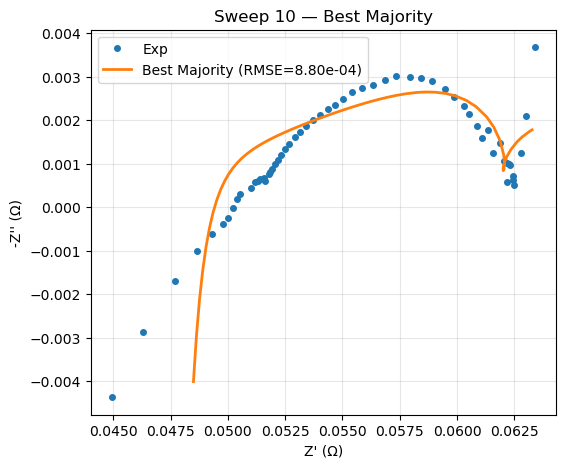

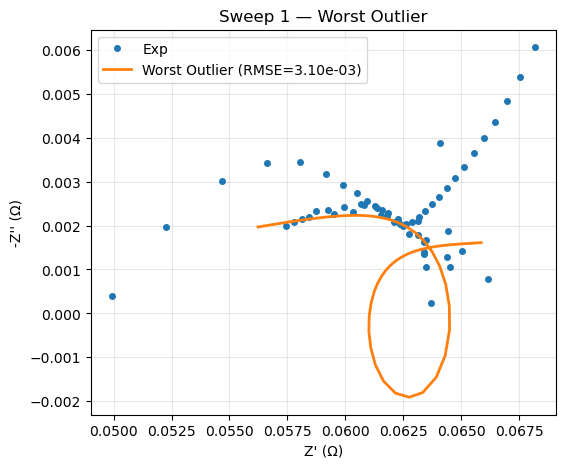


Plotting best majority (sweep 10) and worst outlier (sweep 1)


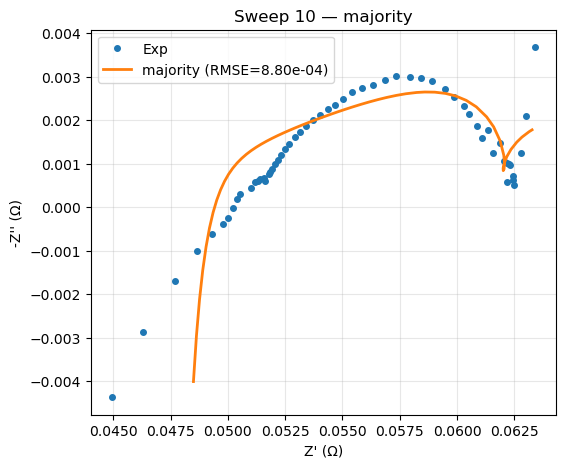

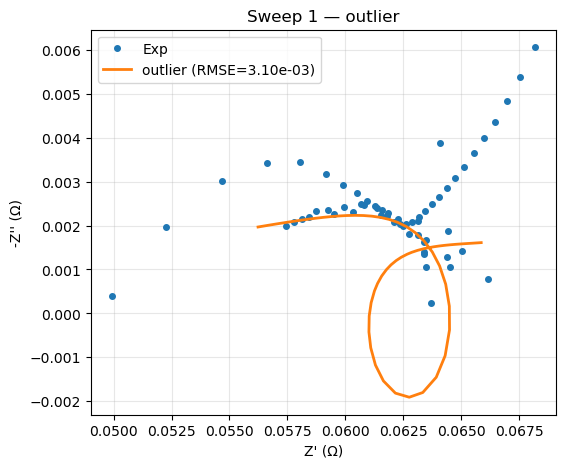

In [16]:
# 1) Tag each sweep as α‐outlier
alpha_cols = [c for c in param_names if 'alpha' in c.lower()]
alpha_mask = fit_df[alpha_cols].min(axis=1) < 0.5 #we change alpha threshold to plot the outliers, 

#If “majority” is empty, the script will auto‑switch to the RMSE Z‑score rule.

# If that rule tags everything, fall back to RMSE Z‑score
if alpha_mask.all():
    z = (fit_df['rmse'] - fit_df['rmse'].mean()) / fit_df['rmse'].std()
    alpha_mask = abs(z) > 2
    print("All flagged by α; using RMSE Z‑score >2 as outlier rule instead.")

fit_df['is_alpha_outlier'] = alpha_mask

# 2) Compute & print RMSE stats
maj = fit_df[~fit_df['is_alpha_outlier']]
out = fit_df[ fit_df['is_alpha_outlier']]

print("RMSE stats:")
print(f"  Majority ({len(maj)}): mean={maj['rmse'].mean():.3e}, median={maj['rmse'].median():.3e}")
print(f"  Outliers({len(out)}): mean={out['rmse'].mean():.3e}, median={out['rmse'].median():.3e}")

# 3) Plot examples if both nonempty
if not maj.empty and not out.empty:
    best_maj = maj.loc[maj['rmse'].idxmin(), 'sweep_id']
    worst_out = out.loc[out['rmse'].idxmax(), 'sweep_id']
    print(f"Plotting best majority (sweep {best_maj}) and worst outlier (sweep {worst_out})")

    def plot_example(sweep_id, label):
        grp = df_eis[df_eis['sweep_id']==sweep_id].sort_values('frequency')
        freq = grp['frequency'].values
        Zexp = grp['Z_real'].values + 1j*(-grp['Z_imag_neg'].values)
        row = fit_df[fit_df['sweep_id']==sweep_id].iloc[0]
        circ = CustomCircuit(circuit=advanced_model_info['circuit'],
                             initial_guess=advanced_model_info['initial_guess'])
        circ.parameters_ = row['params']
        Zfit = circ.predict(freq)
        plt.figure(figsize=(6,5))
        plt.plot(Zexp.real, -Zexp.imag, 'o', label='Exp', markersize=4)
        plt.plot(Zfit.real, -Zfit.imag, '-', label=f'{label} (RMSE={row["rmse"]:.2e})', lw=2)
        plt.xlabel("Z' (Ω)"); plt.ylabel("-Z'' (Ω)")
        plt.title(f"Sweep {sweep_id} — {label}")
        plt.legend(); plt.grid(alpha=0.3); plt.show()

    plot_example(best_maj, "Best Majority")
    plot_example(worst_out, "Worst Outlier")
else:
    print("Cannot plot examples: one group is empty.")
# pick the lowest‐RMSE majority and highest‐RMSE outlier
maj = fit_df[~fit_df['is_alpha_outlier']]
out = fit_df[ fit_df['is_alpha_outlier']]

best_maj = maj.loc[maj['rmse'].idxmin(),'sweep_id']
worst_out = out.loc[out['rmse'].idxmax(),'sweep_id']

print(f"\nPlotting best majority (sweep {best_maj}) and worst outlier (sweep {worst_out})")
plot_example(best_maj, 'majority')
plot_example(worst_out, 'outlier')

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 75/75 [00:06<00:00, 10.98it/s]


Majority: mean RMSE 0.023262275314166716 median 0.023262275314166716
Outliers: mean RMSE 0.0012053117986798058 median 0.0009660847631716865


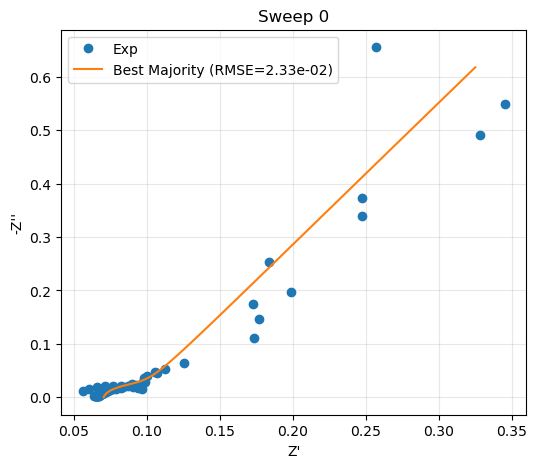

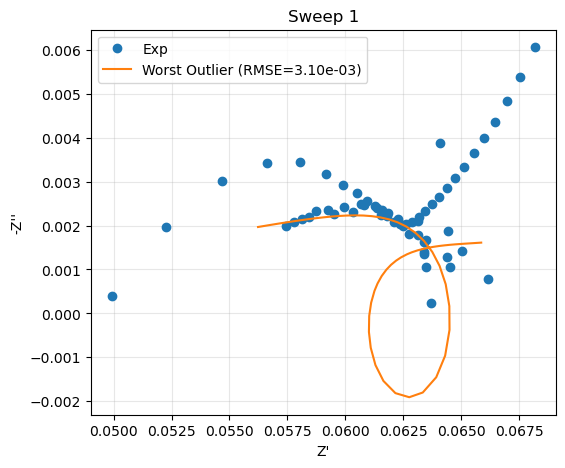

Sweep 1 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=3.10e-03, new RMSE=3.01e-03


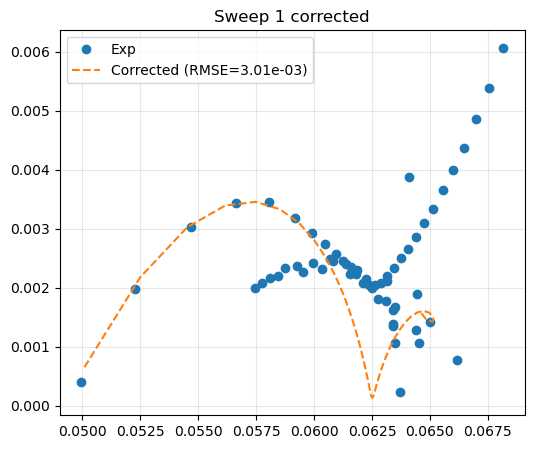

Sweep 2 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.43e-04, new RMSE=9.76e-04


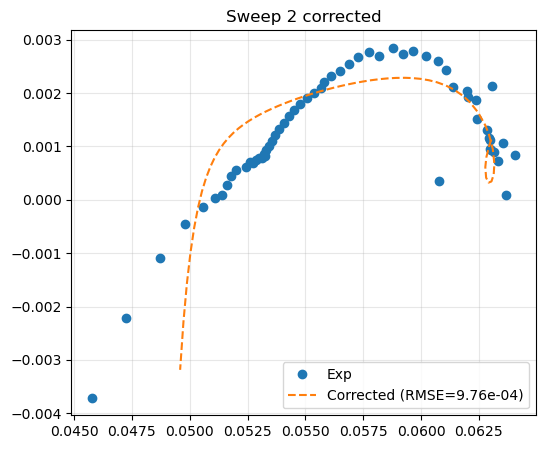

Sweep 3 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.04e-03, new RMSE=9.79e-04


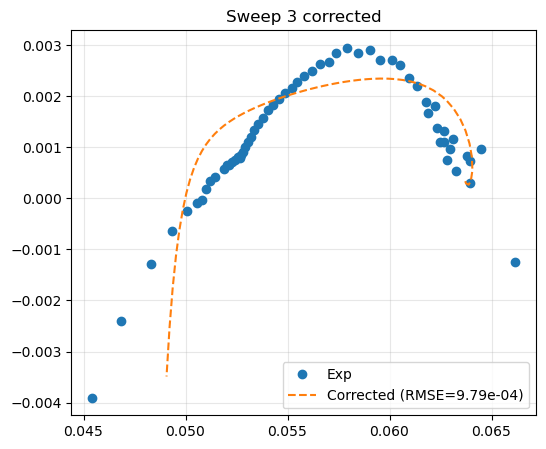

Sweep 4 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.25e-04, new RMSE=1.01e-03


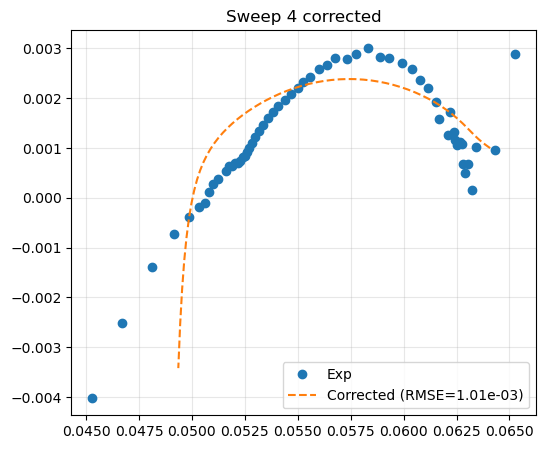

Sweep 5 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.69e-04, new RMSE=9.62e-04


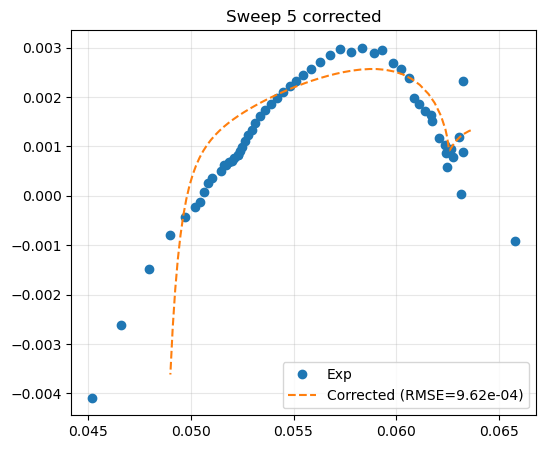

Sweep 6 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.00e-03, new RMSE=9.52e-04


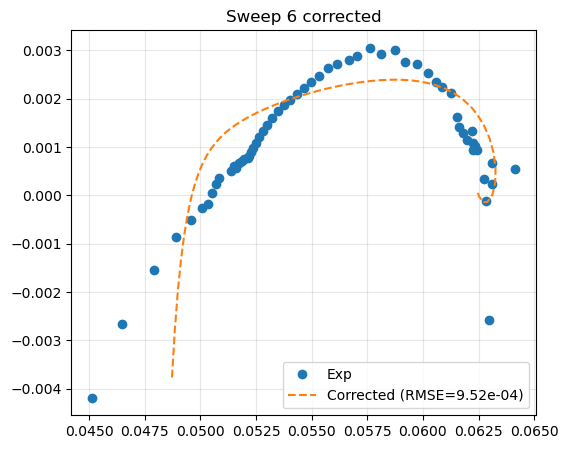

Sweep 7 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.18e-04, new RMSE=9.16e-04


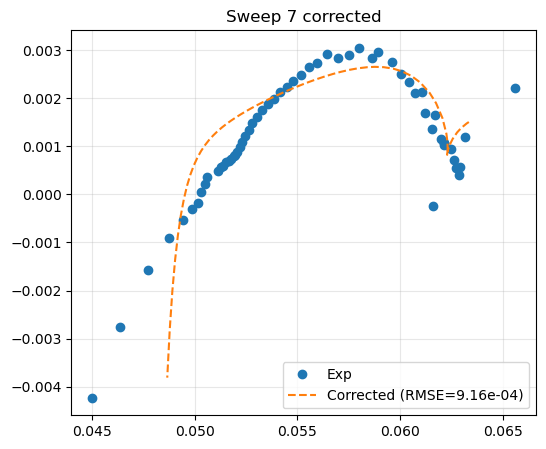

Sweep 8 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.60e-04, new RMSE=1.08e-03


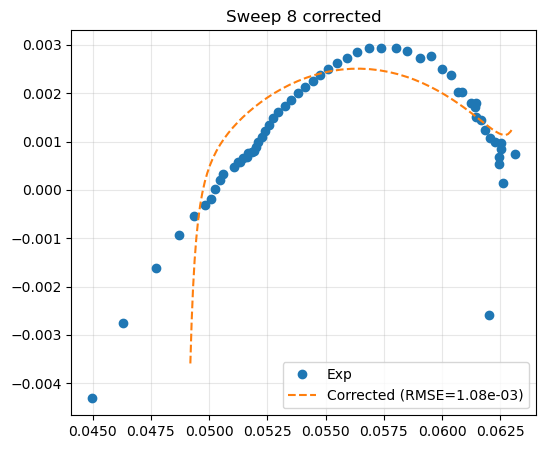

Sweep 9 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.66e-04, new RMSE=9.52e-04


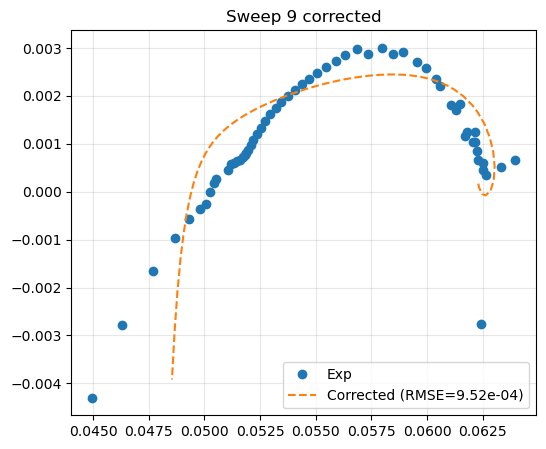

Sweep 10 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.80e-04, new RMSE=9.38e-04


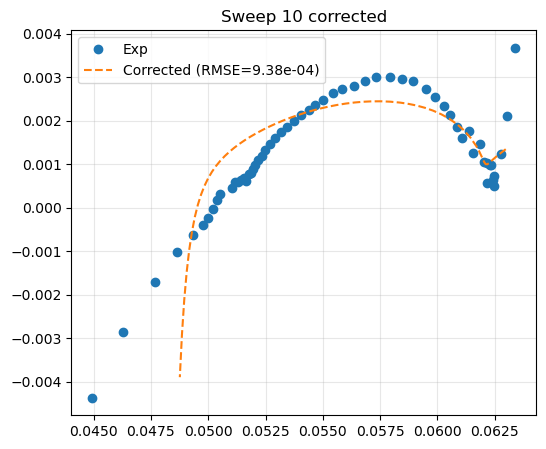

Sweep 11 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.01e-04, new RMSE=1.05e-03


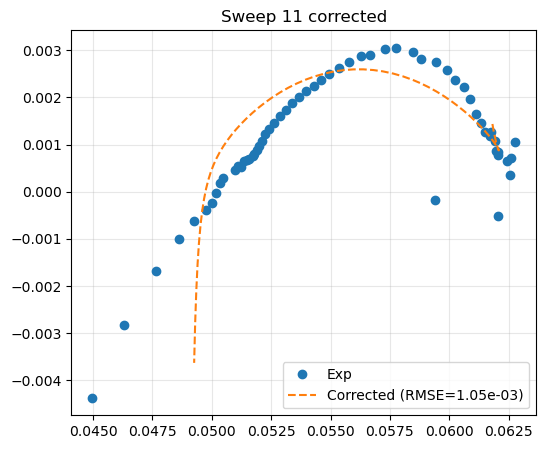

Sweep 12 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.16e-04, new RMSE=9.26e-04


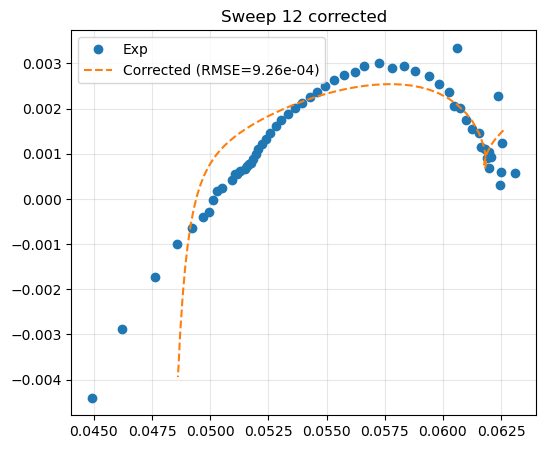

Sweep 13 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.33e-04, new RMSE=9.31e-04


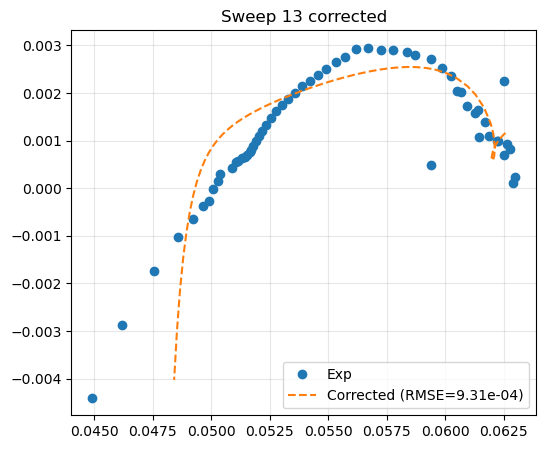

Sweep 14 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.30e-04, new RMSE=1.03e-03


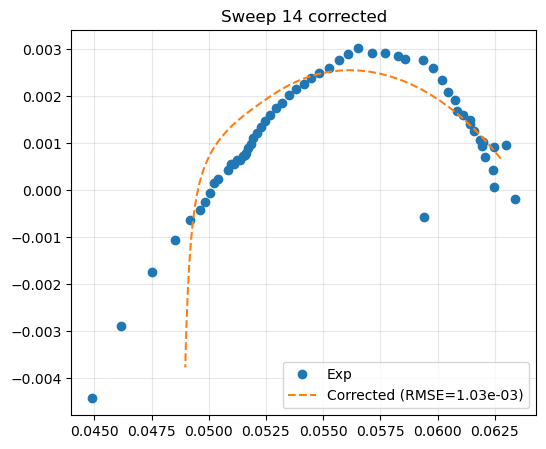

Sweep 15 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.29e-04, new RMSE=9.25e-04


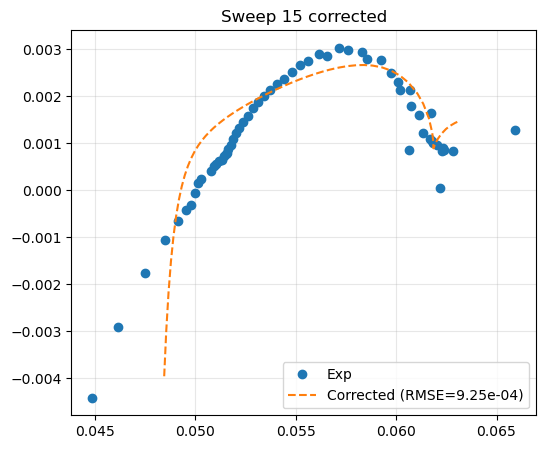

Sweep 16 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.05e-03, new RMSE=9.51e-04


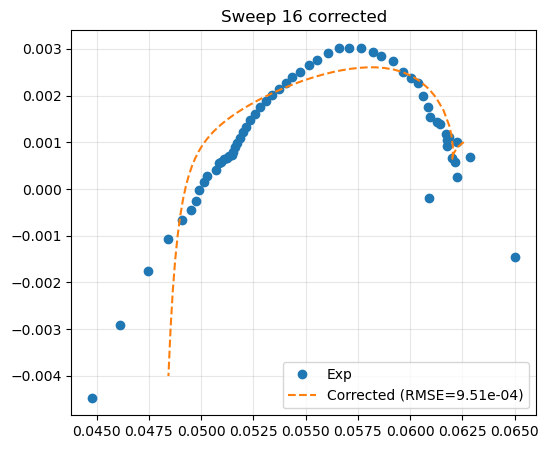

Sweep 17 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.07e-04, new RMSE=8.97e-04


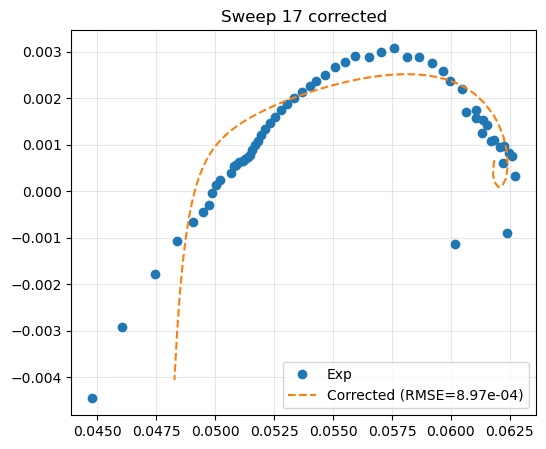

Sweep 18 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.99e-04, new RMSE=9.95e-04


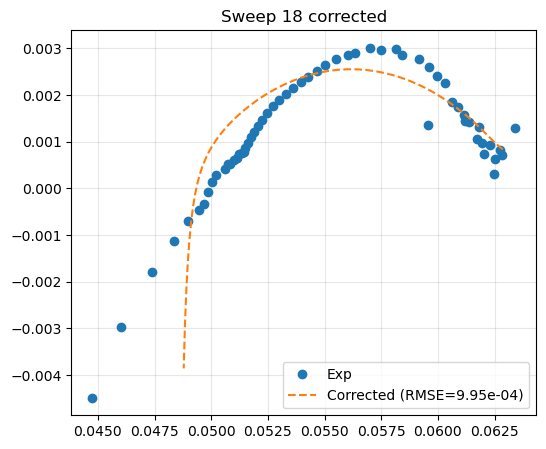

Sweep 19 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.65e-04, new RMSE=9.45e-04


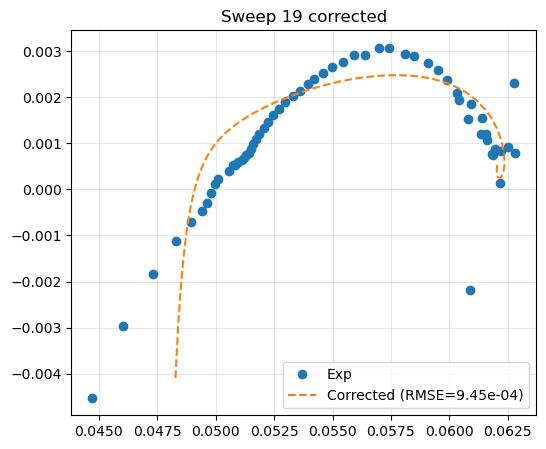

Sweep 20 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.03e-03, new RMSE=9.54e-04


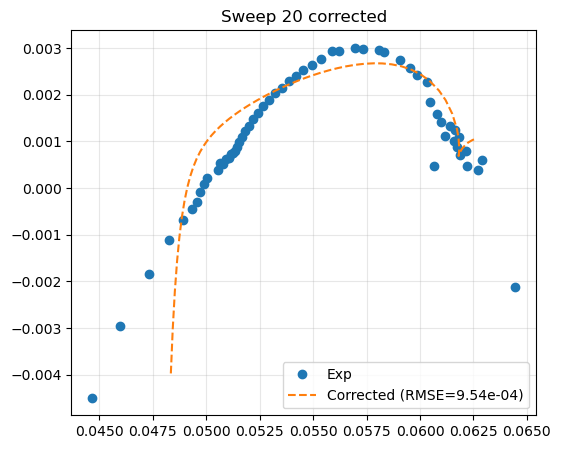

Sweep 21 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.96e-03, new RMSE=9.30e-04


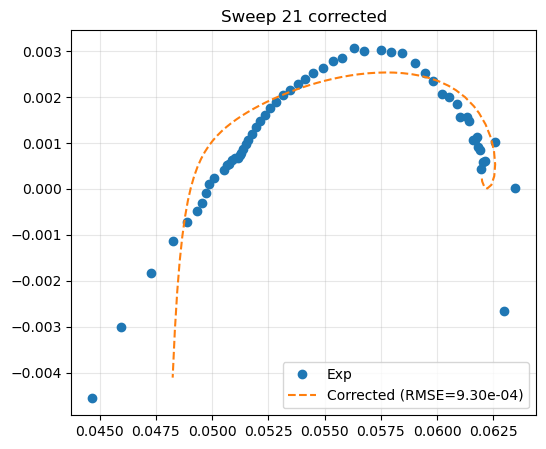

Sweep 22 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.02e-04, new RMSE=8.96e-04


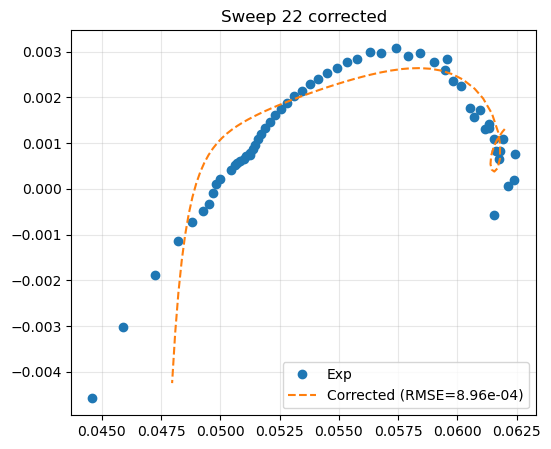

Sweep 23 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.60e-04, new RMSE=9.25e-04


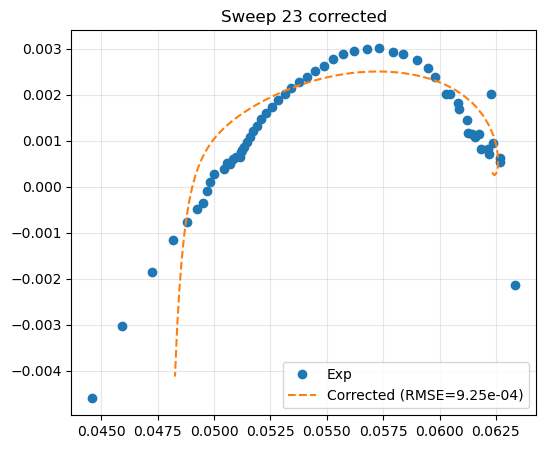

Sweep 24 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.51e-04, new RMSE=9.04e-04


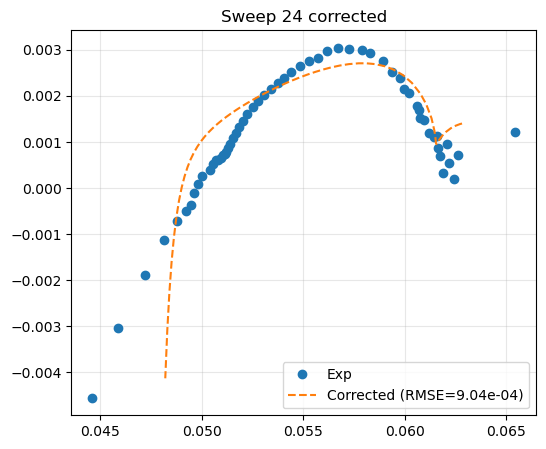

Sweep 25 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.01e-03, new RMSE=9.54e-04


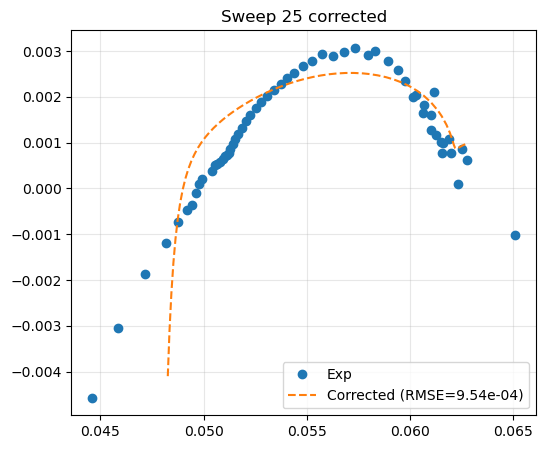

Sweep 26 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.88e-04, new RMSE=8.76e-04


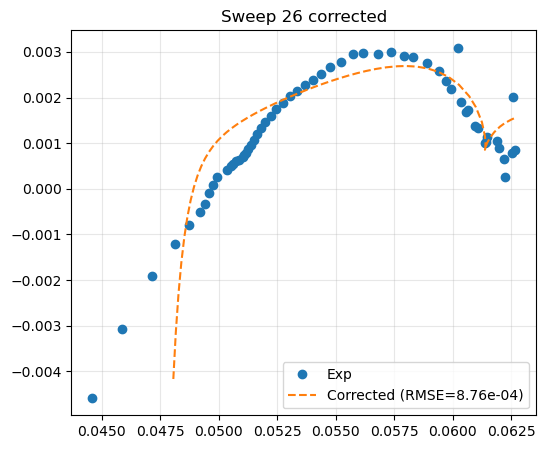

Sweep 27 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.96e-04, new RMSE=9.55e-04


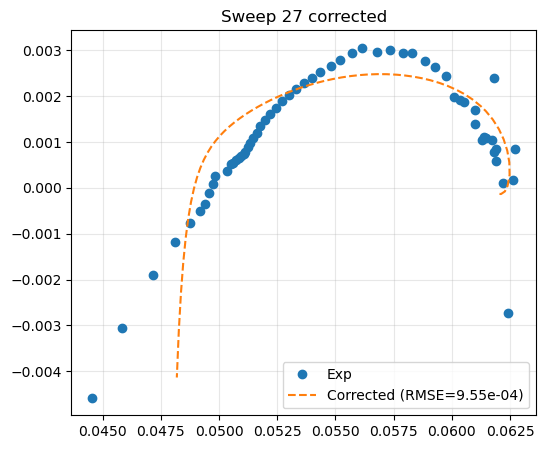

Sweep 28 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.30e-04, new RMSE=9.17e-04


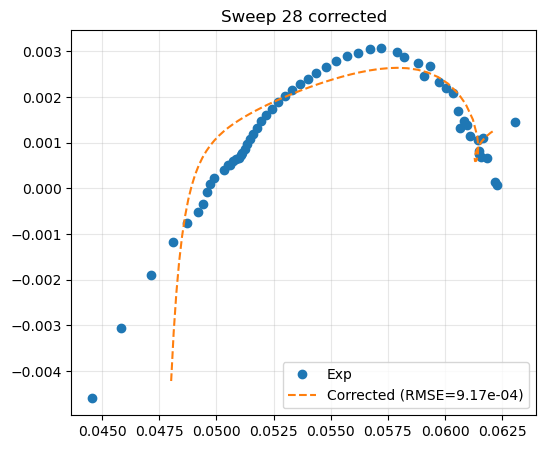

Sweep 29 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.96e-03, new RMSE=9.45e-04


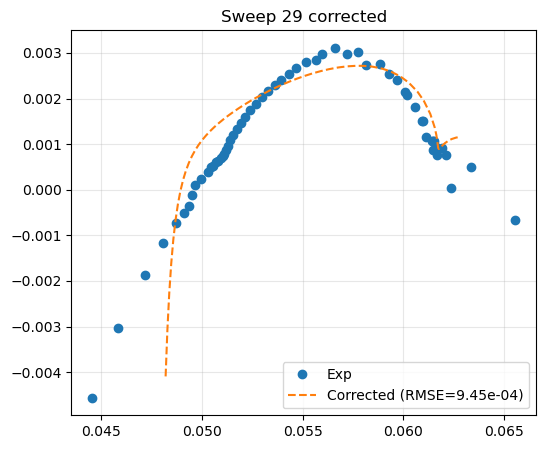

Sweep 30 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.98e-04, new RMSE=8.94e-04


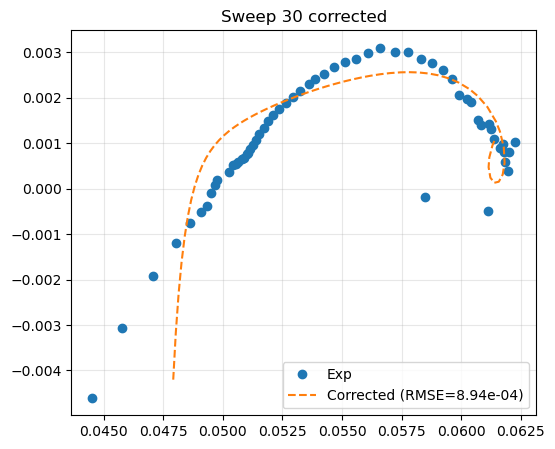

Sweep 31 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.39e-04, new RMSE=1.00e-03


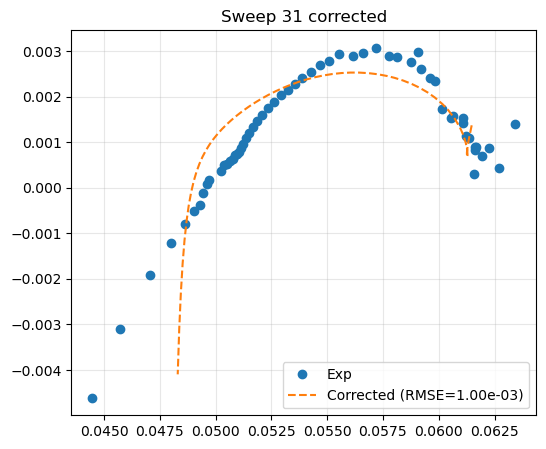

Sweep 32 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.97e-04, new RMSE=9.67e-04


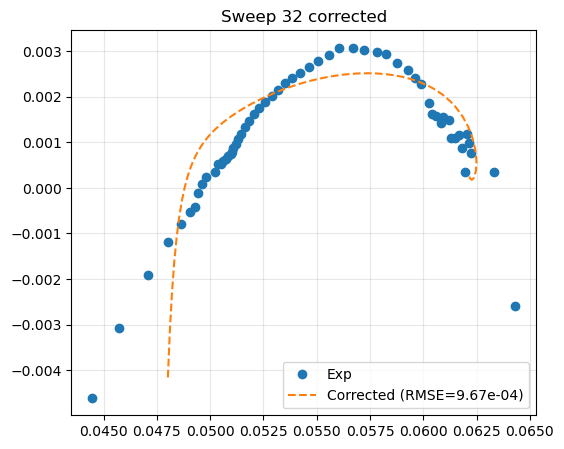

Sweep 33 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.08e-04, new RMSE=8.96e-04


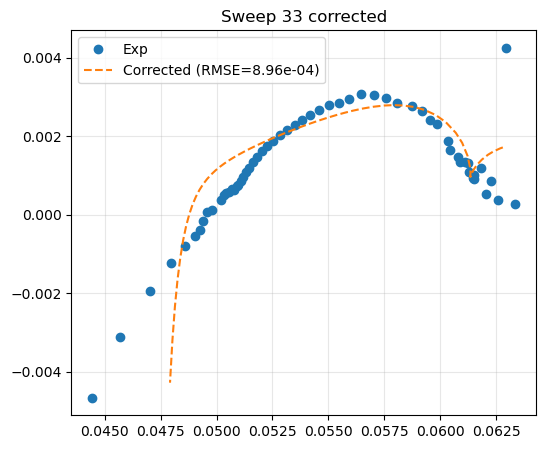

Sweep 34 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.22e-04, new RMSE=9.25e-04


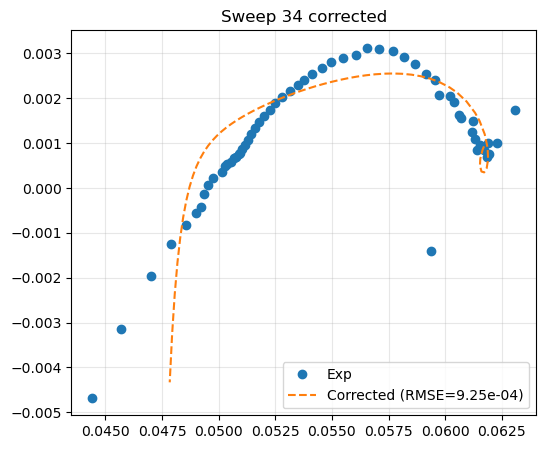

Sweep 35 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.22e-04, new RMSE=9.02e-04


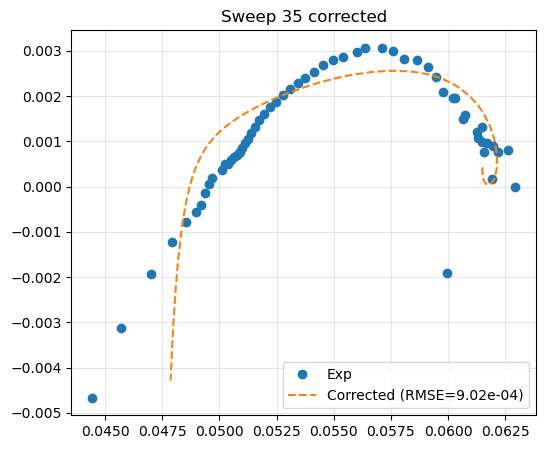

Sweep 36 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.99e-03, new RMSE=9.85e-04


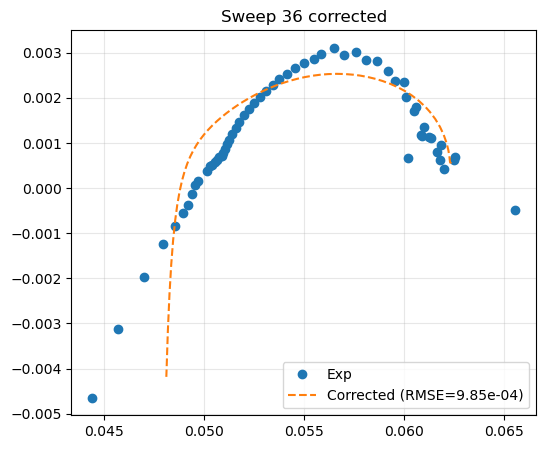

Sweep 37 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.01e-03, new RMSE=9.58e-04


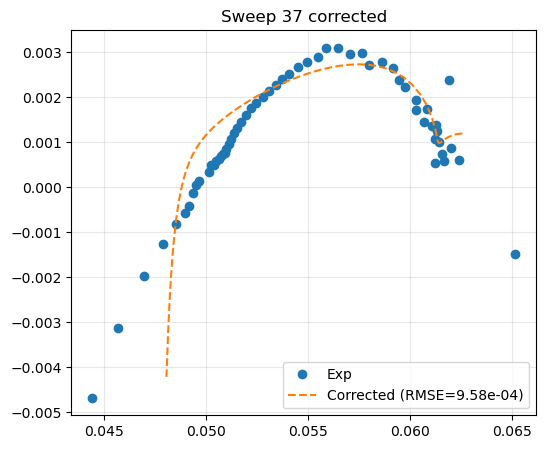

Sweep 38 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.51e-04, new RMSE=9.44e-04


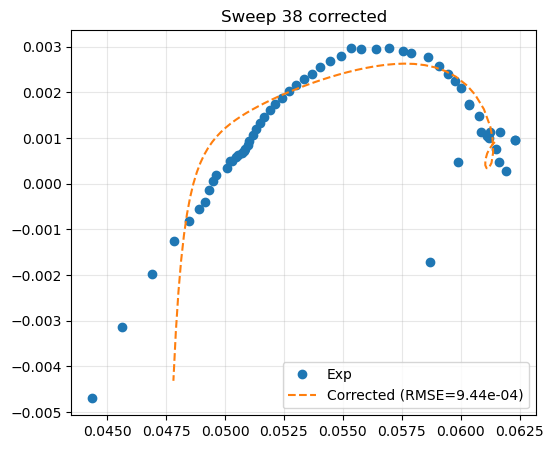

Sweep 39 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.05e-03, new RMSE=1.03e-03


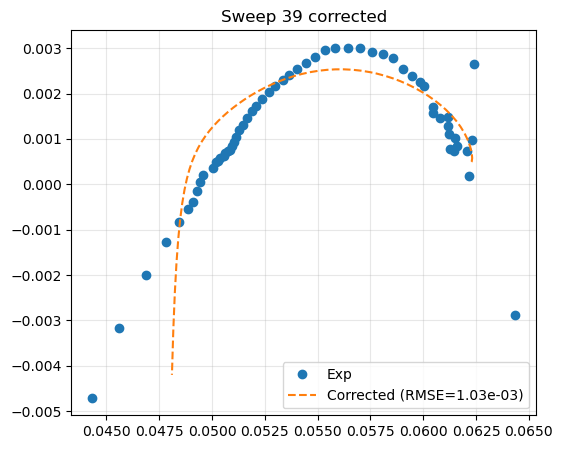

Sweep 40 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.69e-04, new RMSE=9.85e-04


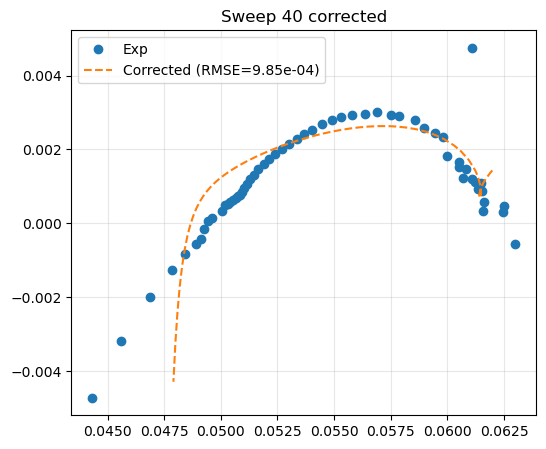

Sweep 41 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.05e-03, new RMSE=1.02e-03


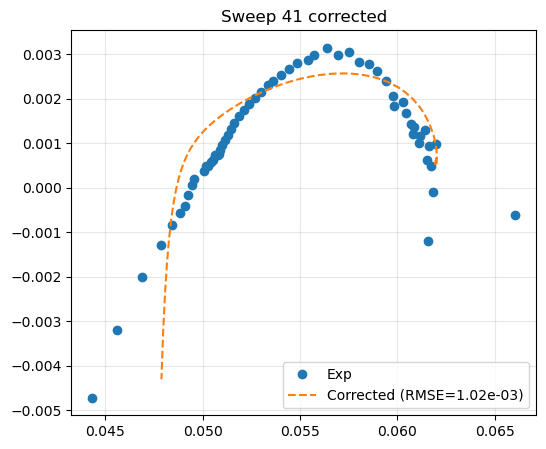

Sweep 42 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.01e-03, new RMSE=9.75e-04


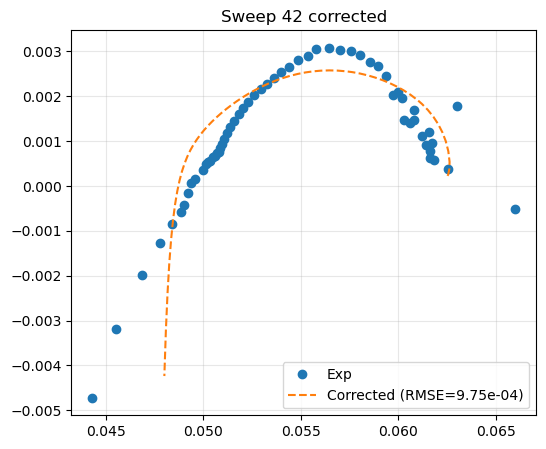

Sweep 43 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.01e-03, new RMSE=9.76e-04


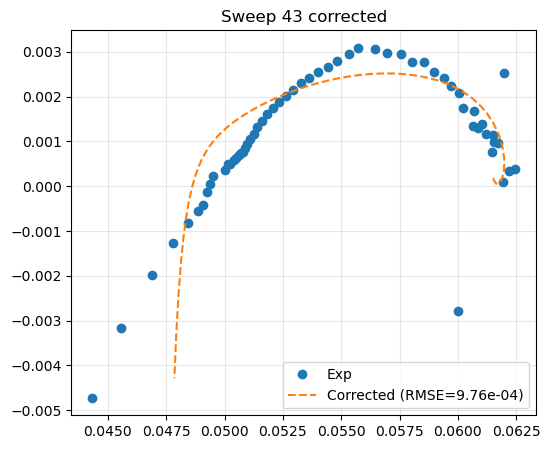

Sweep 44 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.85e-04, new RMSE=8.29e-04


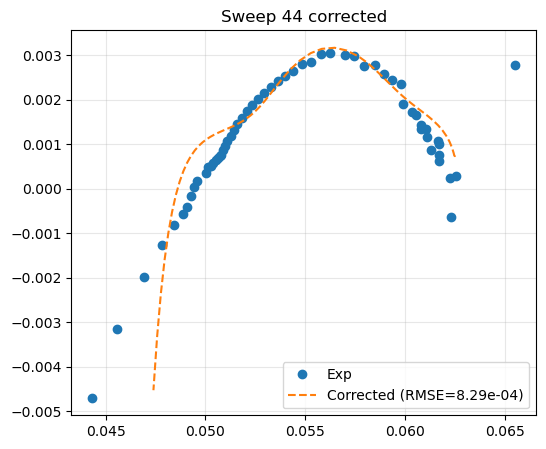

Sweep 45 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.98e-04, new RMSE=9.98e-04


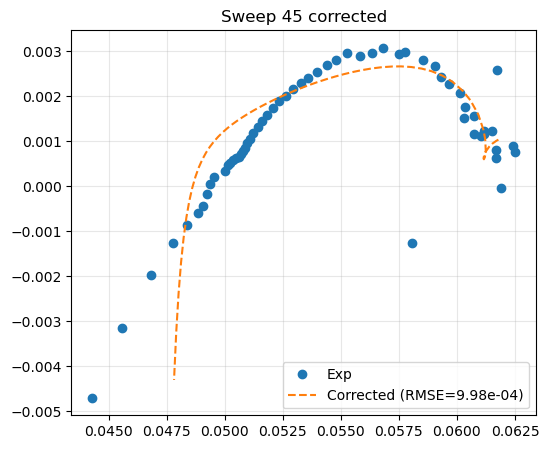

Sweep 46 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.83e-04, new RMSE=9.58e-04


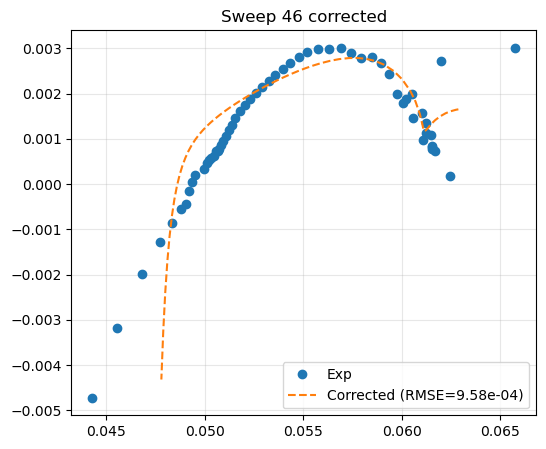

Sweep 47 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.70e-04, new RMSE=9.70e-04


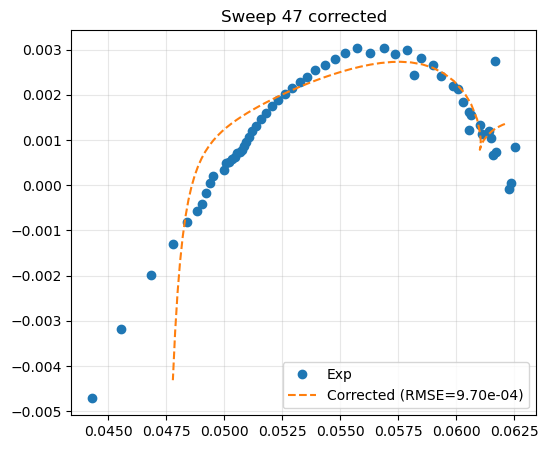

Sweep 48 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.88e-04, new RMSE=9.73e-04


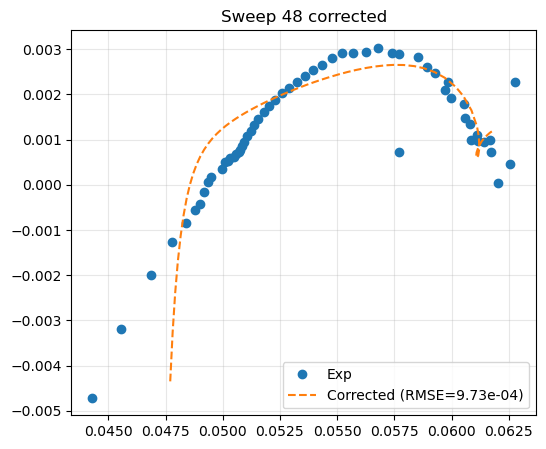

Sweep 49 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.41e-04, new RMSE=1.02e-03


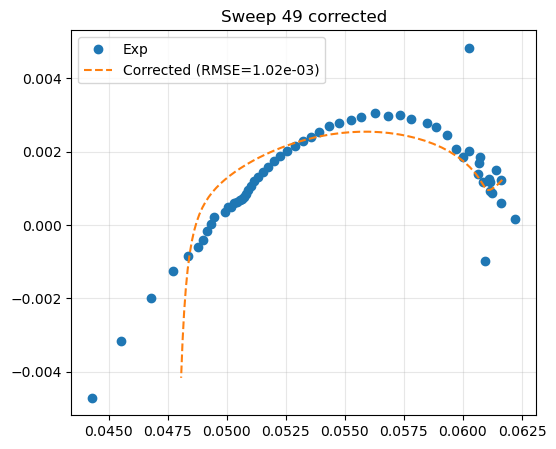

Sweep 50 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.91e-04, new RMSE=9.68e-04


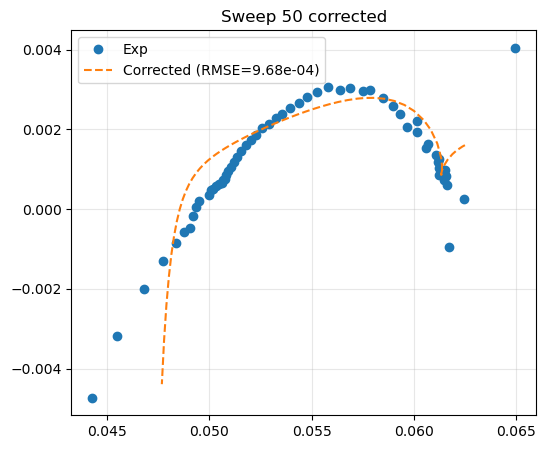

Sweep 51 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.16e-04, new RMSE=1.02e-03


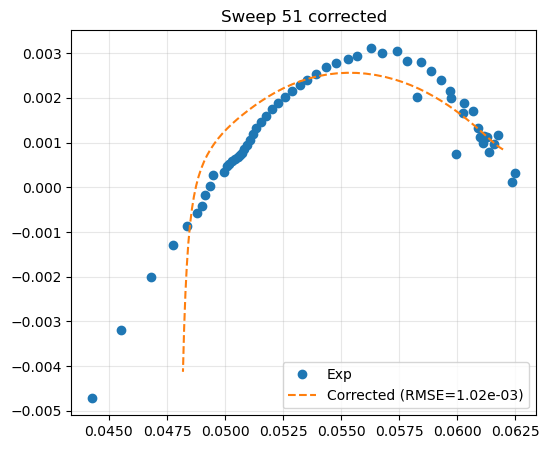

Sweep 52 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.56e-04, new RMSE=1.03e-03


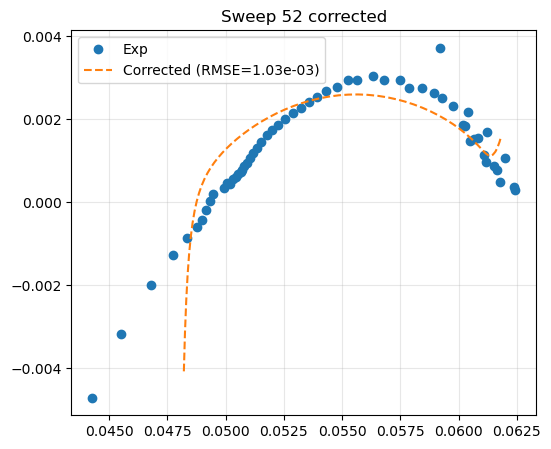

Sweep 53 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.22e-04, new RMSE=9.99e-04


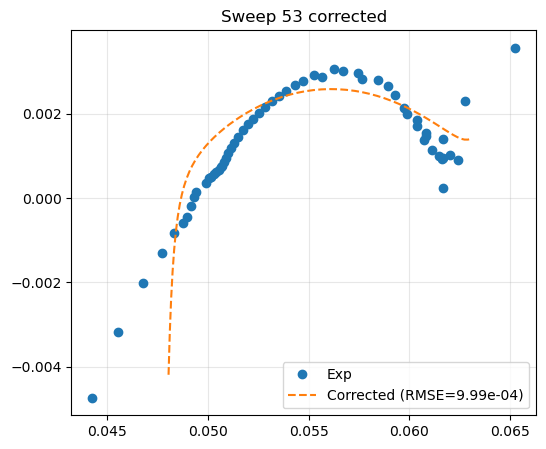

Sweep 54 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.96e-03, new RMSE=1.01e-03


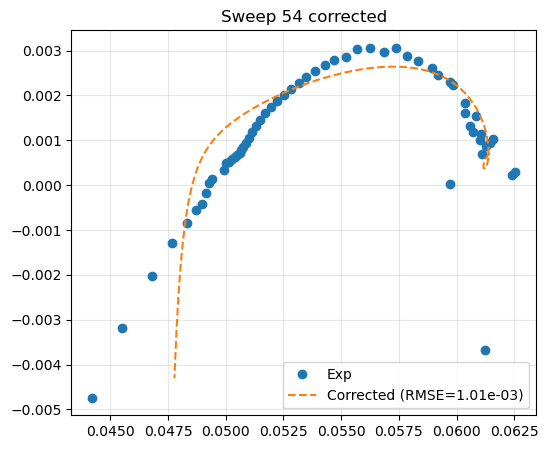

Sweep 55 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.82e-04, new RMSE=1.05e-03


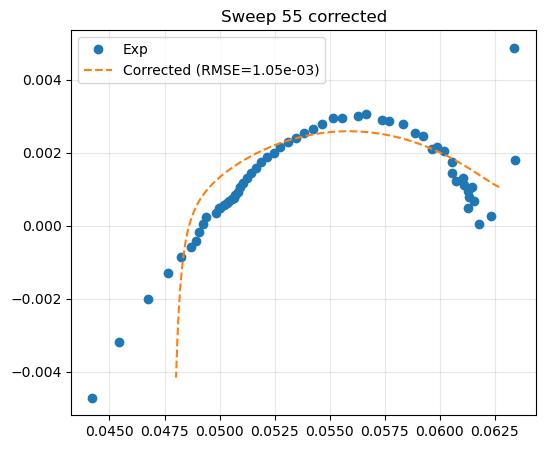

Sweep 56 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.47e-04, new RMSE=1.06e-03


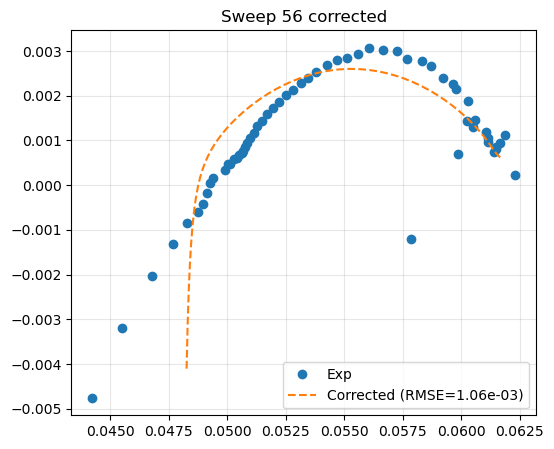

Sweep 57 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.66e-04, new RMSE=1.14e-03


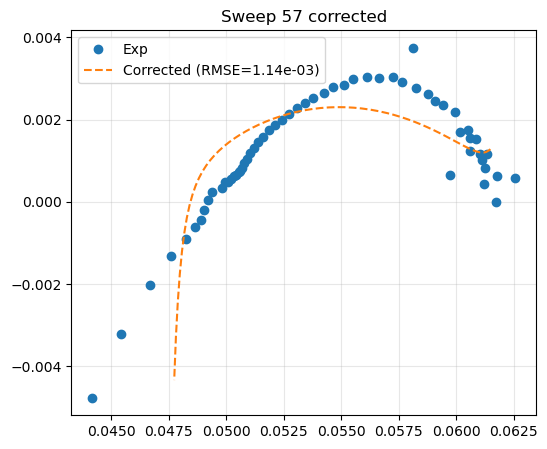

Sweep 58 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.20e-04, new RMSE=1.01e-03


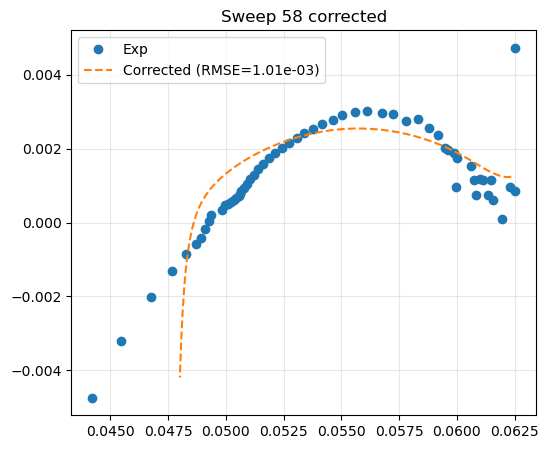

Sweep 59 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.36e-04, new RMSE=1.00e-03


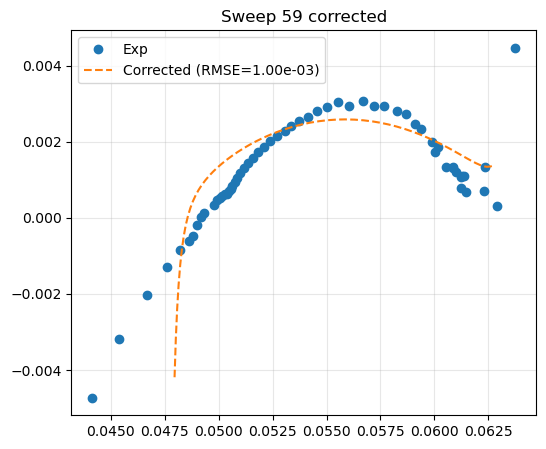

Sweep 60 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.95e-03, new RMSE=9.84e-04


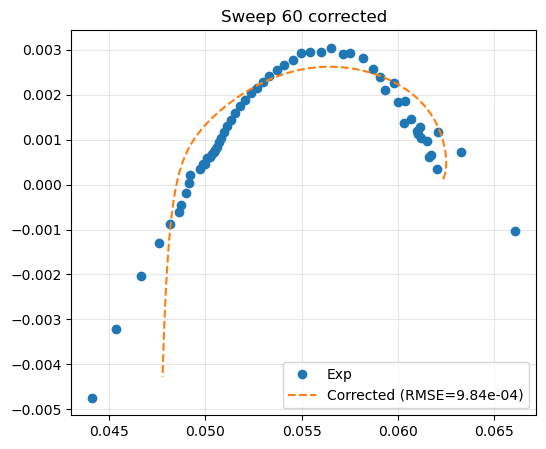

Sweep 61 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.87e-04, new RMSE=9.87e-04


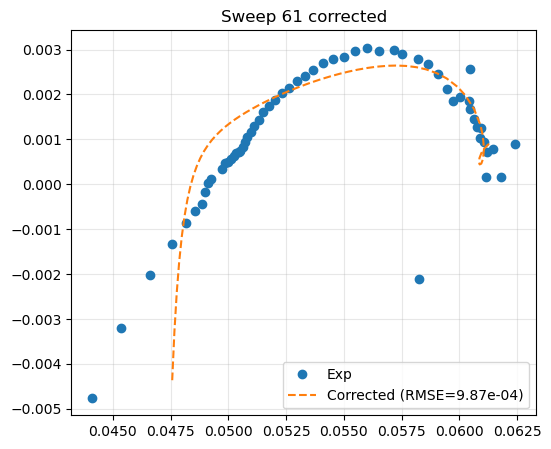

Sweep 62 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.77e-04, new RMSE=9.79e-04


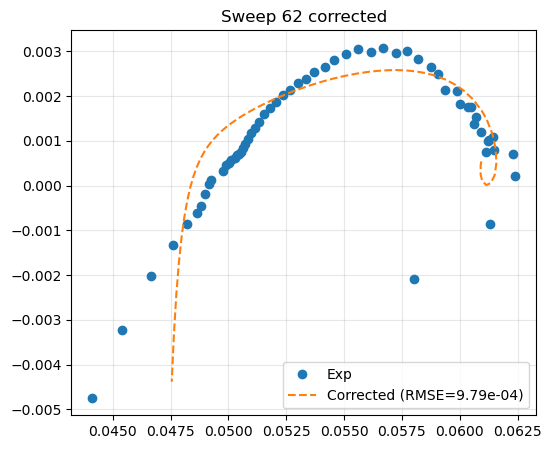

Sweep 63 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.97e-03, new RMSE=1.05e-03


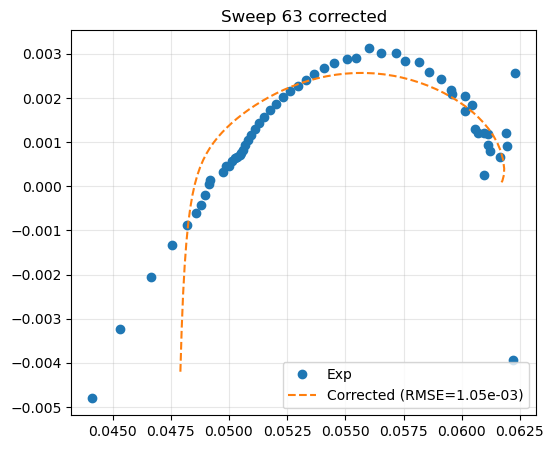

Sweep 64 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.04e-03, new RMSE=1.09e-03


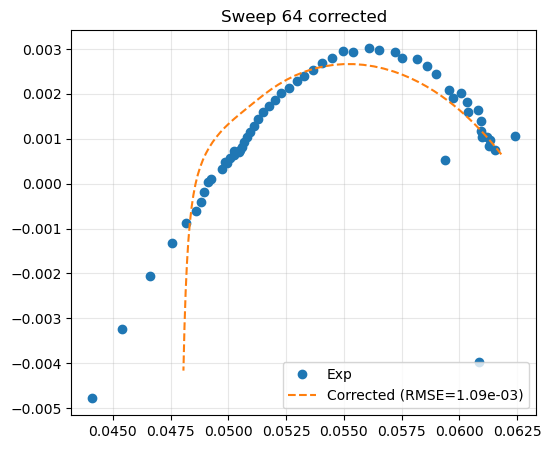

Sweep 65 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.11e-03, new RMSE=1.05e-03


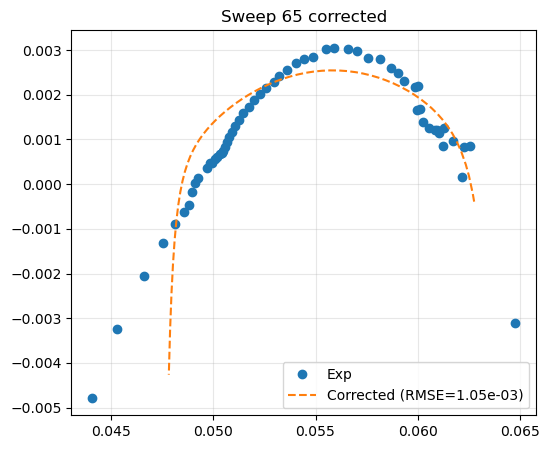

Sweep 66 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.02e-03, new RMSE=1.02e-03


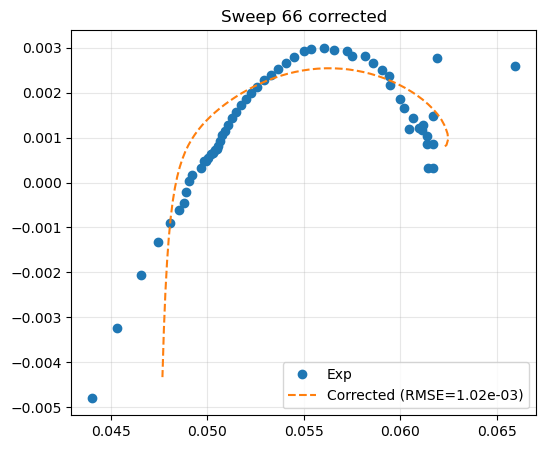

Sweep 67 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.95e-03, new RMSE=9.80e-04


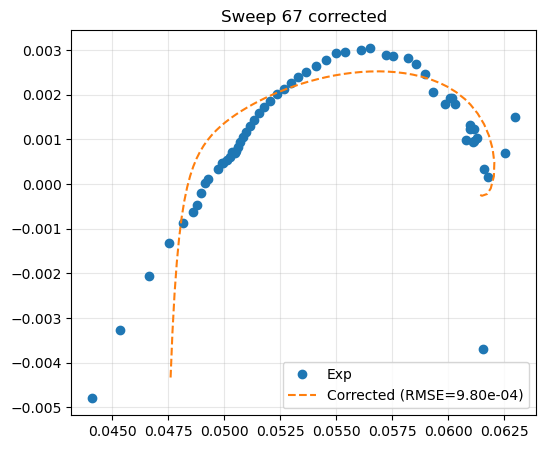

Sweep 68 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.94e-03, new RMSE=9.93e-04


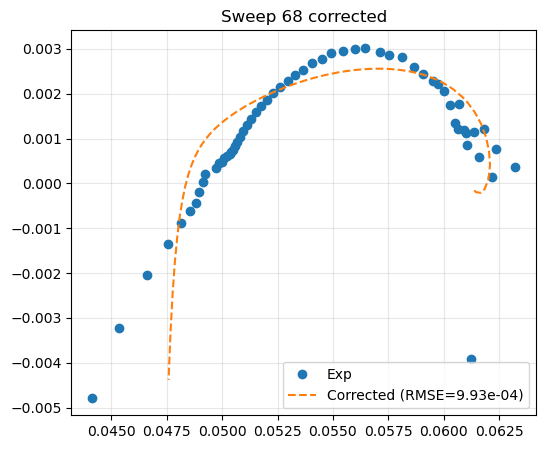

Sweep 69 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.95e-04, new RMSE=8.81e-04


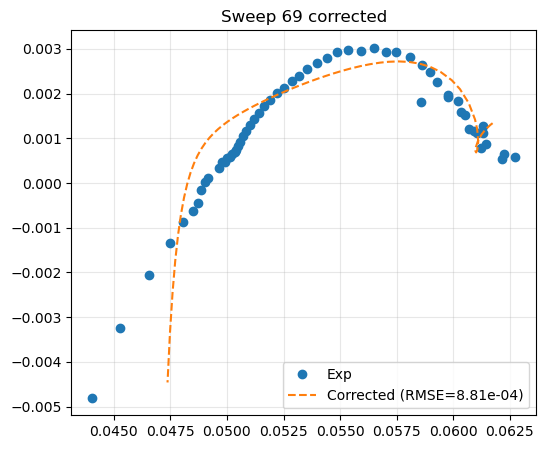

Sweep 70 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.98e-04, new RMSE=9.92e-04


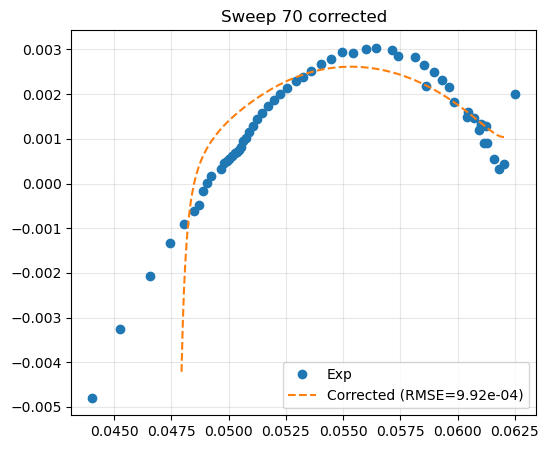

Sweep 71 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.65e-04, new RMSE=7.88e-04


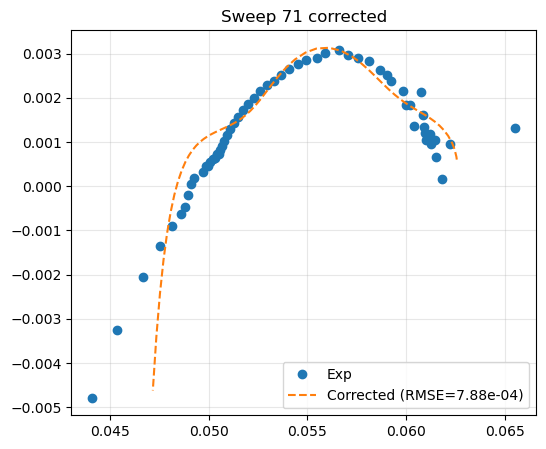

Sweep 72 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.82e-04, new RMSE=9.56e-04


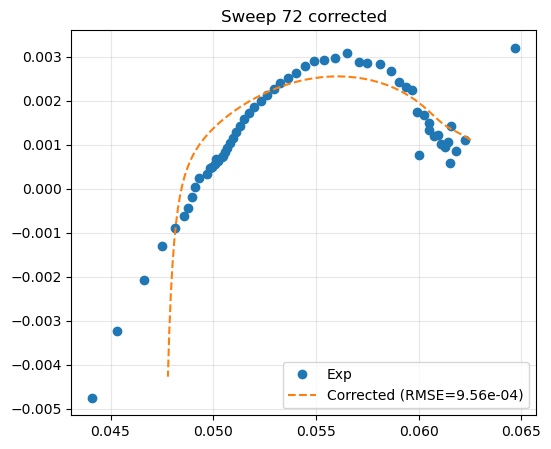

Sweep 73 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.45e-04, new RMSE=9.53e-04


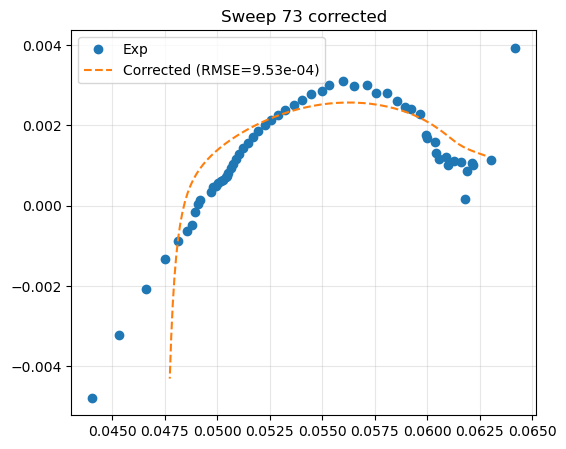

Sweep 74 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.94e-03, new RMSE=8.51e-04


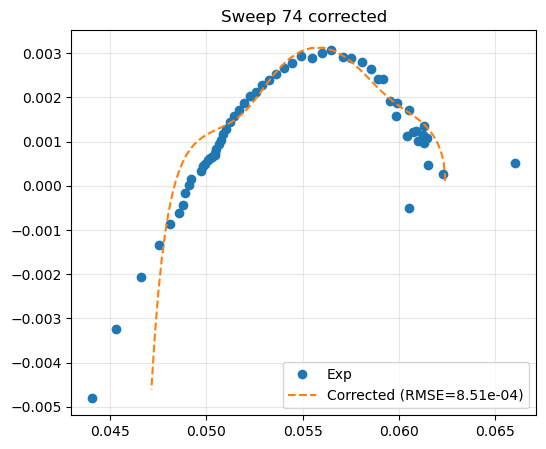

Saved uncorrected outliers for review:
    sweep_id      time            L0            R0        R1        L1  \
0          2  0.156667  7.045385e-09  4.027785e-02  0.120260  0.045671   
1          4  0.313889  7.057725e-09  4.573824e-02  0.085295  0.017783   
2          8  0.665278  8.345267e-09  3.930228e-02  0.107474  0.054207   
3         10  0.822500  7.767734e-09  4.505813e-02  0.073945  0.013581   
4         11  0.901389  7.766691e-09  4.516416e-02  0.065493  0.019309   
5         12  0.979722  8.679712e-09  3.897528e-02  0.126035  0.033024   
6         14  1.137222  8.334531e-09  4.194111e-02  0.080365  0.034786   
7         18  1.451667  8.572054e-09  4.079623e-02  0.091486  0.033143   
8         31  2.473611  8.746254e-09  4.116953e-02  0.086048  0.025576   
9         34  2.710000  8.064862e-09  4.573174e-02  0.071845  0.020269   
10        40  3.180833  8.574272e-09  4.294786e-02  0.069754  0.017197   
11        49  3.901667  8.464229e-09  4.331986e-02  0.061840  0.013217   

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings

from impedance.models.circuits import CustomCircuit
from tsfresh import extract_features
from tsfresh.utilities.dataframe_functions import impute

warnings.filterwarnings("ignore")

# --- 1) LOAD & PREPARE DATA ---
file_path = "6300.xls"
all_sheets = pd.read_excel(file_path, sheet_name=None)
# pick the right sheet
for name in ["Probe Frequency Domain", "EIS_Data"]:
    if name in all_sheets and not all_sheets[name].empty:
        df_eis = all_sheets[name]
        break
else:
    df_eis = next(df for df in all_sheets.values() if not df.empty)

# rename & clean
df_eis.rename(columns={
    "Frequency (Hz)": "frequency",
    "Real Impedance Re{z}(Ω)": "Z_real",
    "Negative Imaginary Impedance -Im{z}(Ω)": "Z_imag_neg",
    "Time": "time"
}, inplace=True)
df_eis.dropna(subset=["frequency","Z_real","Z_imag_neg"], inplace=True)
if "time" in df_eis.columns:
    df_eis["time"] = pd.to_datetime(df_eis["time"], errors="coerce")
    df_eis.dropna(subset=["time"], inplace=True)
    df_eis["RelTime_hr"] = (df_eis["time"] - df_eis["time"].min()).dt.total_seconds()/3600
else:
    df_eis["RelTime_hr"] = np.arange(len(df_eis))*0.1
df_eis["sweep_id"] = df_eis.groupby("time").ngroup()

# --- 2) EXTRACT FEATURES & FIT ECM ---
df_tsfresh = df_eis[["sweep_id","frequency","Z_real"]].rename(columns={"sweep_id":"id","frequency":"time","Z_real":"value"})
features = extract_features(df_tsfresh, column_id="id", column_sort="time", n_jobs=0)
impute(features)
features.reset_index(inplace=True); features.rename(columns={"index":"sweep_id"}, inplace=True)

# define advanced model
adv = {
    "name":"Advanced_2RCPE",
    "circuit":"L0-R0-p(R1-L1, R2-CPE1, R3-CPE3)",
    "initial_guess":[0,0.04941,0.0083883,2.0785,0.0083683,0.46421,1,2.2071,1,1],
    "param_names":["L0","R0","R1","L1","R2","CPE1-Q","CPE1-alpha","R3","CPE3-Q","CPE3-alpha"]
}

def fit_model(model, freq, Zexp):
    c = CustomCircuit(circuit=model["circuit"], initial_guess=model["initial_guess"])
    c.fit(freq, Zexp)
    Zfit = c.predict(freq)
    rmse = np.sqrt(np.mean(np.abs(Zexp-Zfit)**2))
    return c.parameters_, rmse

# loop sweeps
fit_list=[]
for sid, g in df_eis.groupby("sweep_id"):
    g = g.sort_values("frequency")
    if len(g)<3: continue
    freq = g["frequency"].values
    Zexp = g["Z_real"].values + 1j*(-g["Z_imag_neg"].values)
    params, rmse = fit_model(adv, freq, Zexp)
    fit_list.append({"sweep_id":sid, "params":params, "rmse":rmse, "RelTime_hr":g["RelTime_hr"].iloc[0]})
fit_df = pd.DataFrame(fit_list)

# expand parameters
for i,nm in enumerate(adv["param_names"]):
    fit_df[nm] = fit_df["params"].apply(lambda x: x[i])

# --- 3) OUTLIER TAGGING ---
# alpha‐rule
alpha_cols = [c for c in adv["param_names"] if "alpha" in c.lower()]
alpha_mask = fit_df[alpha_cols].min(axis=1)<0.5
# fallback RMSE‐Z‐score
if alpha_mask.all():
    z = (fit_df["rmse"]-fit_df["rmse"].mean())/fit_df["rmse"].std()
    alpha_mask = abs(z)>2
    print("Using RMSE Z‐score rule")
fit_df["is_outlier"]=alpha_mask

# print RMSE stats
maj = fit_df[~alpha_mask]; out = fit_df[alpha_mask]
print("Majority: mean RMSE",maj["rmse"].mean(),"median",maj["rmse"].median())
print("Outliers: mean RMSE",out["rmse"].mean(),"median",out["rmse"].median())

# pick representative
best_maj = maj.loc[maj["rmse"].idxmin(),"sweep_id"] if len(maj) else None
worst_out= out.loc[out["rmse"].idxmax(),"sweep_id"] if len(out) else None

# helper plot
def plot_nyq(sid,label):
    g=df_eis[df_eis["sweep_id"]==sid].sort_values("frequency")
    f=g["frequency"].values; Z=g["Z_real"].values+1j*(-g["Z_imag_neg"].values)
    row=fit_df[fit_df["sweep_id"]==sid].iloc[0]
    c=CustomCircuit(circuit=adv["circuit"],initial_guess=adv["initial_guess"])
    c.parameters_=row["params"]; Zf=c.predict(f)
    plt.figure(figsize=(6,5))
    plt.plot(Z.real,-Z.imag,'o',label="Exp"); plt.plot(Zf.real,-Zf.imag,'-',label=f"{label} (RMSE={row['rmse']:.2e})")
    plt.xlabel("Z'");plt.ylabel("-Z''");plt.title(f"Sweep {sid}");plt.legend();plt.grid(alpha=0.3);plt.show()

if best_maj is not None: plot_nyq(best_maj,"Best Majority")
if worst_out is not None: plot_nyq(worst_out,"Worst Outlier")

# --- 4) OUTLIER ACTIONS ---
window=5  # use ±5 neighbors
outlier_table=[]

for idx,row in fit_df[fit_df["is_outlier"]].iterrows():
    sid=row["sweep_id"]
    # get neighbor majority indices sorted by time distance
    times=fit_df["RelTime_hr"]
    dists=abs(times-row["RelTime_hr"])
    nbrs=fit_df[~fit_df["is_outlier"]].assign(dist=dists).nsmallest(window,"dist")
    if nbrs.empty: continue

    # compute moving‐average initial guess
    new_guess = np.stack(nbrs["params"].values).mean(axis=0)
    print(f"Sweep {sid} new initial guess:",new_guess)

    # re‐fit
    g=df_eis[df_eis["sweep_id"]==sid].sort_values("frequency")
    f=g["frequency"].values; Z=g["Z_real"].values+1j*(-g["Z_imag_neg"].values)
    c=CustomCircuit(circuit=adv["circuit"],initial_guess=new_guess)
    try:
        c.fit(f,Z)
        new_rmse=np.sqrt(np.mean(np.abs(Z-c.predict(f))**2))
    except:
        new_rmse=np.nan

    print(f"  original RMSE={row['rmse']:.2e}, new RMSE={new_rmse:.2e}")

    # plot corrected
    Zf2=c.predict(f)
    plt.figure(figsize=(6,5))
    plt.plot(Z.real,-Z.imag,'o',label="Exp")
    plt.plot(Zf2.real,-Zf2.imag,'--',label=f"Corrected (RMSE={new_rmse:.2e})")
    plt.legend(); plt.title(f"Sweep {sid} corrected"); plt.grid(alpha=0.3); plt.show()

    # decide
    if new_rmse >= row["rmse"]:
        # no improvement, save for review
        outlier_table.append({
            "sweep_id":sid,
            "time":row["RelTime_hr"],
            **{nm:row[nm] for nm in adv["param_names"]},
            "original_rmse":row["rmse"],
            "corrected_rmse":new_rmse
        })

# final outlier review table
out_df=pd.DataFrame(outlier_table)
if not out_df.empty:
    out_df.to_excel("uncorrected_outliers.xlsx",index=False)
    print("Saved uncorrected outliers for review:")
    print(out_df)
else:
    print("All outliers improved with moving‐average initial guesses.")

Majority fits (1): mean RMSE=2.326e-02, median=2.326e-02
Outlier  fits (74): mean RMSE=1.205e-03, median=9.661e-04


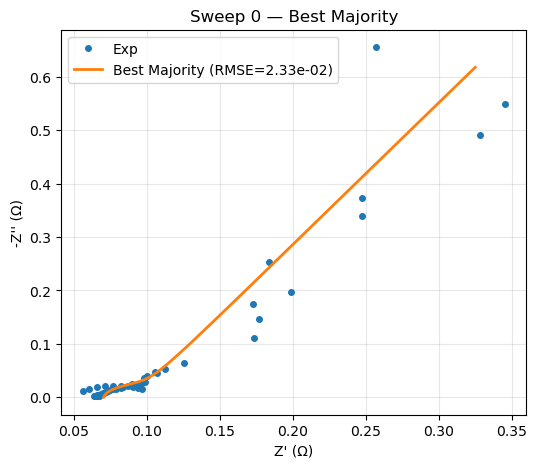

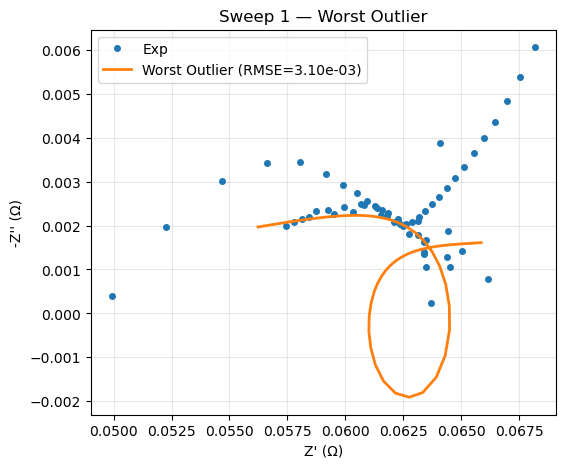


Sweep 1 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=3.10e-03, new RMSE=3.01e-03


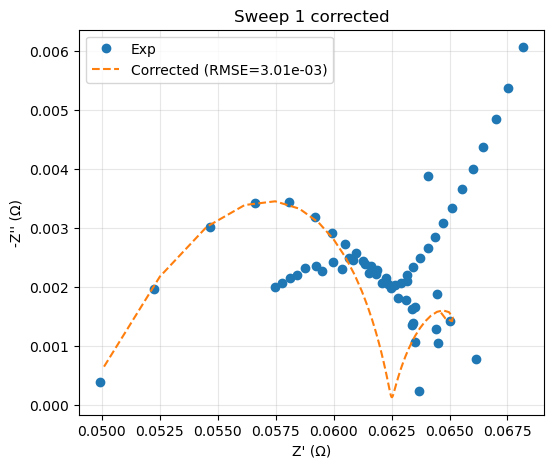


Sweep 2 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.43e-04, new RMSE=9.76e-04


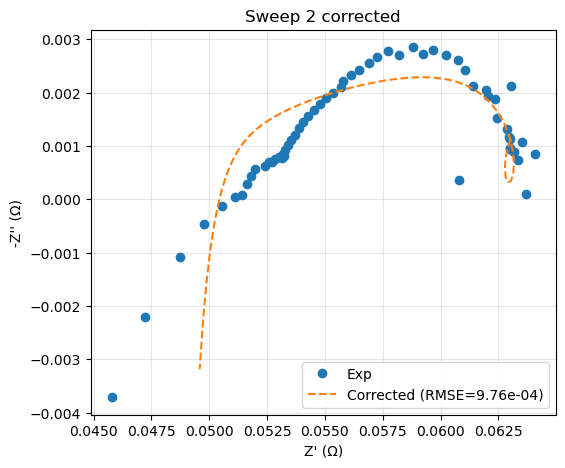


Sweep 3 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.04e-03, new RMSE=9.79e-04


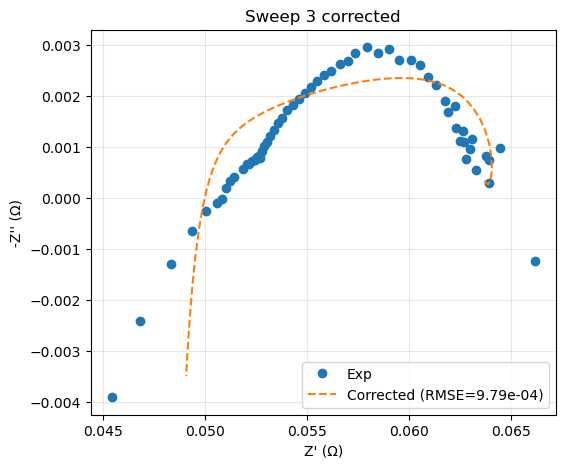


Sweep 4 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.25e-04, new RMSE=1.01e-03


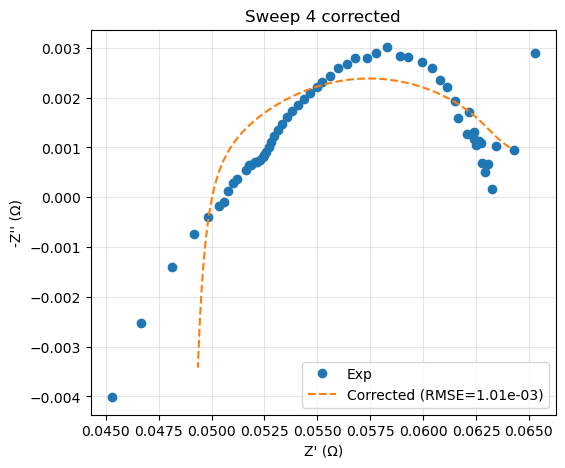


Sweep 5 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.69e-04, new RMSE=9.62e-04


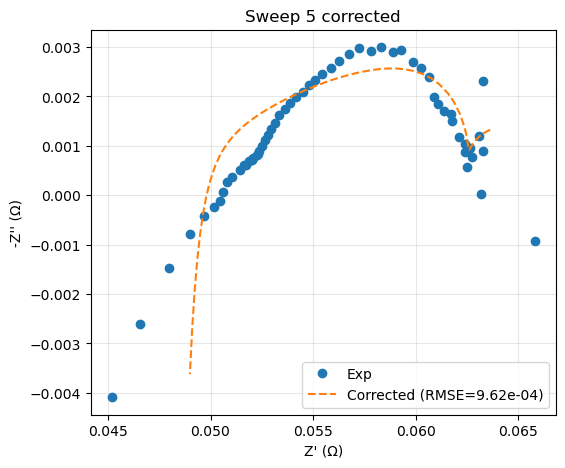


Sweep 6 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.00e-03, new RMSE=9.52e-04


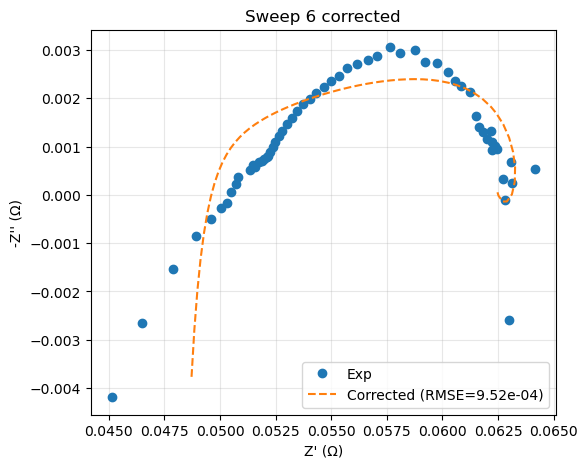


Sweep 7 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.18e-04, new RMSE=9.16e-04


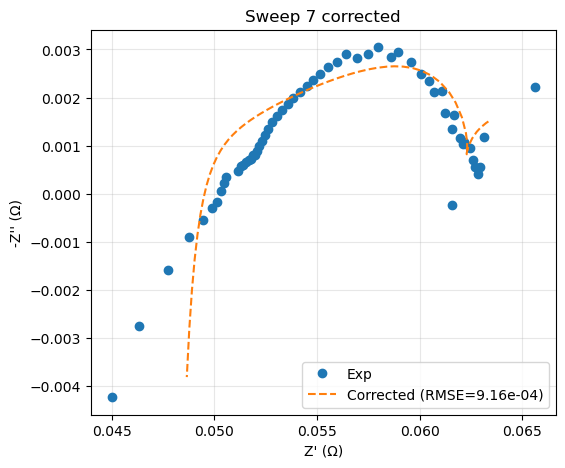


Sweep 8 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.60e-04, new RMSE=1.08e-03


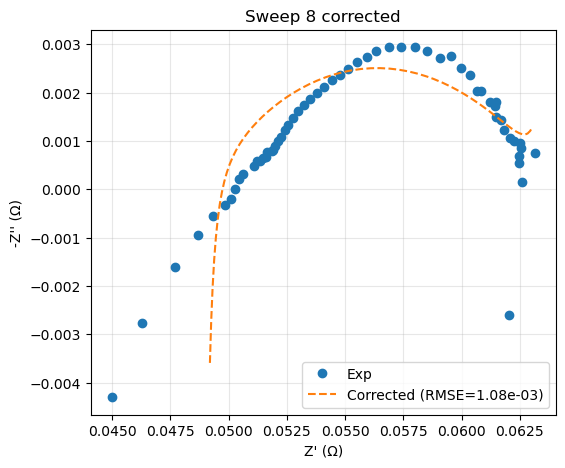


Sweep 9 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.66e-04, new RMSE=9.52e-04


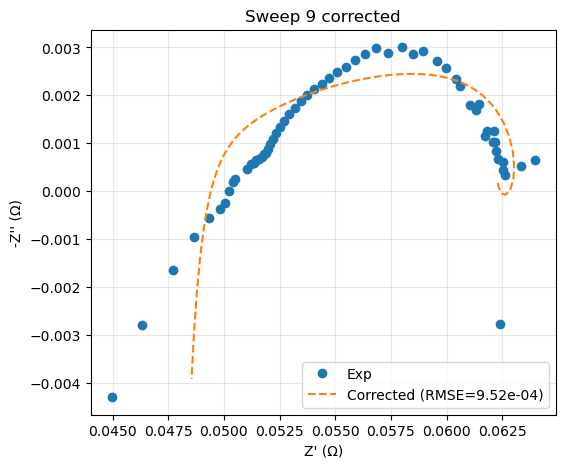


Sweep 10 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.80e-04, new RMSE=9.38e-04


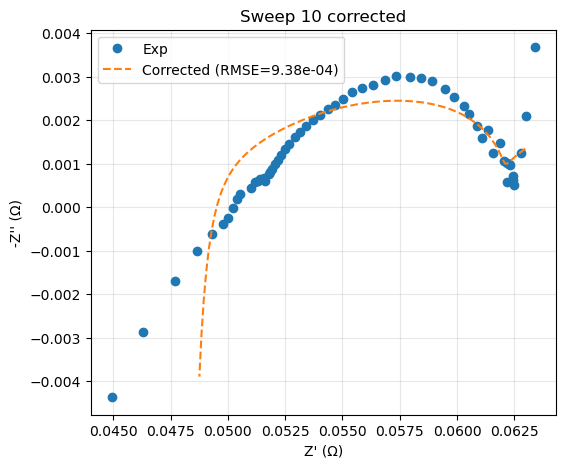


Sweep 11 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.01e-04, new RMSE=1.05e-03


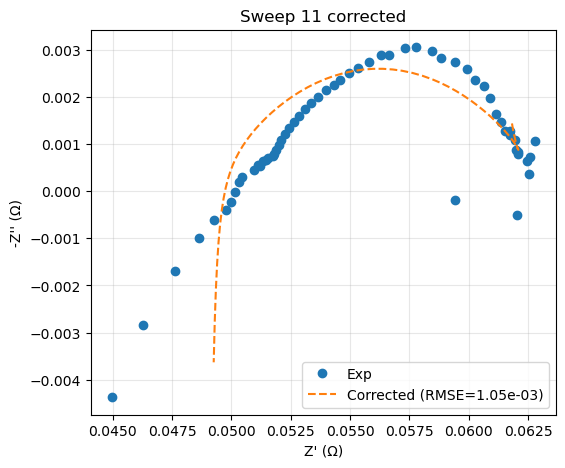


Sweep 12 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.16e-04, new RMSE=9.26e-04


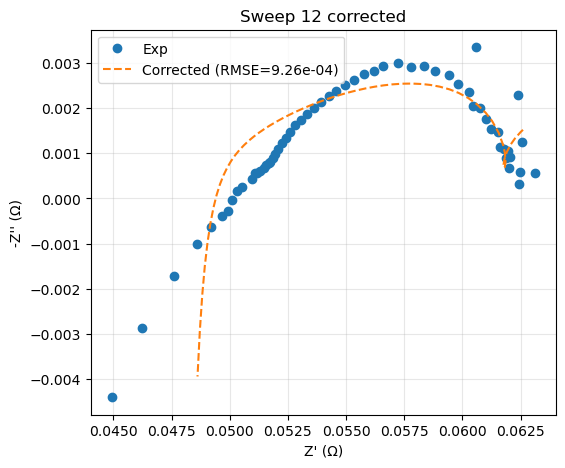


Sweep 13 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.33e-04, new RMSE=9.31e-04


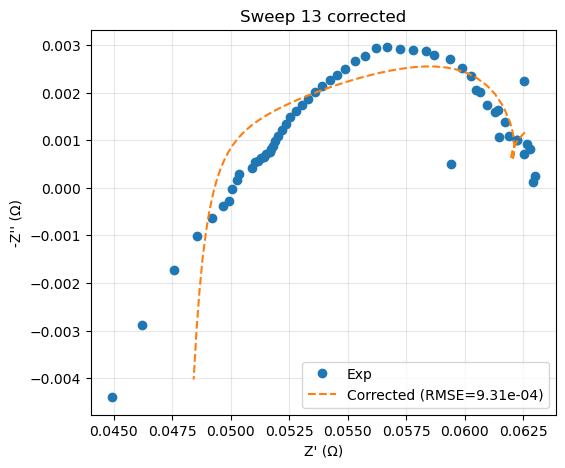


Sweep 14 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.30e-04, new RMSE=1.03e-03


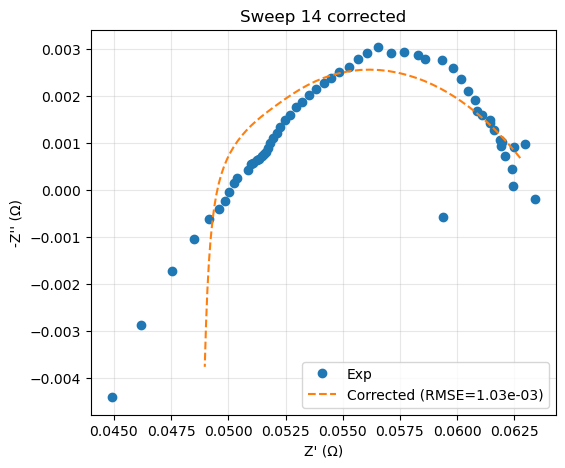


Sweep 15 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.29e-04, new RMSE=9.25e-04


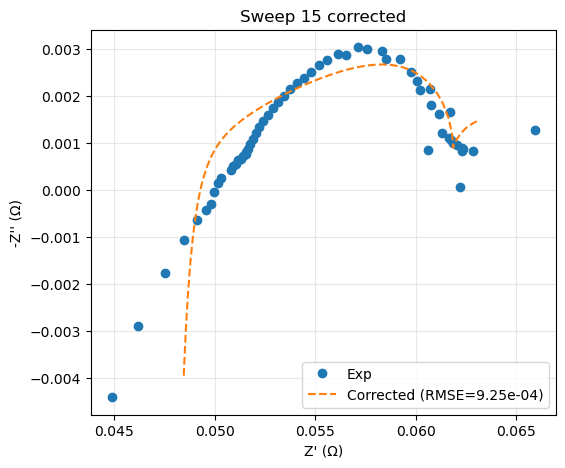


Sweep 16 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.05e-03, new RMSE=9.51e-04


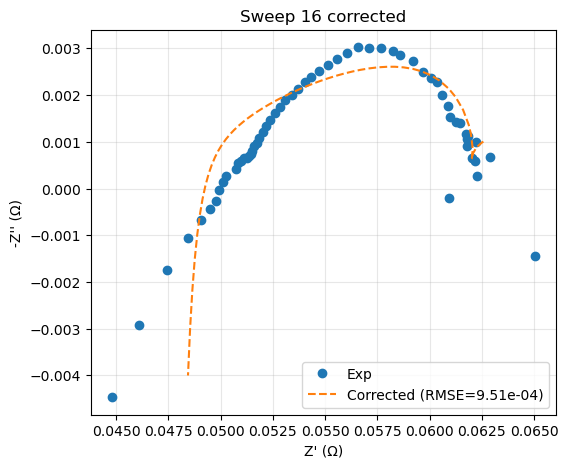


Sweep 17 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.07e-04, new RMSE=8.97e-04


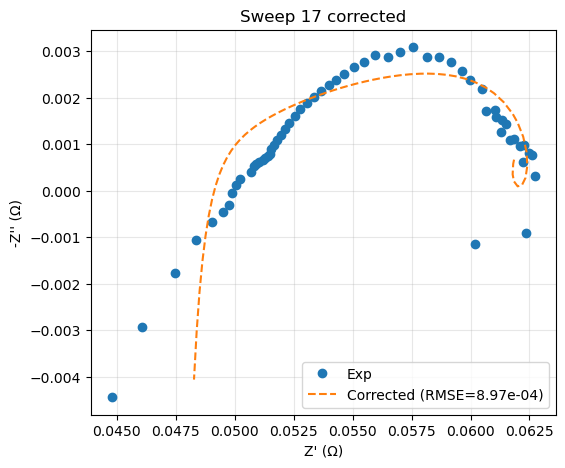


Sweep 18 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.99e-04, new RMSE=9.95e-04


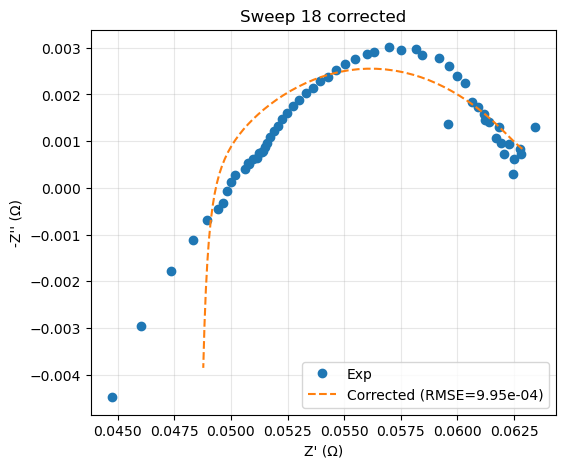


Sweep 19 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.65e-04, new RMSE=9.45e-04


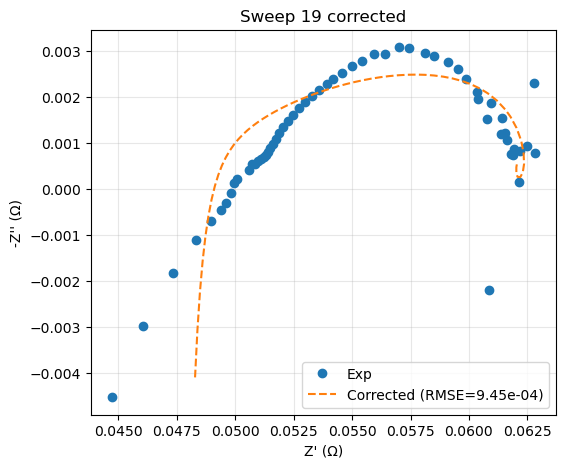


Sweep 20 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.03e-03, new RMSE=9.54e-04


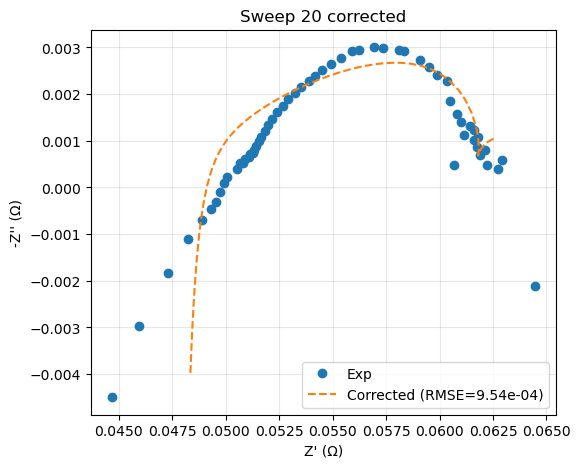


Sweep 21 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.96e-03, new RMSE=9.30e-04


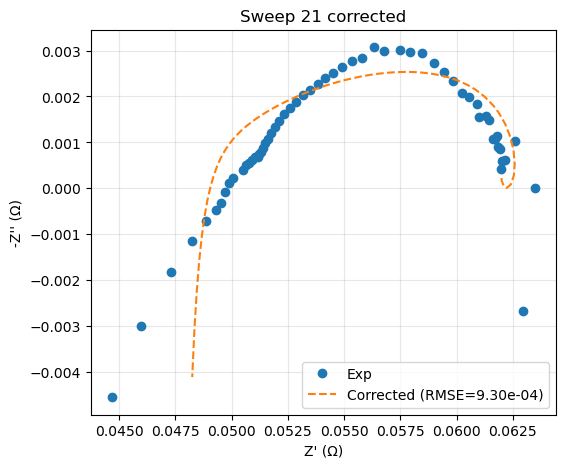


Sweep 22 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.02e-04, new RMSE=8.96e-04


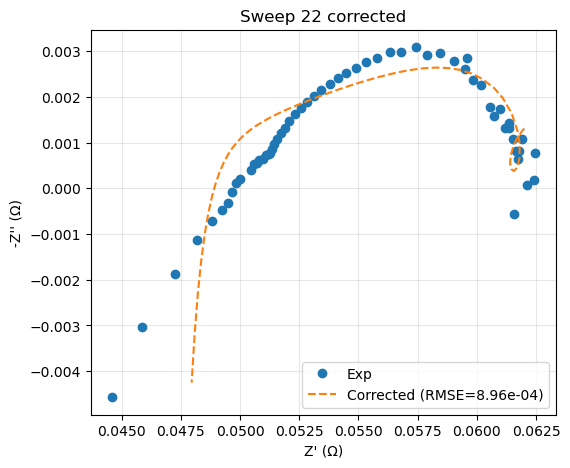


Sweep 23 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.60e-04, new RMSE=9.25e-04


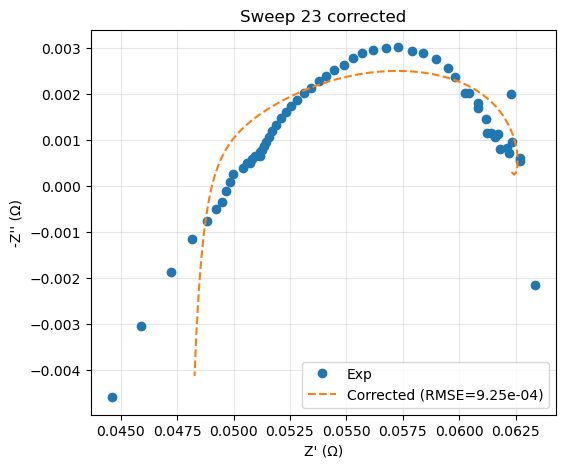


Sweep 24 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.51e-04, new RMSE=9.04e-04


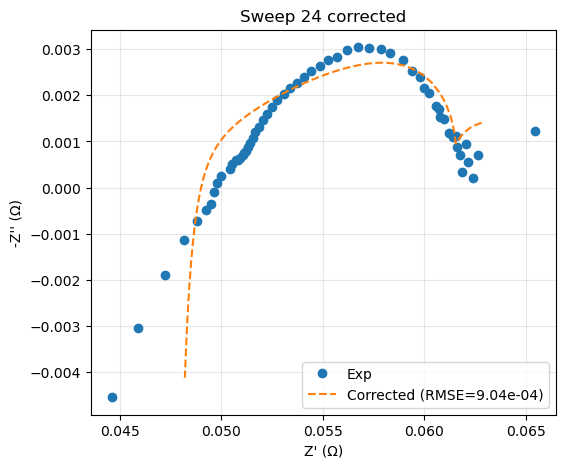


Sweep 25 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.01e-03, new RMSE=9.54e-04


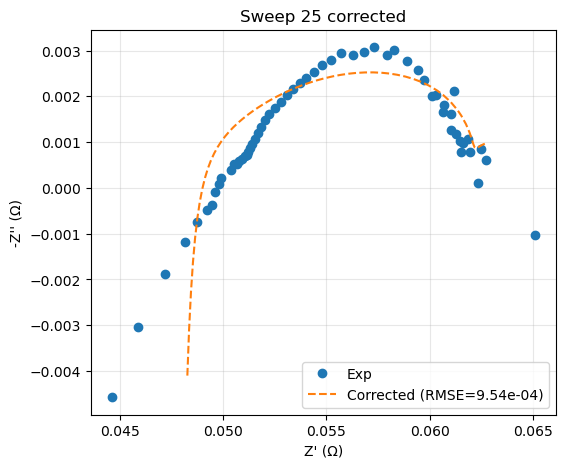


Sweep 26 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.88e-04, new RMSE=8.76e-04


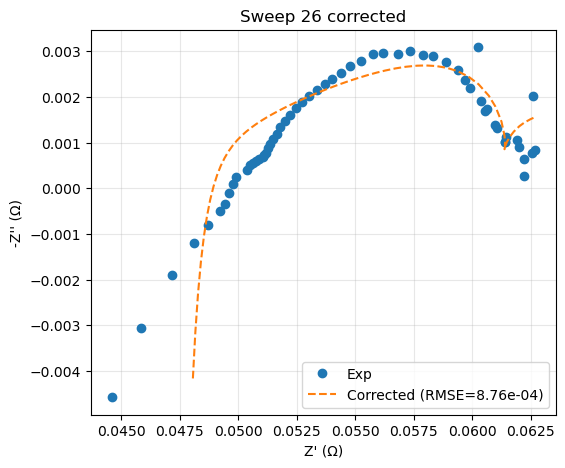


Sweep 27 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.96e-04, new RMSE=9.55e-04


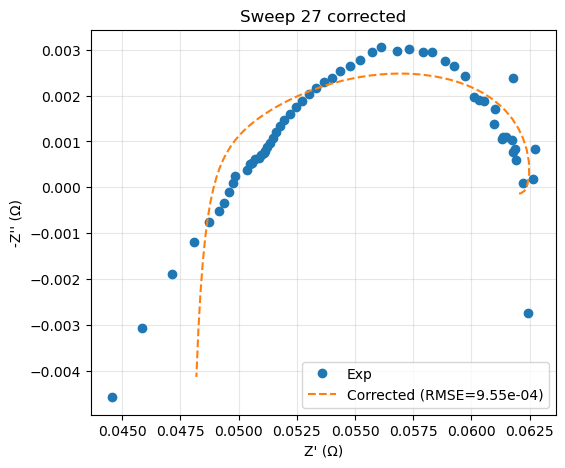


Sweep 28 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.30e-04, new RMSE=9.17e-04


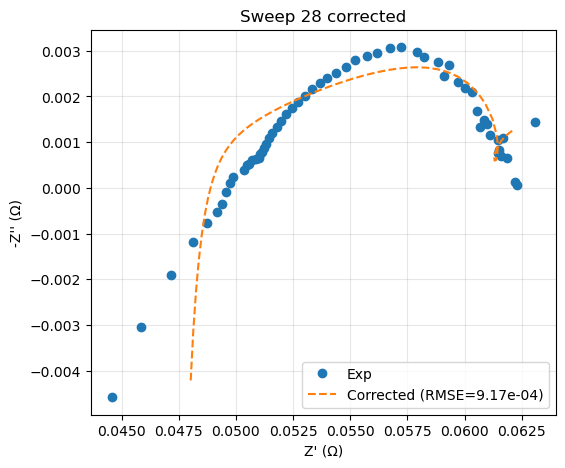


Sweep 29 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.96e-03, new RMSE=9.45e-04


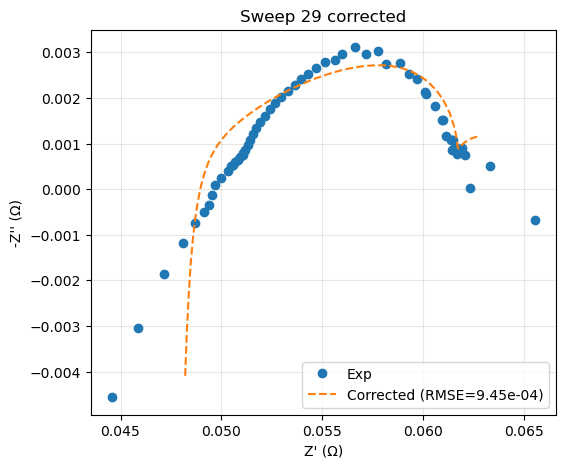


Sweep 30 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.98e-04, new RMSE=8.94e-04


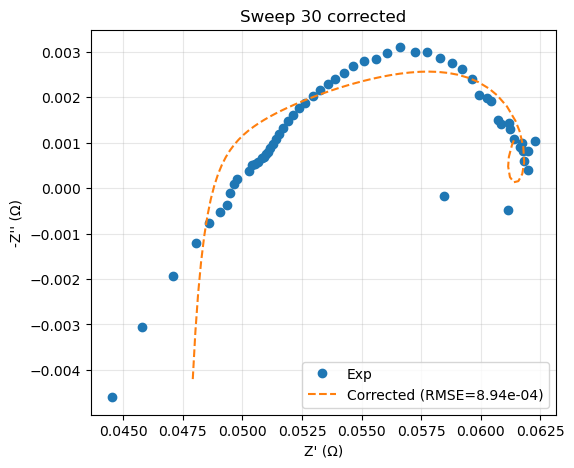


Sweep 31 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.39e-04, new RMSE=1.00e-03


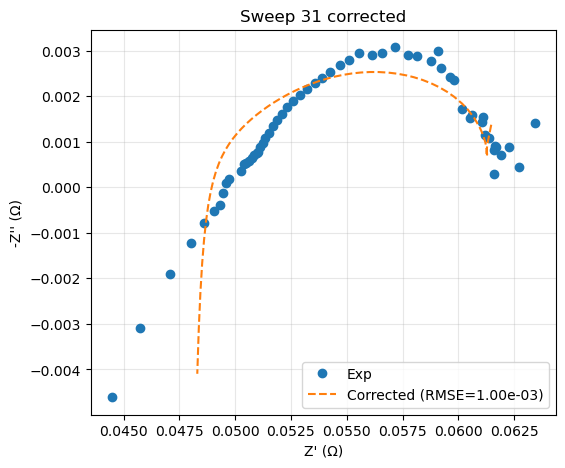


Sweep 32 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.97e-04, new RMSE=9.67e-04


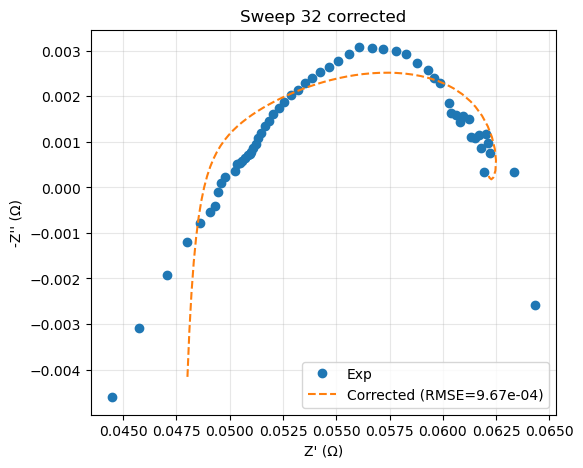


Sweep 33 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.08e-04, new RMSE=8.96e-04


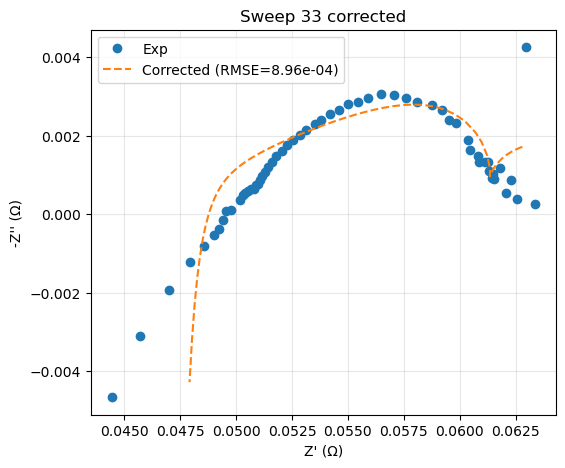


Sweep 34 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.22e-04, new RMSE=9.25e-04


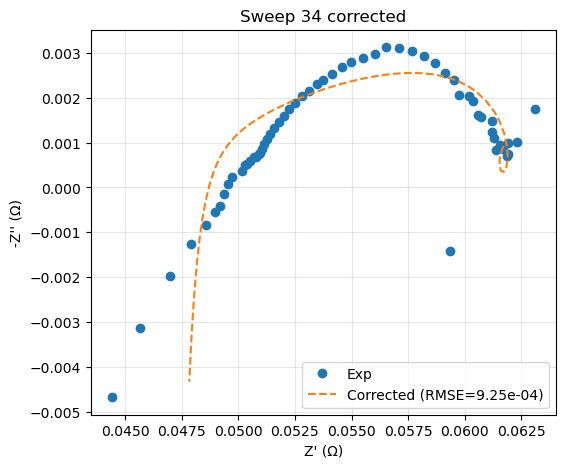


Sweep 35 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.22e-04, new RMSE=9.02e-04


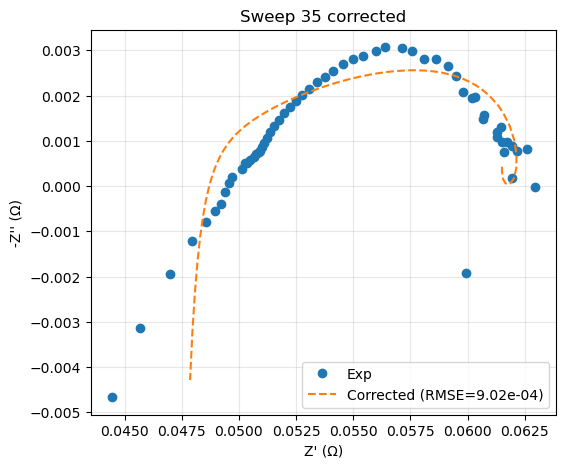


Sweep 36 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.99e-03, new RMSE=9.85e-04


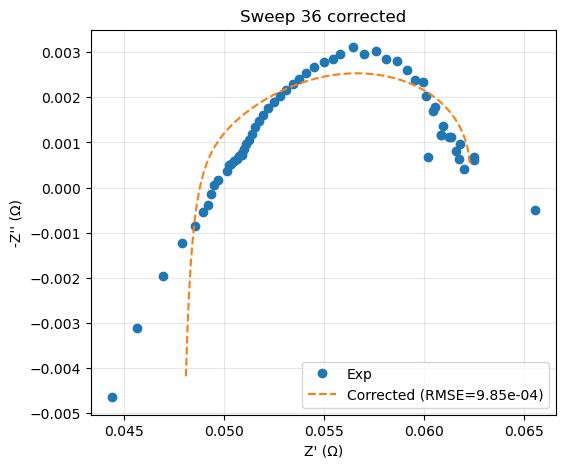


Sweep 37 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.01e-03, new RMSE=9.58e-04


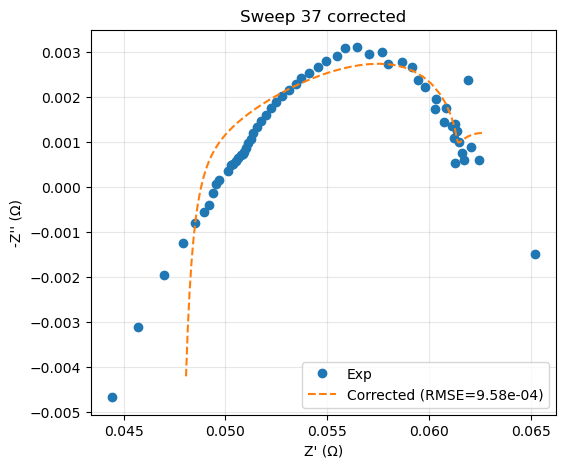


Sweep 38 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.51e-04, new RMSE=9.44e-04


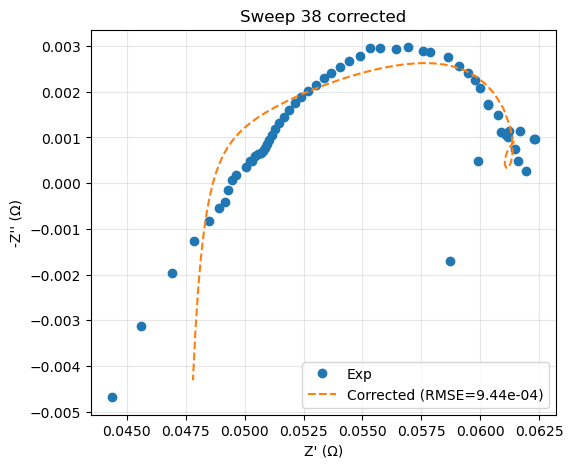


Sweep 39 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.05e-03, new RMSE=1.03e-03


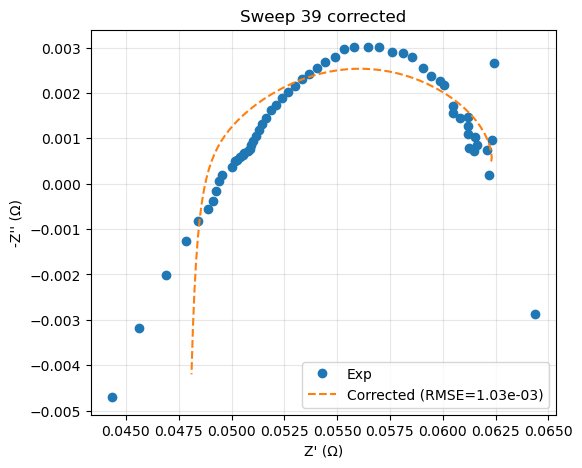


Sweep 40 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.69e-04, new RMSE=9.85e-04


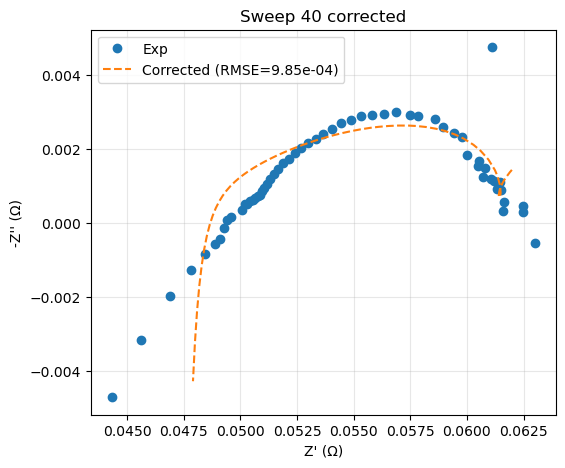


Sweep 41 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.05e-03, new RMSE=1.02e-03


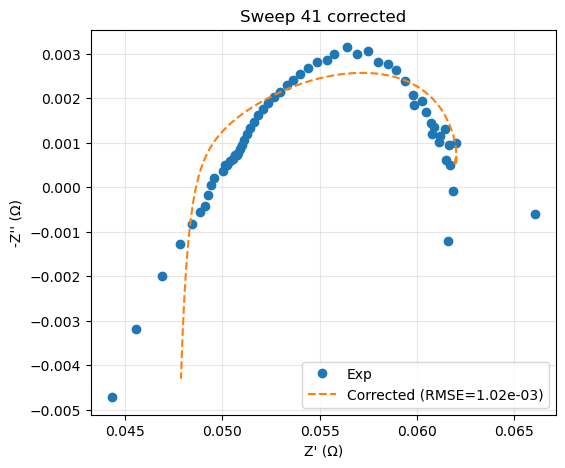


Sweep 42 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.01e-03, new RMSE=9.75e-04


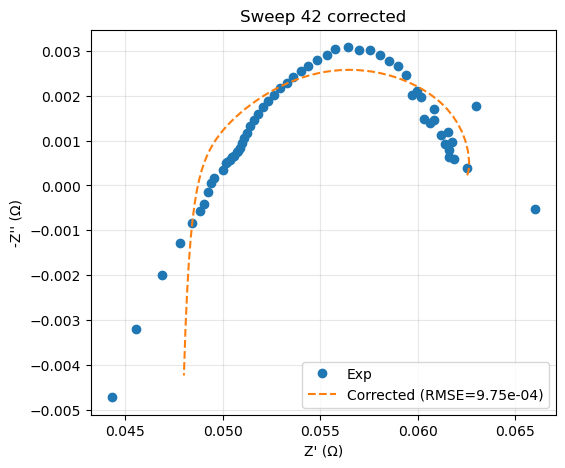


Sweep 43 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.01e-03, new RMSE=9.76e-04


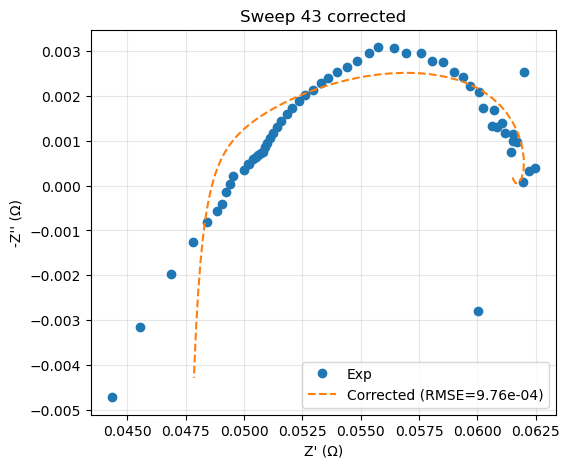


Sweep 44 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.85e-04, new RMSE=8.29e-04


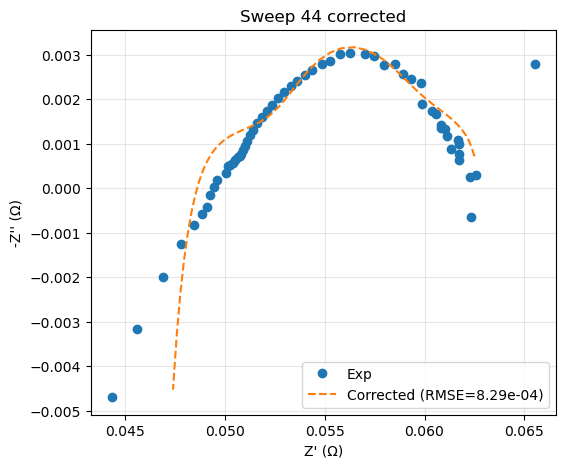


Sweep 45 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.98e-04, new RMSE=9.98e-04


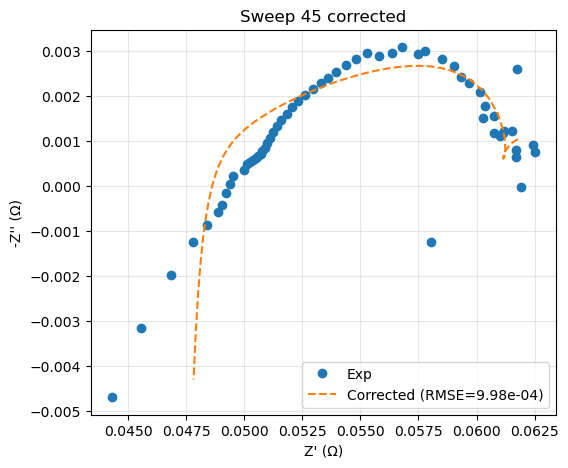


Sweep 46 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.83e-04, new RMSE=9.58e-04


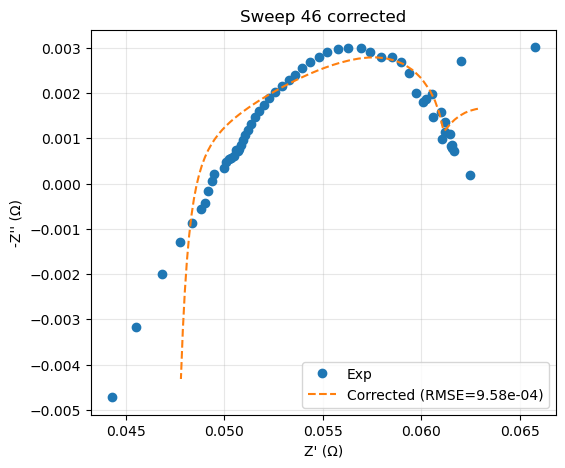


Sweep 47 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.70e-04, new RMSE=9.70e-04


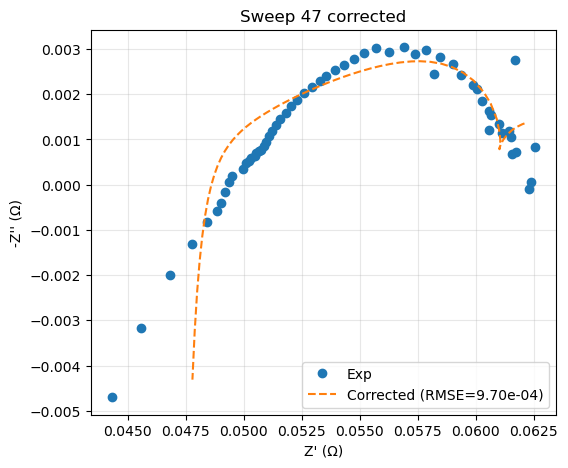


Sweep 48 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.88e-04, new RMSE=9.73e-04


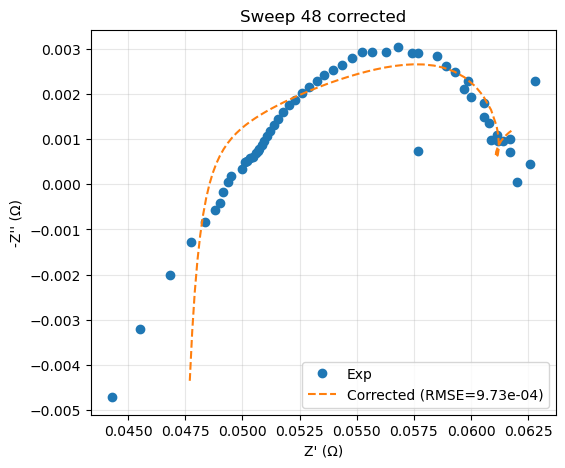


Sweep 49 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.41e-04, new RMSE=1.02e-03


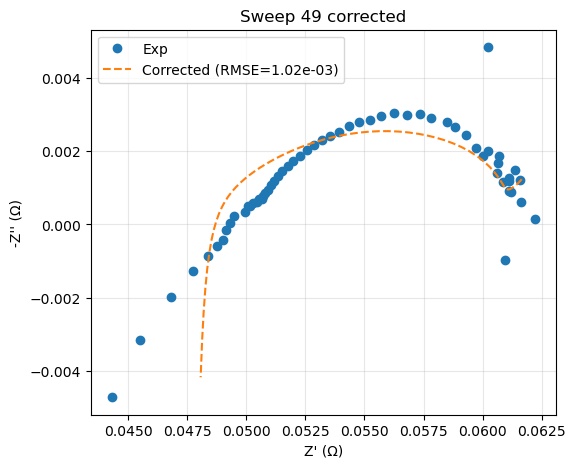


Sweep 50 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.91e-04, new RMSE=9.68e-04


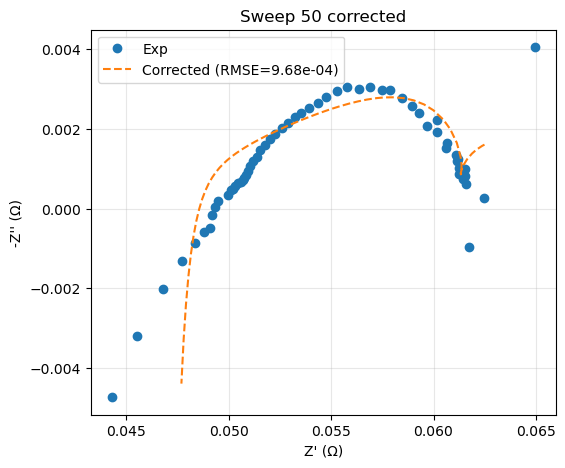


Sweep 51 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.16e-04, new RMSE=1.02e-03


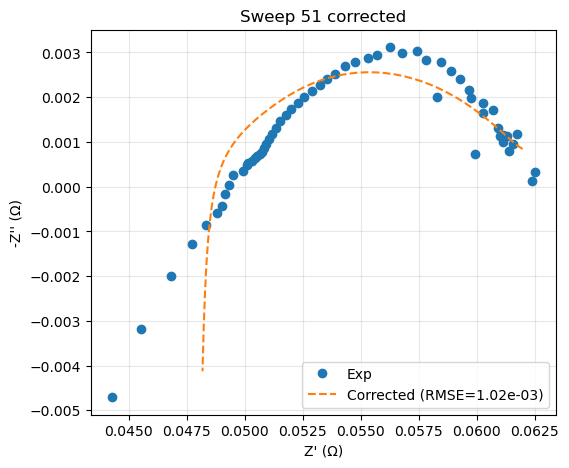


Sweep 52 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.56e-04, new RMSE=1.03e-03


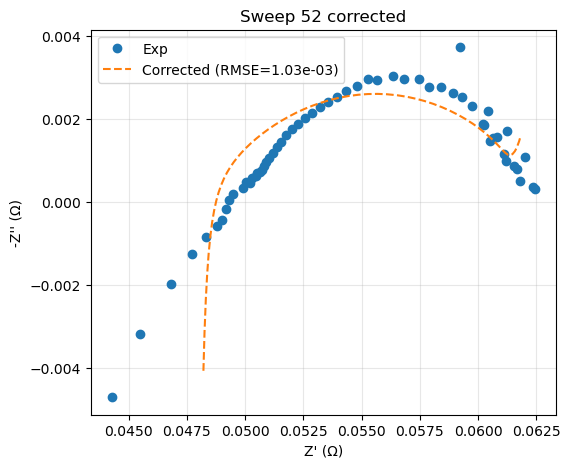


Sweep 53 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.22e-04, new RMSE=9.99e-04


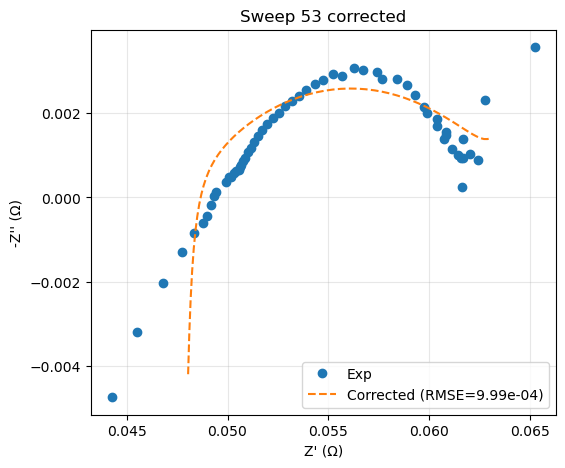


Sweep 54 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.96e-03, new RMSE=1.01e-03


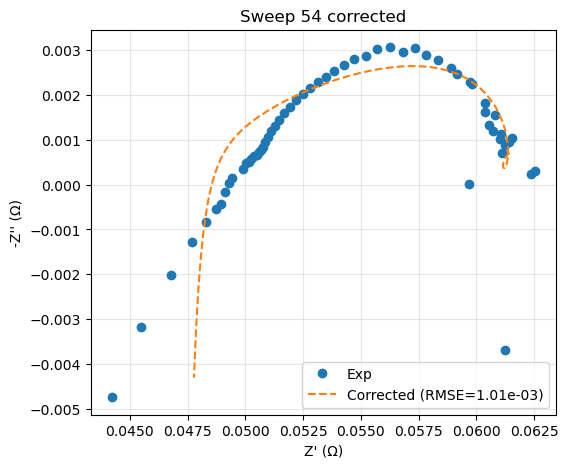


Sweep 55 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.82e-04, new RMSE=1.05e-03


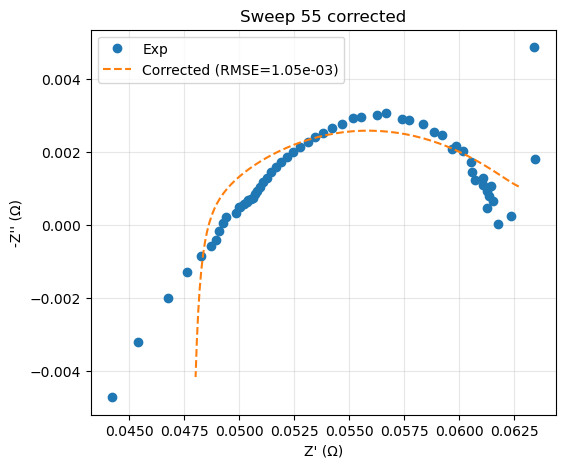


Sweep 56 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.47e-04, new RMSE=1.06e-03


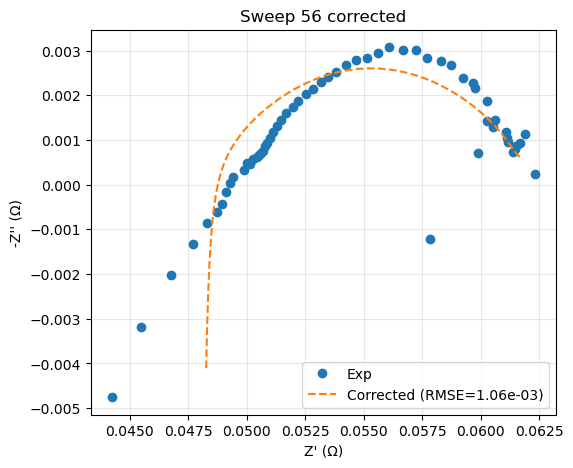


Sweep 57 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.66e-04, new RMSE=1.14e-03


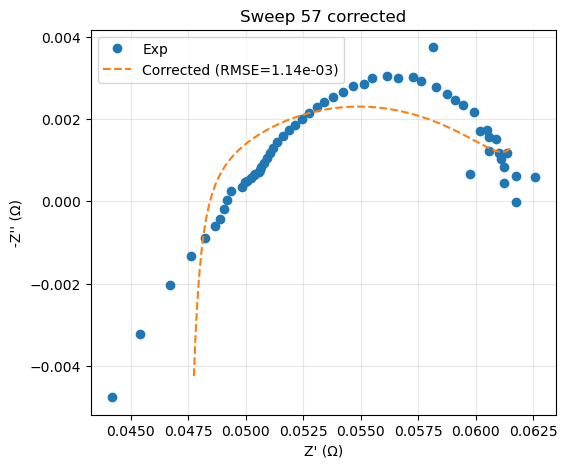


Sweep 58 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.20e-04, new RMSE=1.01e-03


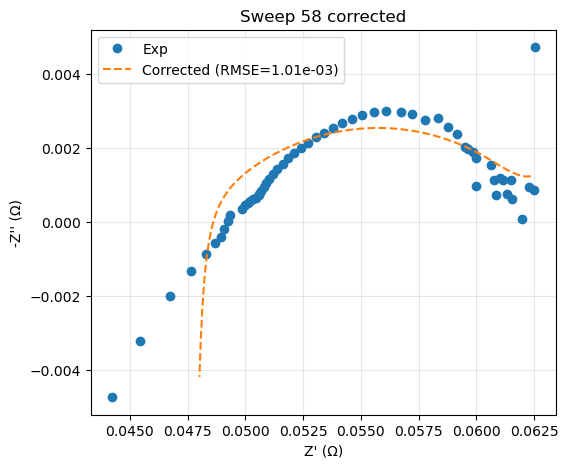


Sweep 59 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.36e-04, new RMSE=1.00e-03


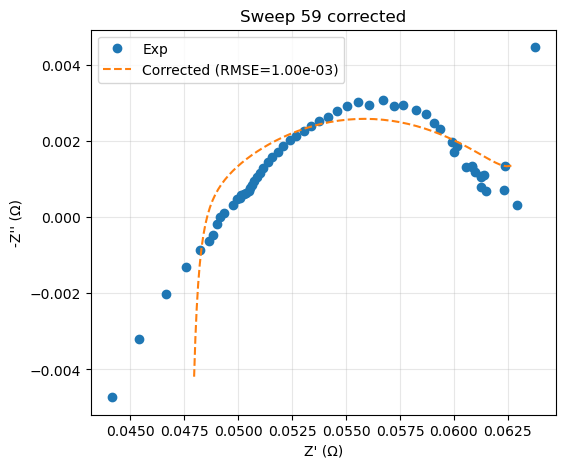


Sweep 60 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.95e-03, new RMSE=9.84e-04


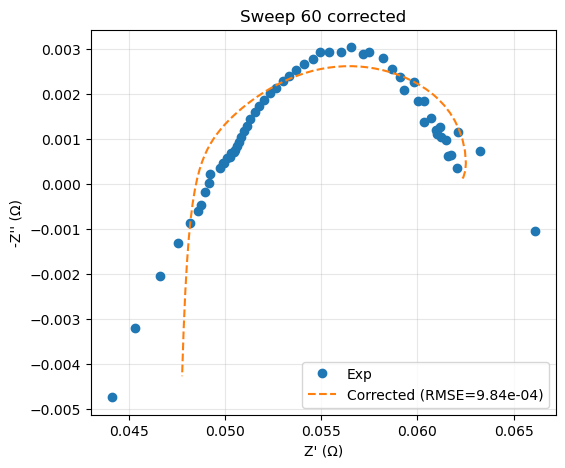


Sweep 61 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.87e-04, new RMSE=9.87e-04


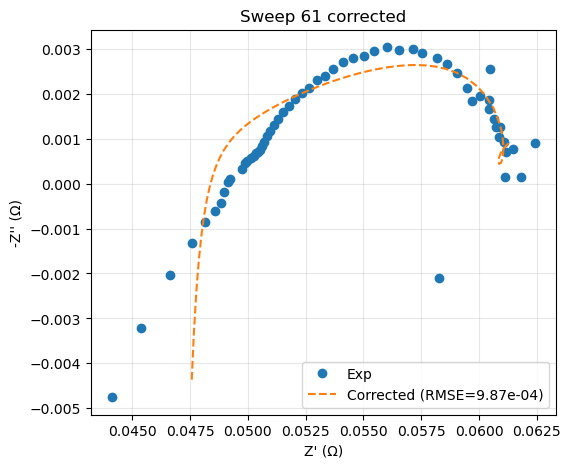


Sweep 62 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.77e-04, new RMSE=9.79e-04


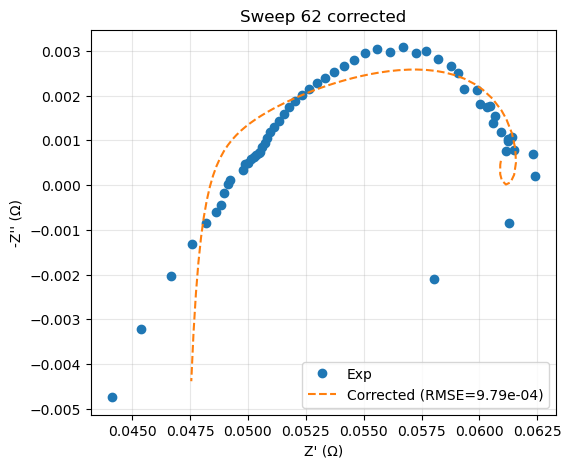


Sweep 63 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.97e-03, new RMSE=1.05e-03


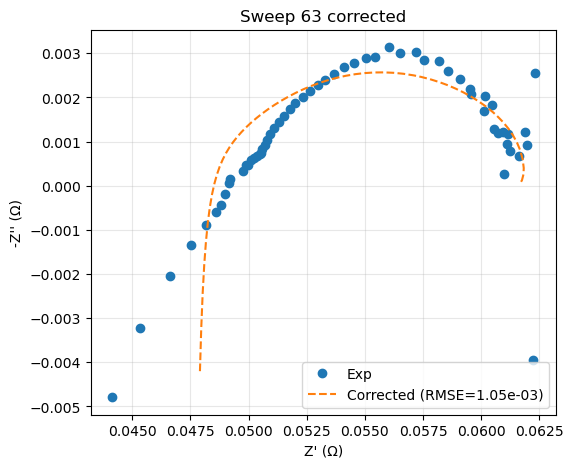


Sweep 64 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.04e-03, new RMSE=1.09e-03


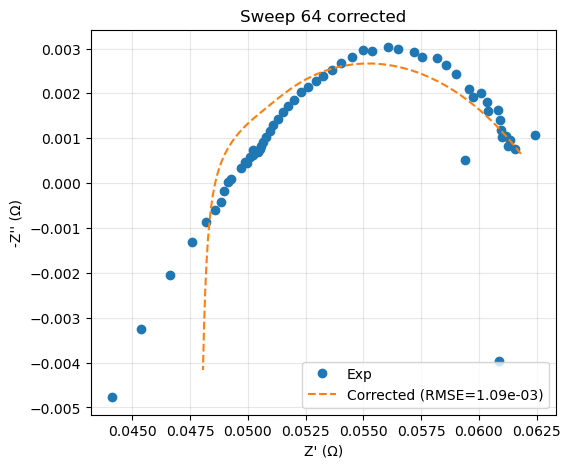


Sweep 65 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.11e-03, new RMSE=1.05e-03


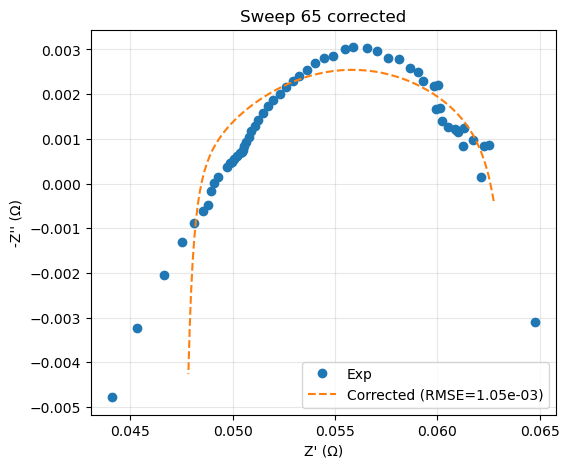


Sweep 66 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.02e-03, new RMSE=1.02e-03


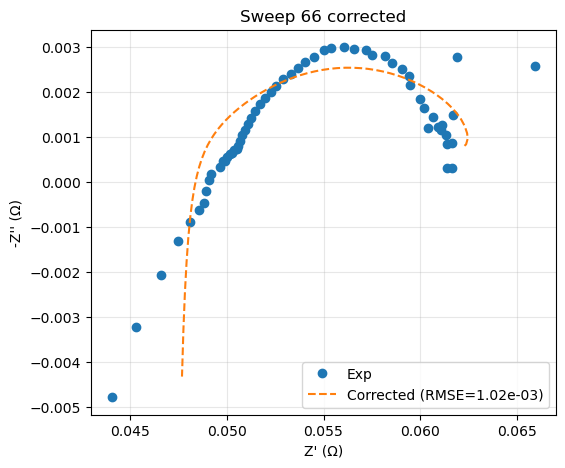


Sweep 67 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.95e-03, new RMSE=9.80e-04


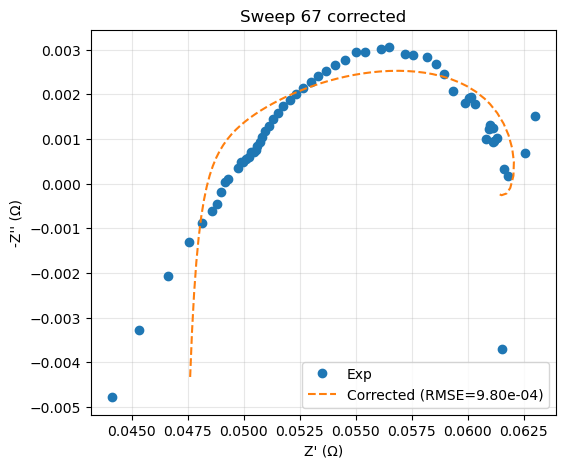


Sweep 68 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.94e-03, new RMSE=9.93e-04


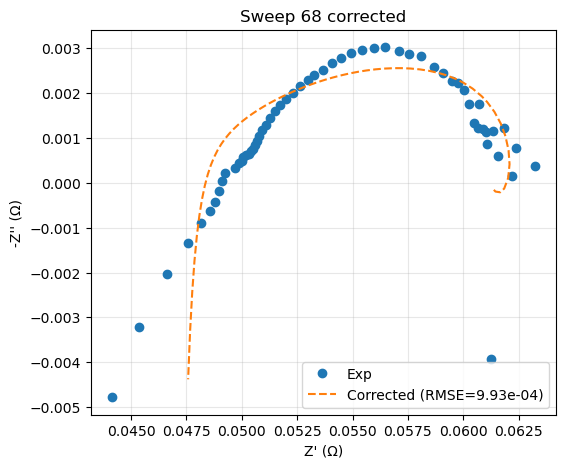


Sweep 69 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.95e-04, new RMSE=8.81e-04


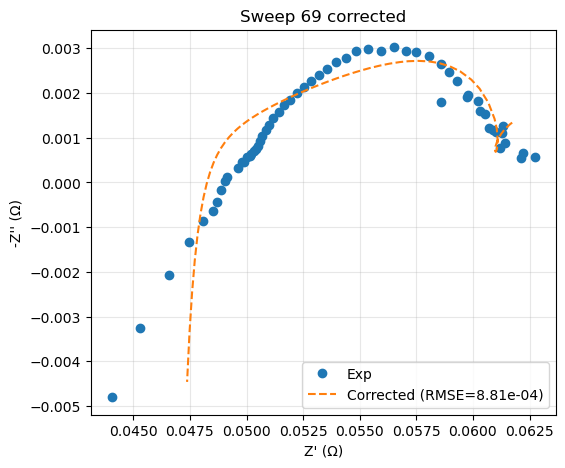


Sweep 70 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.98e-04, new RMSE=9.92e-04


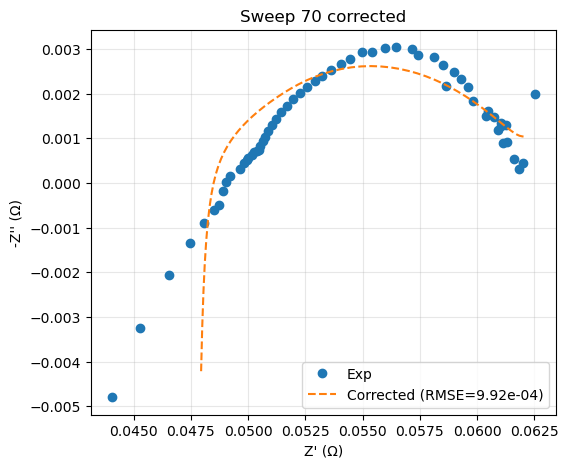


Sweep 71 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.65e-04, new RMSE=7.88e-04


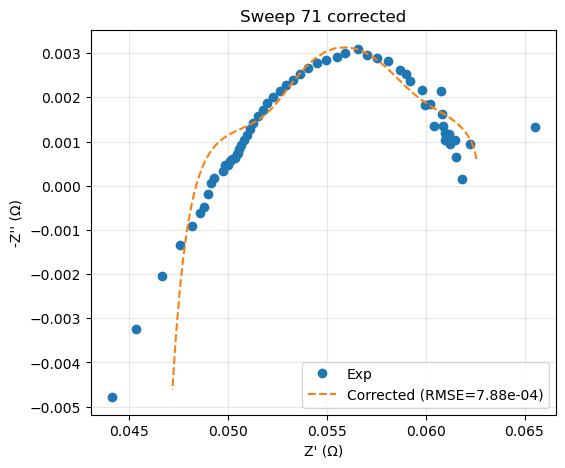


Sweep 72 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.82e-04, new RMSE=9.56e-04


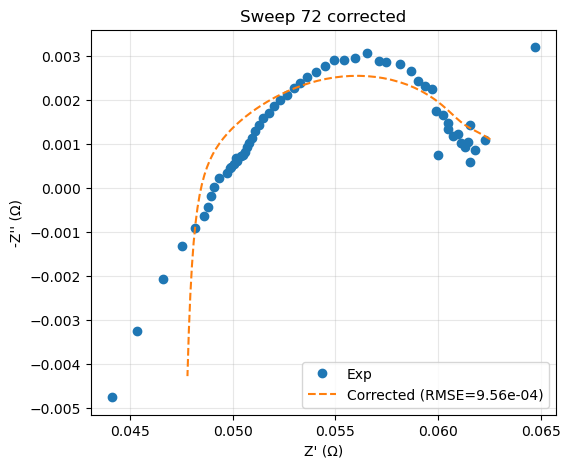


Sweep 73 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.45e-04, new RMSE=9.53e-04


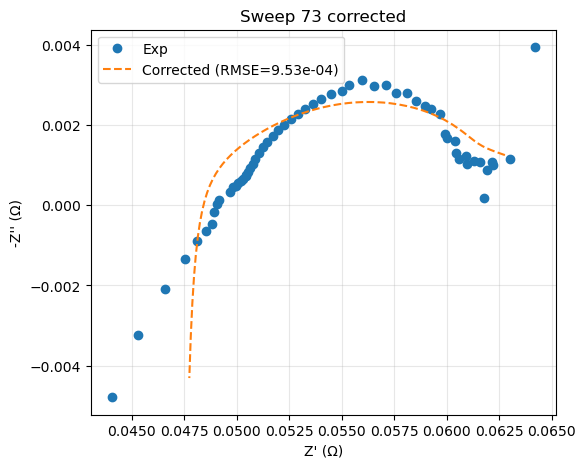


Sweep 74 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.94e-03, new RMSE=8.51e-04


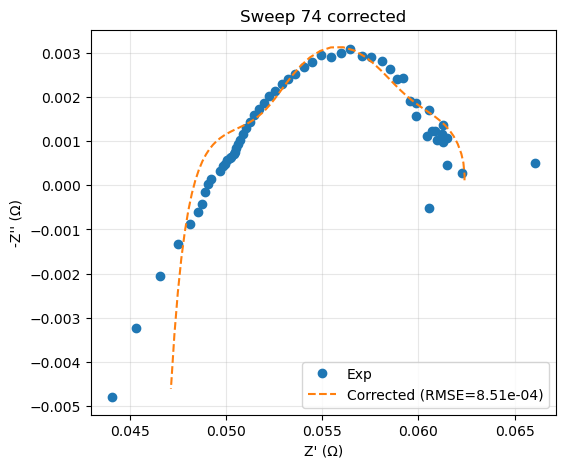


Saved uncorrected outliers for review:
    sweep_id  RelTime_hr            L0            R0        R1        L1  \
0          2    0.156667  7.045385e-09  4.027785e-02  0.120260  0.045671   
1          4    0.313889  7.057725e-09  4.573824e-02  0.085295  0.017783   
2          8    0.665278  8.345267e-09  3.930228e-02  0.107474  0.054207   
3         10    0.822500  7.767734e-09  4.505813e-02  0.073945  0.013581   
4         11    0.901389  7.766691e-09  4.516416e-02  0.065493  0.019309   
5         12    0.979722  8.679712e-09  3.897528e-02  0.126035  0.033024   
6         14    1.137222  8.334531e-09  4.194111e-02  0.080365  0.034786   
7         18    1.451667  8.572054e-09  4.079623e-02  0.091486  0.033143   
8         31    2.473611  8.746254e-09  4.116953e-02  0.086048  0.025576   
9         34    2.710000  8.064862e-09  4.573174e-02  0.071845  0.020269   
10        40    3.180833  8.574272e-09  4.294786e-02  0.069754  0.017197   
11        49    3.901667  8.464229e-09  4.331986

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings

from impedance.models.circuits import CustomCircuit
from tsfresh import extract_features
from tsfresh.utilities.dataframe_functions import impute

warnings.filterwarnings("ignore")

###############################################################################
# 1. LOAD & CLEAN DATA
###############################################################################
file_path = "6300.xls"
all_sheets = pd.read_excel(file_path, sheet_name=None)
# pick the appropriate sheet
for name in ["Probe Frequency Domain", "EIS_Data"]:
    if name in all_sheets and not all_sheets[name].empty:
        df_eis = all_sheets[name].copy()
        break
else:
    df_eis = next(df for df in all_sheets.values() if not df.empty).copy()

# rename and drop NaNs
df_eis.rename(columns={
    "Frequency (Hz)": "frequency",
    "Real Impedance Re{z}(Ω)": "Z_real",
    "Negative Imaginary Impedance -Im{z}(Ω)": "Z_imag_neg",
    "Time": "time"
}, inplace=True)
df_eis.dropna(subset=["frequency","Z_real","Z_imag_neg"], inplace=True)

# time and sweep_id
if "time" in df_eis.columns:
    df_eis["time"] = pd.to_datetime(df_eis["time"], errors="coerce")
    df_eis.dropna(subset=["time"], inplace=True)
    df_eis["RelTime_hr"] = (df_eis["time"] - df_eis["time"].min()).dt.total_seconds()/3600
else:
    df_eis["RelTime_hr"] = np.arange(len(df_eis))*0.1

df_eis["sweep_id"] = df_eis.groupby("time").ngroup()

###############################################################################
# 2. EXTRACT TSFRESH FEATURES (optional, used earlier but not needed for ECM)
###############################################################################
# df_tsfresh = df_eis[["sweep_id","frequency","Z_real"]].rename(
#     columns={"sweep_id":"id","frequency":"time","Z_real":"value"}
# )
# features = extract_features(df_tsfresh, column_id="id", column_sort="time", n_jobs=0)
# impute(features)
# features.reset_index(inplace=True); features.rename(columns={"index":"sweep_id"}, inplace=True)

###############################################################################
# 3. DEFINE ADVANCED ECM MODEL
###############################################################################
adv = {
    "name": "Advanced_2RCPE",
    "circuit": "L0-R0-p(R1-L1, R2-CPE1, R3-CPE3)",
    "initial_guess": [0.0, 0.04941, 0.0083883, 2.0785, 0.0083683, 0.46421, 1.0, 2.2071, 1.0, 1.0],
    "param_names": ["L0","R0","R1","L1","R2","CPE1-Q","CPE1-alpha","R3","CPE3-Q","CPE3-alpha"]
}

def fit_model(model, freq, Zexp):
    circ = CustomCircuit(circuit=model["circuit"], initial_guess=model["initial_guess"])
    circ.fit(freq, Zexp)
    Zfit = circ.predict(freq)
    rmse = np.sqrt(np.mean(np.abs(Zexp - Zfit)**2))
    return circ.parameters_, rmse

###############################################################################
# 4. FIT ECM TO EACH SWEEP
###############################################################################
fit_results = []
for sid, grp in df_eis.groupby("sweep_id"):
    grp = grp.sort_values("frequency")
    if len(grp) < 3:
        continue
    freq = grp["frequency"].values
    Zexp = grp["Z_real"].values + 1j * (-grp["Z_imag_neg"].values)
    params, rmse = fit_model(adv, freq, Zexp)
    fit_results.append({
        "sweep_id": sid,
        "params": params,
        "rmse": rmse,
        "RelTime_hr": grp["RelTime_hr"].iloc[0]
    })

fit_df = pd.DataFrame(fit_results)
# expand parameters into columns
for i, name in enumerate(adv["param_names"]):
    fit_df[name] = fit_df["params"].apply(lambda x: x[i])

###############################################################################
# 5. OUTLIER TAGGING (freeze mask)
###############################################################################
alpha_cols = [c for c in adv["param_names"] if "alpha" in c.lower()]
alpha_mask = fit_df[alpha_cols].min(axis=1) < 0.5
if alpha_mask.all():
    # fallback to RMSE Z-score
    z = (fit_df["rmse"] - fit_df["rmse"].mean()) / fit_df["rmse"].std()
    alpha_mask = abs(z) > 2
    print("Alpha rule caught all; using RMSE Z-score >2 instead.")
fit_df["is_outlier"] = alpha_mask

majority_df = fit_df[~alpha_mask].copy()
outlier_df  = fit_df[ alpha_mask].copy()

# print RMSE comparison
maj = majority_df["rmse"]
out = outlier_df["rmse"]
print(f"Majority fits ({len(maj)}): mean RMSE={maj.mean():.3e}, median={maj.median():.3e}")
print(f"Outlier  fits ({len(out)}): mean RMSE={out.mean():.3e}, median={out.median():.3e}")

# helper for Nyquist plotting
def plot_nyquist(sid, label):
    grp = df_eis[df_eis["sweep_id"]==sid].sort_values("frequency")
    freq = grp["frequency"].values
    Zexp = grp["Z_real"].values + 1j * (-grp["Z_imag_neg"].values)
    row = fit_df[fit_df["sweep_id"]==sid].iloc[0]
    circ = CustomCircuit(circuit=adv["circuit"], initial_guess=adv["initial_guess"])
    circ.parameters_ = row["params"]
    Zfit = circ.predict(freq)
    plt.figure(figsize=(6,5))
    plt.plot(Zexp.real, -Zexp.imag, 'o', label="Exp", markersize=4)
    plt.plot(Zfit.real, -Zfit.imag, '-', label=f"{label} (RMSE={row['rmse']:.2e})", linewidth=2)
    plt.xlabel("Z' (Ω)"); plt.ylabel("-Z'' (Ω)")
    plt.title(f"Sweep {sid} — {label}")
    plt.legend(); plt.grid(alpha=0.3); plt.show()

# plot best majority & worst outlier
if not majority_df.empty:
    best_maj = majority_df.loc[majority_df["rmse"].idxmin(),"sweep_id"]
    plot_nyquist(best_maj, "Best Majority")
if not outlier_df.empty:
    worst_out = outlier_df.loc[outlier_df["rmse"].idxmax(),"sweep_id"]
    plot_nyquist(worst_out, "Worst Outlier")

###############################################################################
# 6. OUTLIER CORRECTION ACTIONS
###############################################################################
window = 5
uncorrected = []

for _, out_row in outlier_df.iterrows():
    sid = out_row["sweep_id"]
    t0  = out_row["RelTime_hr"]

    # find nearest majority neighbors by time
    majority_df["time_diff"] = abs(majority_df["RelTime_hr"] - t0)
    nbrs = majority_df.nsmallest(window, "time_diff")
    if nbrs.empty:
        continue

    # moving-average initial guess
    new_guess = np.stack(nbrs["params"].values).mean(axis=0)
    print(f"\nSweep {sid} new initial guess:", new_guess)

    # re-fit
    grp = df_eis[df_eis["sweep_id"]==sid].sort_values("frequency")
    freq = grp["frequency"].values
    Zexp = grp["Z_real"].values + 1j * (-grp["Z_imag_neg"].values)
    circ = CustomCircuit(circuit=adv["circuit"], initial_guess=new_guess)
    try:
        circ.fit(freq, Zexp)
        new_rmse = np.sqrt(np.mean(np.abs(Zexp - circ.predict(freq))**2))
    except Exception:
        new_rmse = np.nan

    print(f"  original RMSE={out_row['rmse']:.2e}, new RMSE={new_rmse:.2e}")

    # plot corrected
    Zf2 = circ.predict(freq)
    plt.figure(figsize=(6,5))
    plt.plot(Zexp.real, -Zexp.imag, 'o', label="Exp")
    plt.plot(Zf2.real, -Zf2.imag, '--', label=f"Corrected (RMSE={new_rmse:.2e})")
    plt.xlabel("Z' (Ω)"); plt.ylabel("-Z'' (Ω)")
    plt.title(f"Sweep {sid} corrected"); plt.legend(); plt.grid(alpha=0.3); plt.show()

    # if no improvement, record for review
    if np.isnan(new_rmse) or new_rmse >= out_row["rmse"]:
        uncorrected.append({
            "sweep_id": sid,
            "RelTime_hr": t0,
            **{nm: out_row[nm] for nm in adv["param_names"]},
            "orig_rmse": out_row["rmse"],
            "new_rmse": new_rmse
        })

# save uncorrected outliers
if uncorrected:
    review_df = pd.DataFrame(uncorrected)
    review_df.to_excel("uncorrected_outliers.xlsx", index=False)
    print("\nSaved uncorrected outliers for review:")
    print(review_df)
else:
    print("\nAll outliers improved with moving-average initial guesses.")

RMSE statistics:
  Majority fits: mean RMSE = 2.326e-02, median RMSE = 2.326e-02, count = 1
  Outlier  fits: mean RMSE = 1.205e-03, median RMSE = 9.661e-04, count = 74


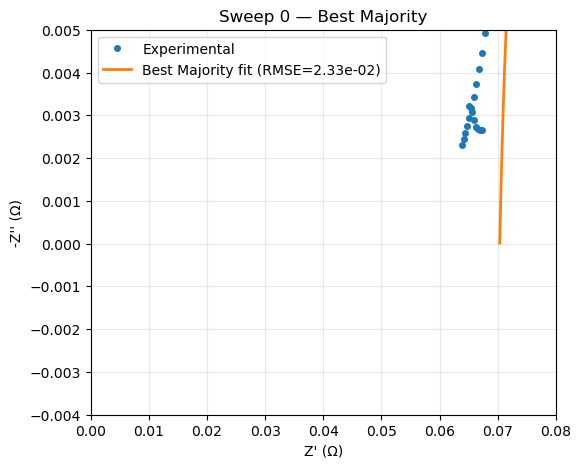

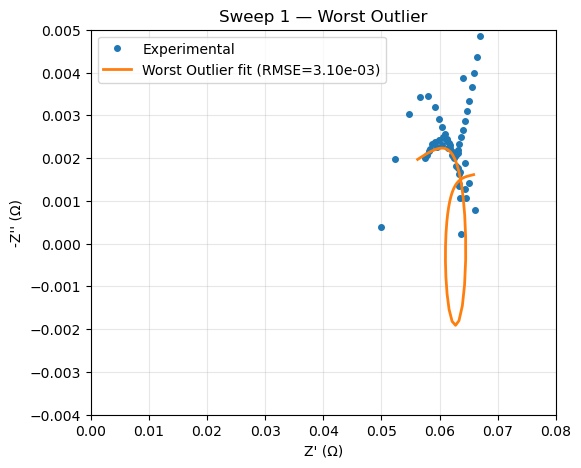

Sweep 1 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=3.10e-03, new RMSE=3.01e-03


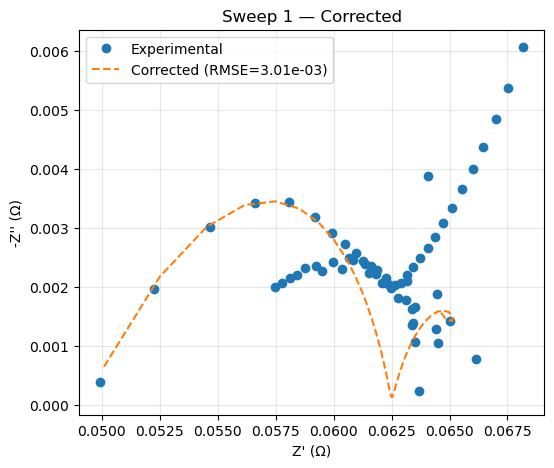

Sweep 2 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.43e-04, new RMSE=9.76e-04


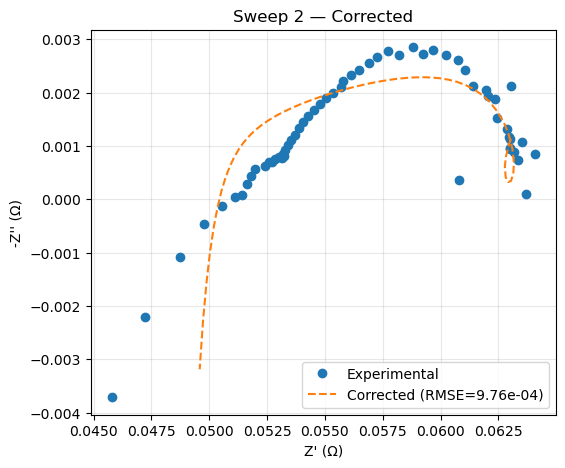

Sweep 3 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.04e-03, new RMSE=9.79e-04


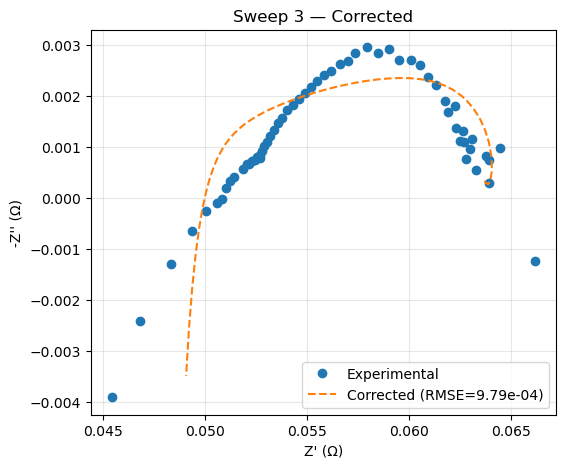

Sweep 4 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.25e-04, new RMSE=1.01e-03


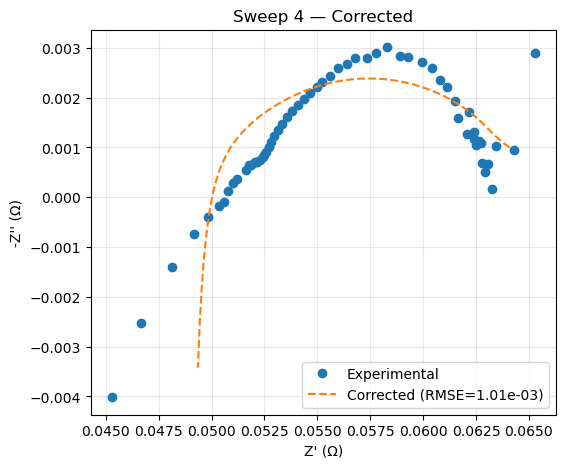

Sweep 5 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.69e-04, new RMSE=9.62e-04


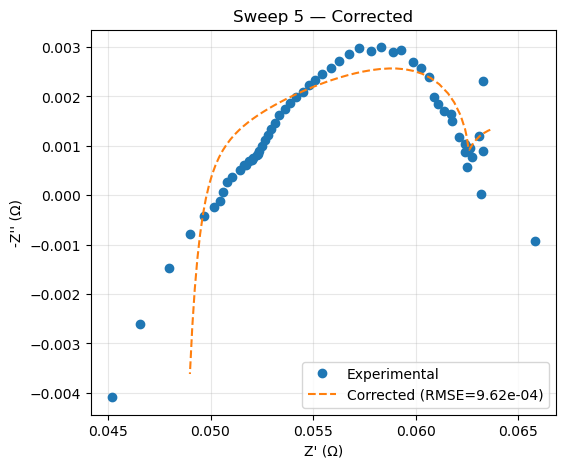

Sweep 6 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.00e-03, new RMSE=9.52e-04


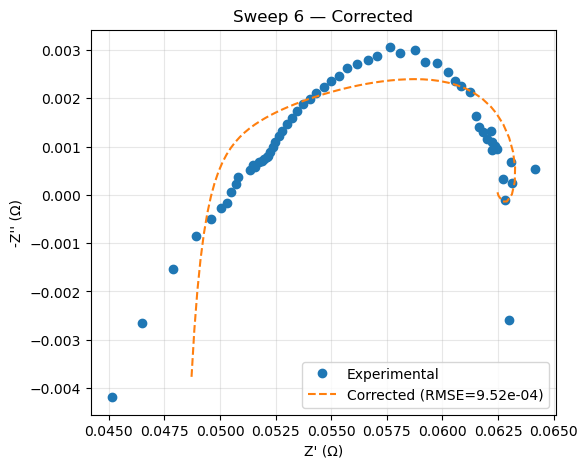

Sweep 7 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.18e-04, new RMSE=9.16e-04


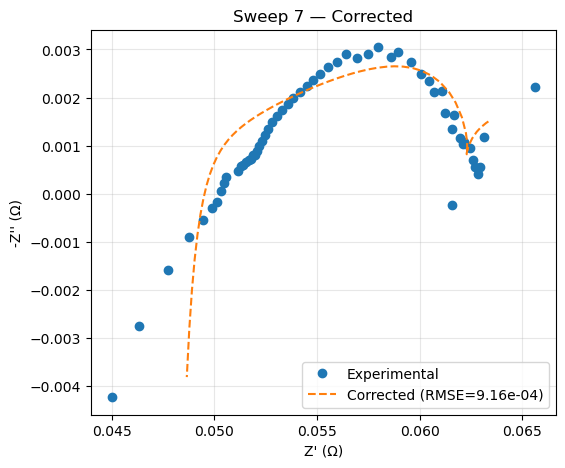

Sweep 8 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.60e-04, new RMSE=1.08e-03


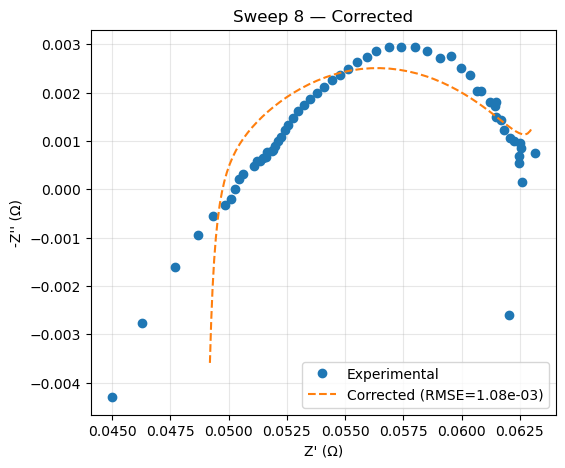

Sweep 9 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.66e-04, new RMSE=9.52e-04


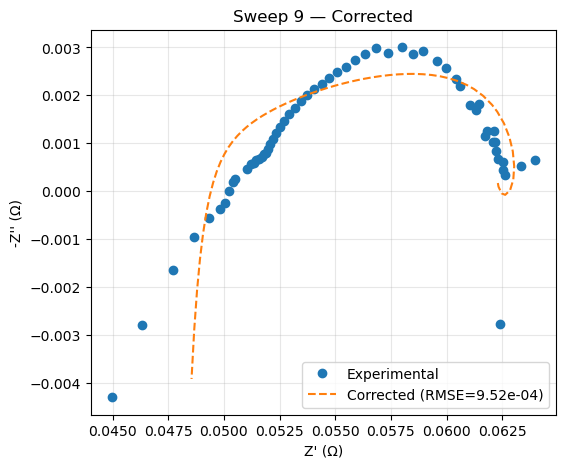

Sweep 10 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.80e-04, new RMSE=9.38e-04


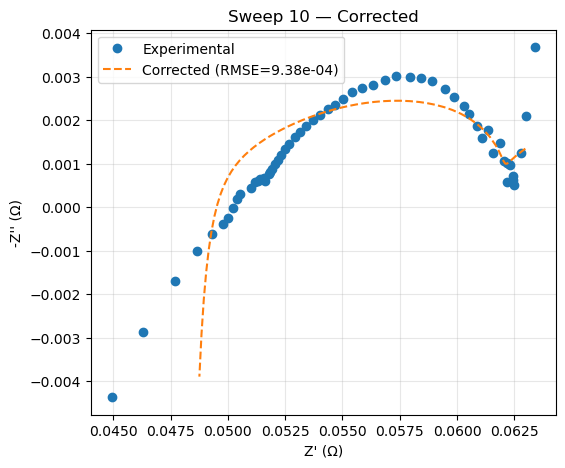

Sweep 11 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.01e-04, new RMSE=1.05e-03


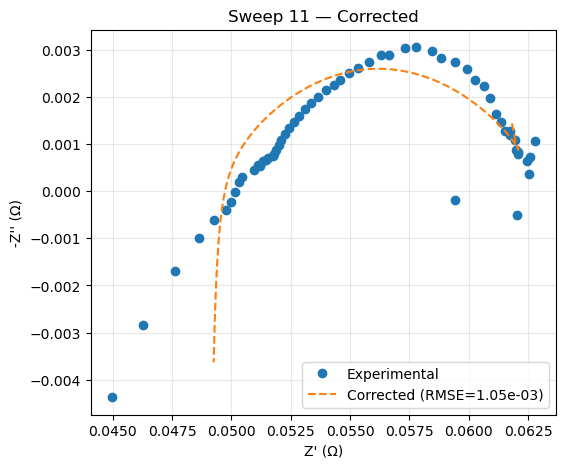

Sweep 12 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.16e-04, new RMSE=9.26e-04


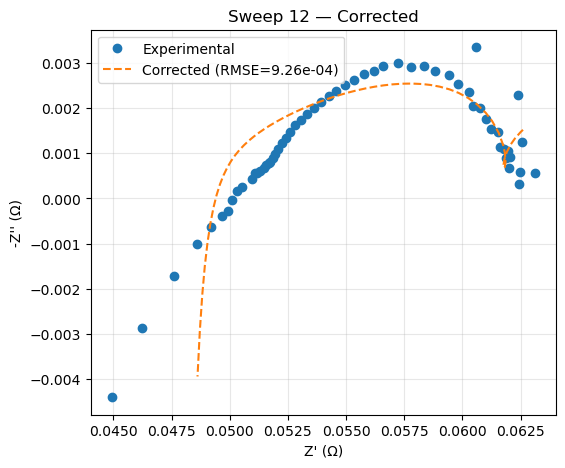

Sweep 13 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.33e-04, new RMSE=9.31e-04


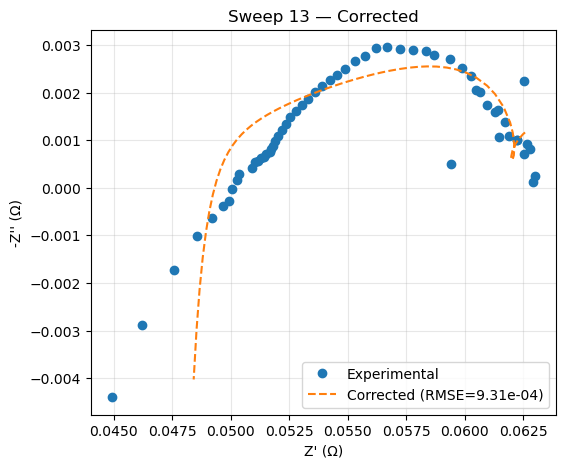

Sweep 14 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.30e-04, new RMSE=1.03e-03


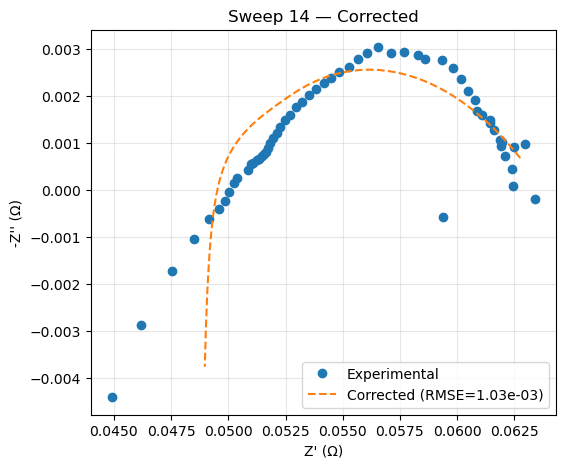

Sweep 15 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.29e-04, new RMSE=9.25e-04


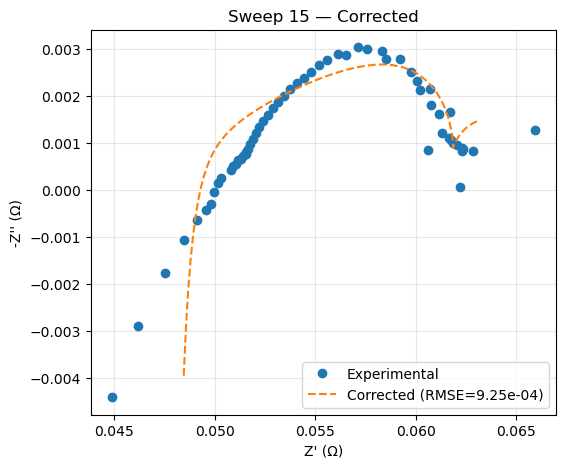

Sweep 16 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.05e-03, new RMSE=9.51e-04


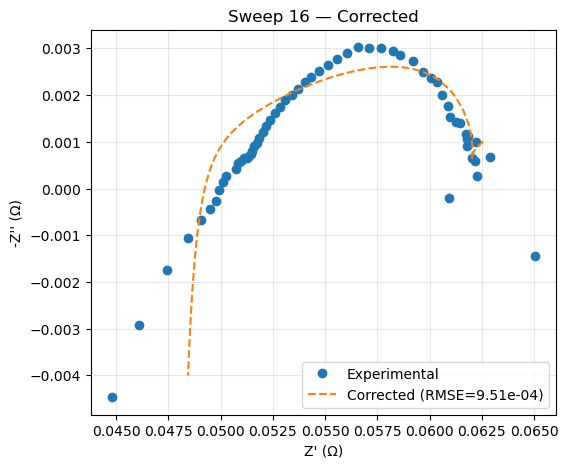

Sweep 17 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.07e-04, new RMSE=8.97e-04


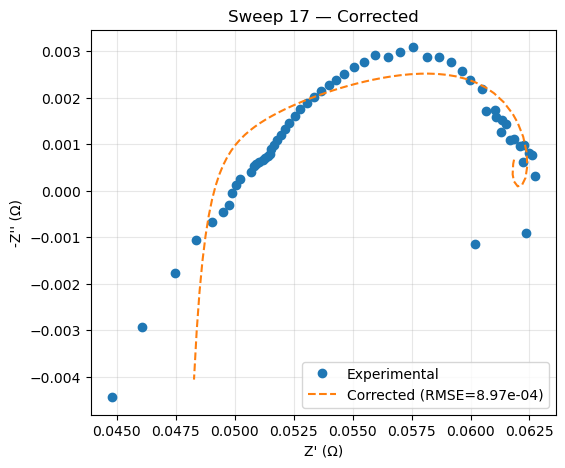

Sweep 18 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.99e-04, new RMSE=9.95e-04


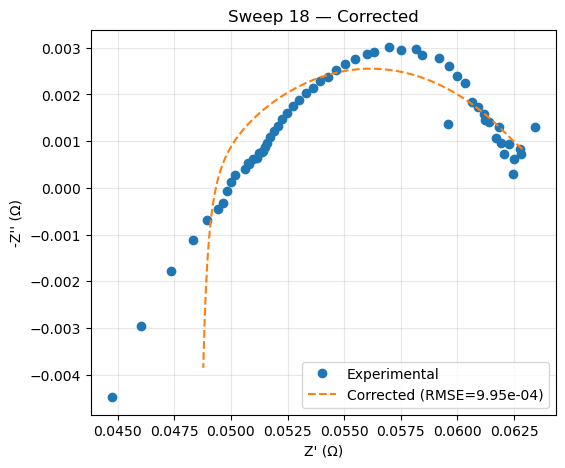

Sweep 19 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.65e-04, new RMSE=9.45e-04


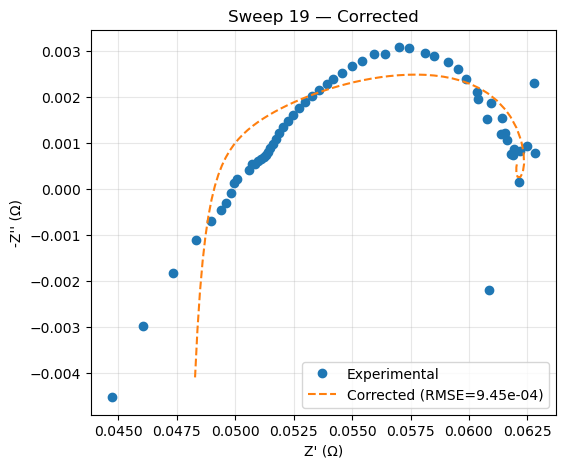

Sweep 20 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.03e-03, new RMSE=9.54e-04


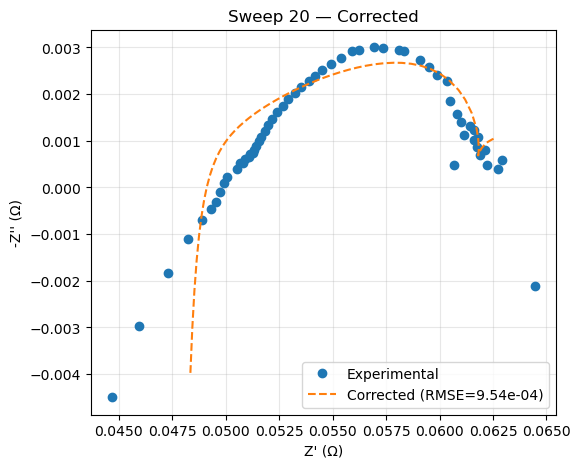

Sweep 21 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.96e-03, new RMSE=9.30e-04


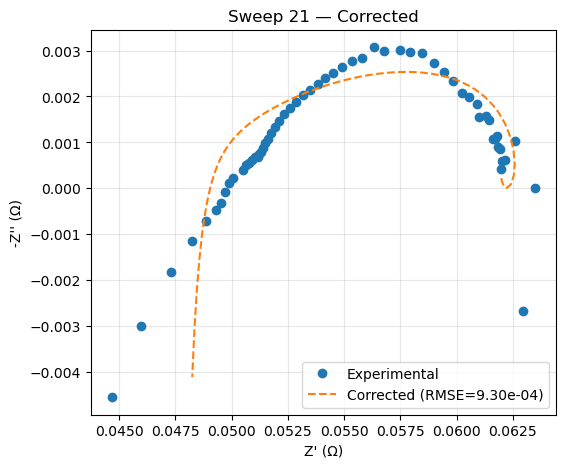

Sweep 22 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.02e-04, new RMSE=8.96e-04


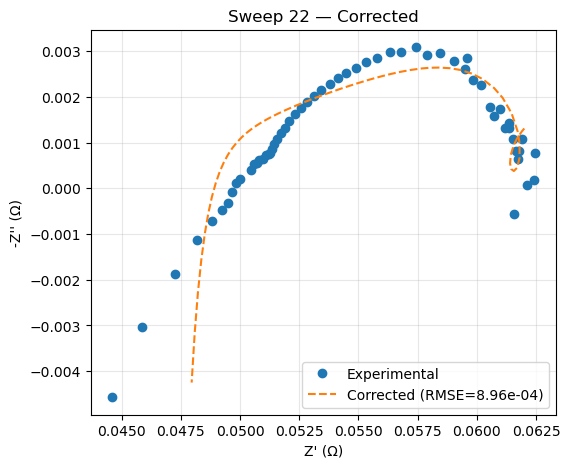

Sweep 23 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.60e-04, new RMSE=9.25e-04


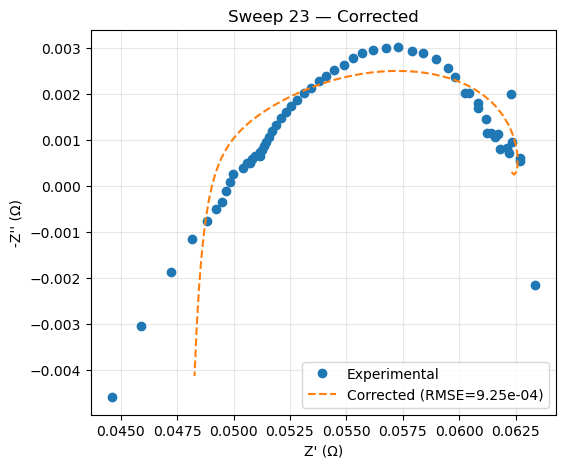

Sweep 24 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.51e-04, new RMSE=9.04e-04


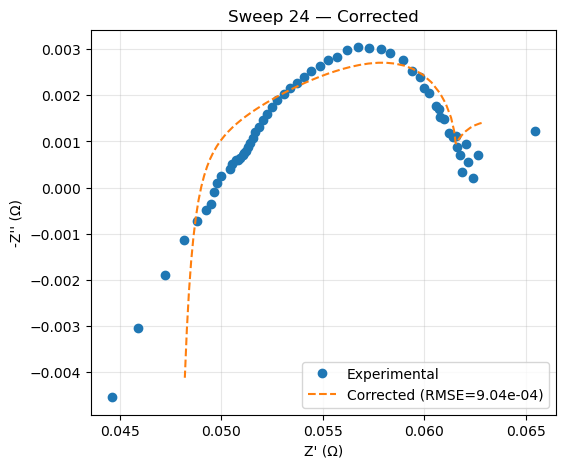

Sweep 25 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.01e-03, new RMSE=9.54e-04


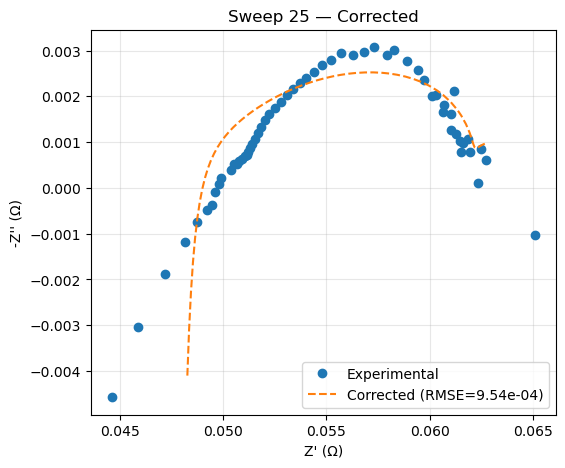

Sweep 26 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.88e-04, new RMSE=8.76e-04


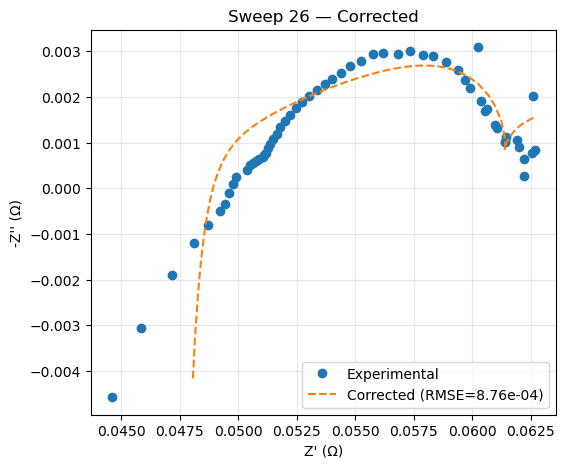

Sweep 27 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.96e-04, new RMSE=9.55e-04


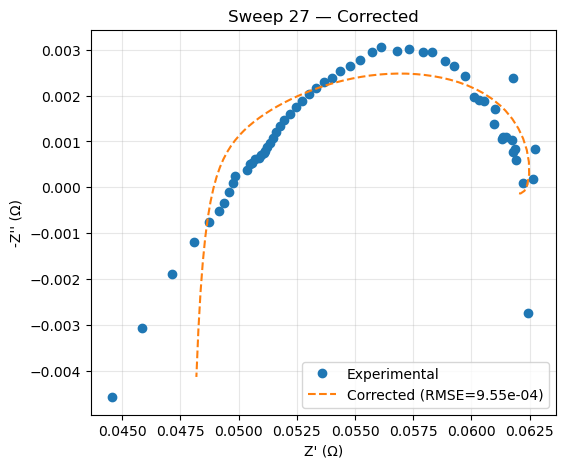

Sweep 28 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.30e-04, new RMSE=9.17e-04


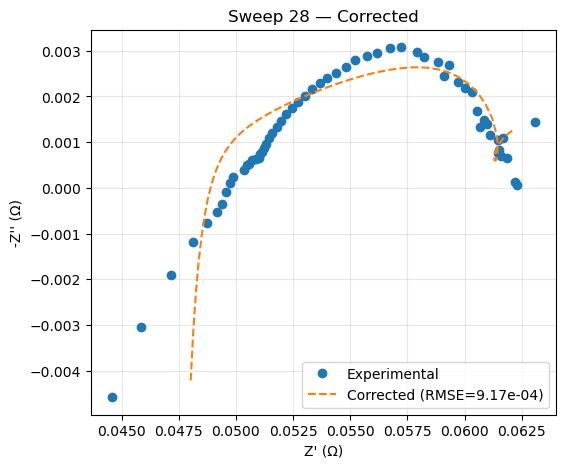

Sweep 29 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.96e-03, new RMSE=9.45e-04


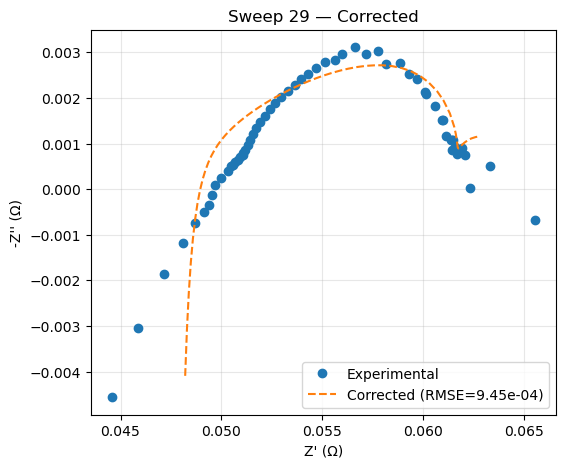

Sweep 30 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.98e-04, new RMSE=8.94e-04


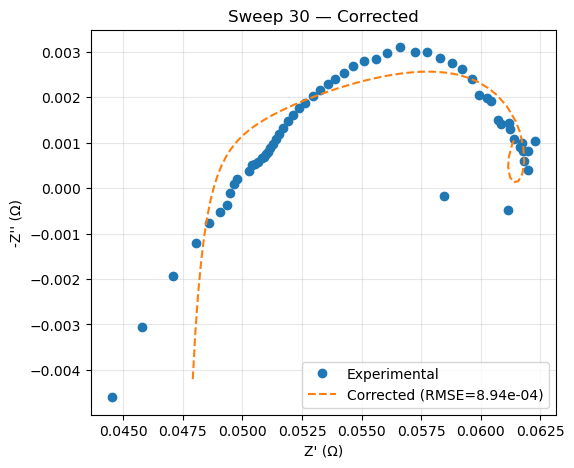

Sweep 31 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.39e-04, new RMSE=1.00e-03


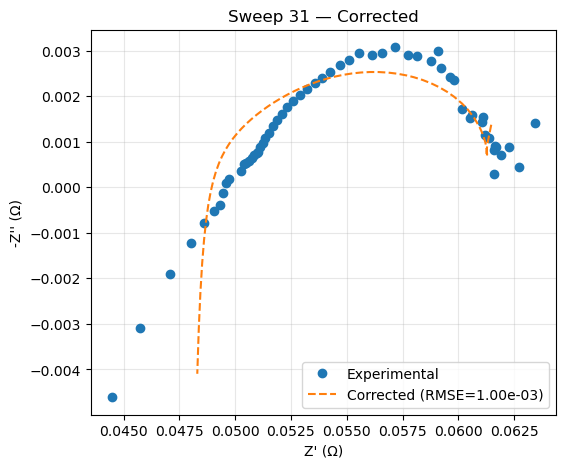

Sweep 32 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.97e-04, new RMSE=9.67e-04


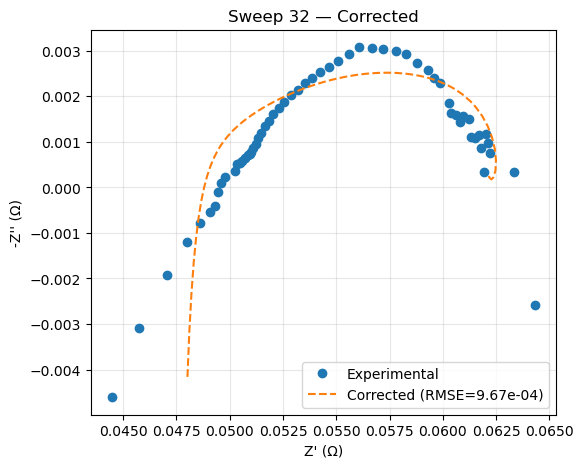

Sweep 33 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.08e-04, new RMSE=8.96e-04


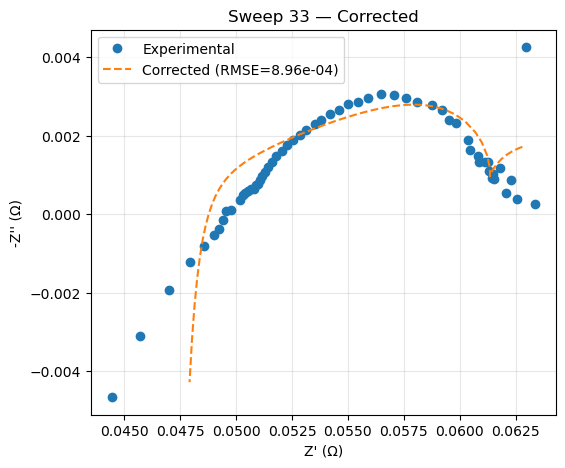

Sweep 34 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.22e-04, new RMSE=9.25e-04


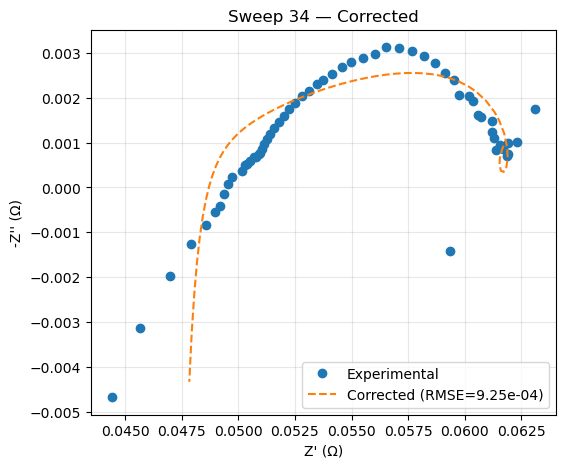

Sweep 35 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.22e-04, new RMSE=9.02e-04


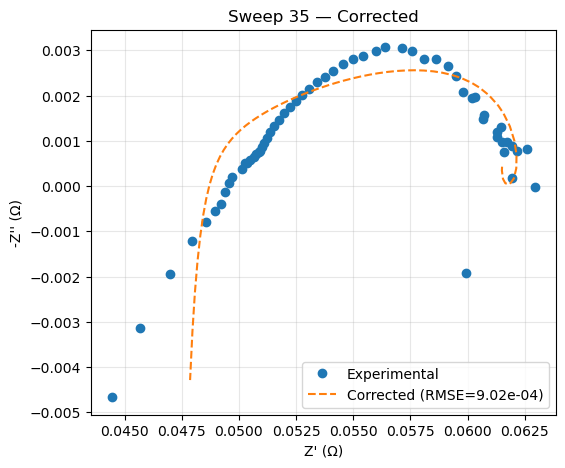

Sweep 36 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.99e-03, new RMSE=9.85e-04


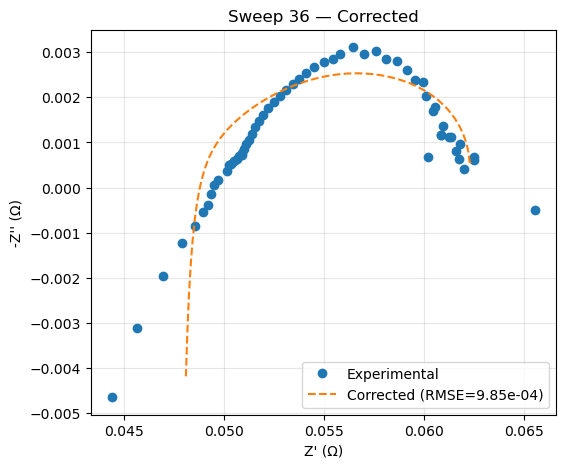

Sweep 37 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.01e-03, new RMSE=9.58e-04


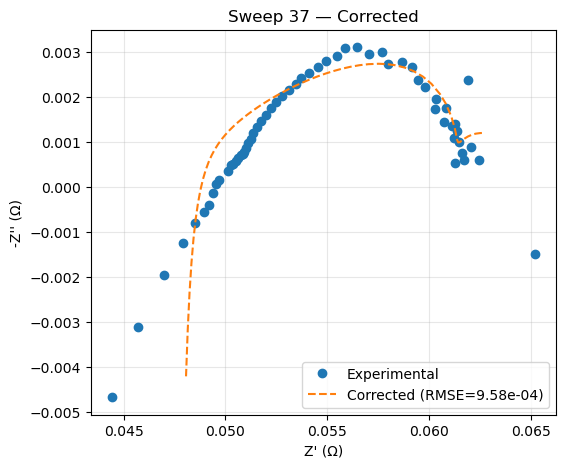

Sweep 38 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.51e-04, new RMSE=9.44e-04


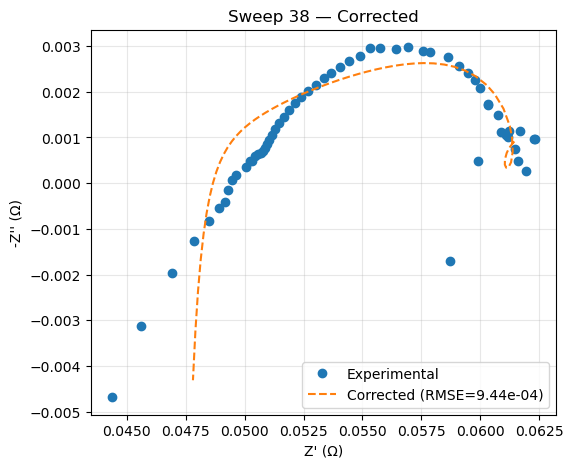

Sweep 39 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.05e-03, new RMSE=1.03e-03


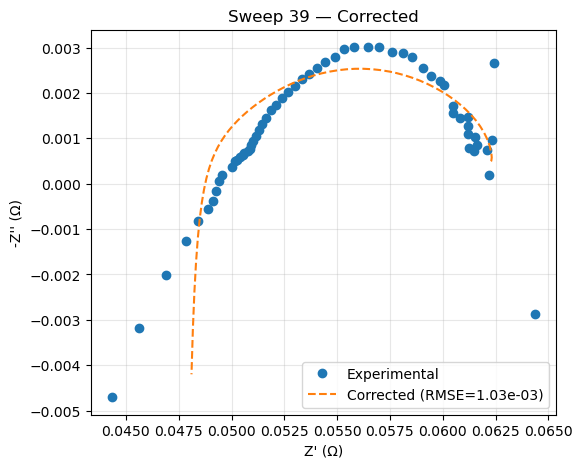

Sweep 40 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.69e-04, new RMSE=9.85e-04


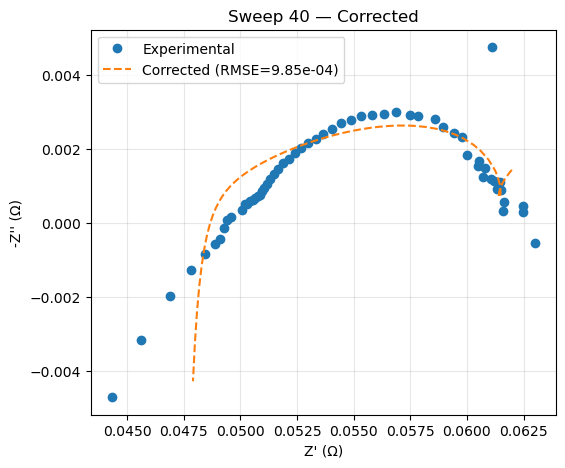

Sweep 41 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.05e-03, new RMSE=1.02e-03


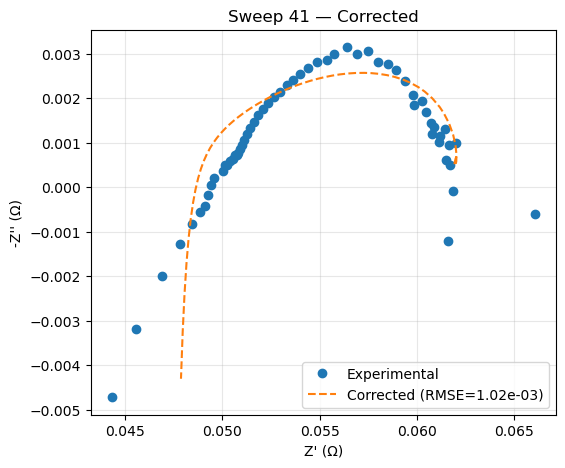

Sweep 42 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=2.01e-03, new RMSE=9.75e-04


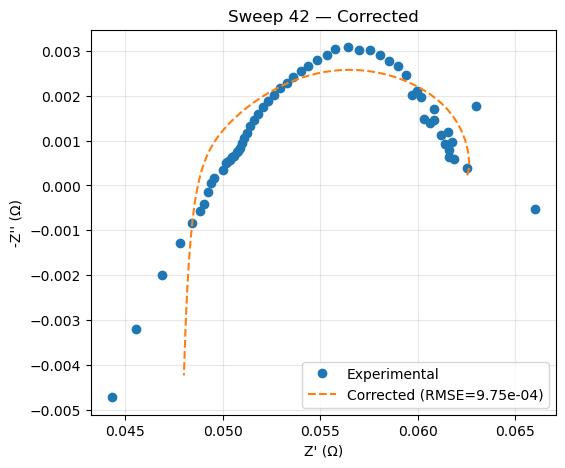

Sweep 43 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.01e-03, new RMSE=9.76e-04


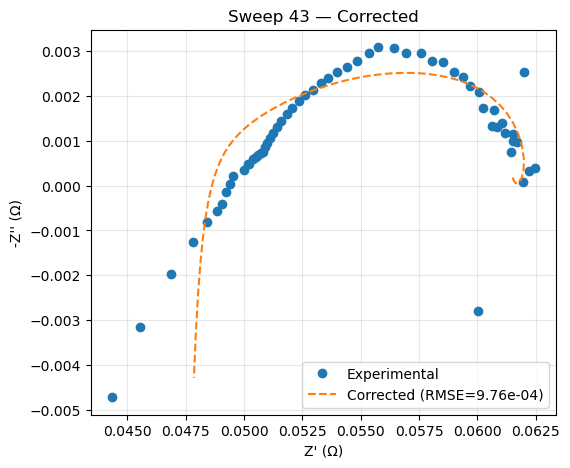

Sweep 44 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.85e-04, new RMSE=8.29e-04


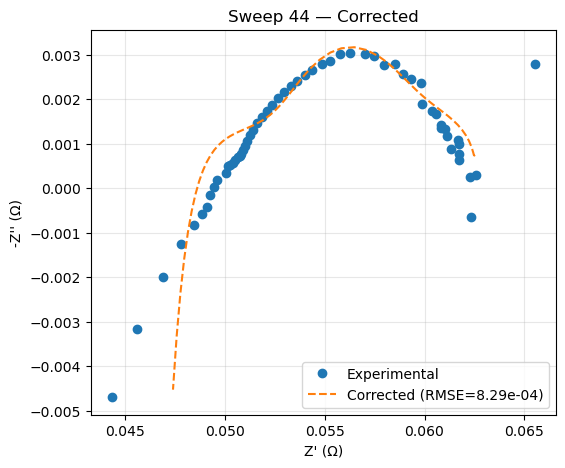

Sweep 45 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.98e-04, new RMSE=9.98e-04


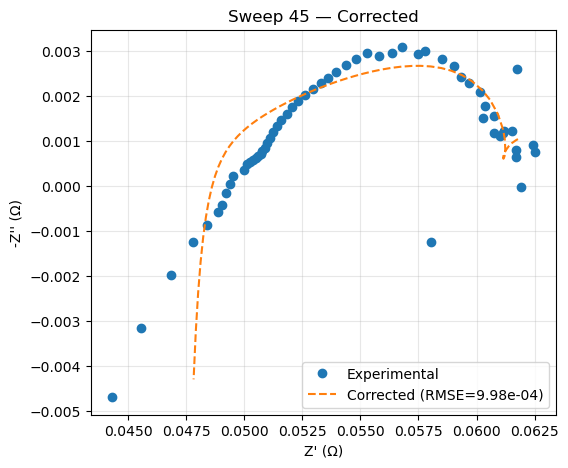

Sweep 46 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.83e-04, new RMSE=9.58e-04


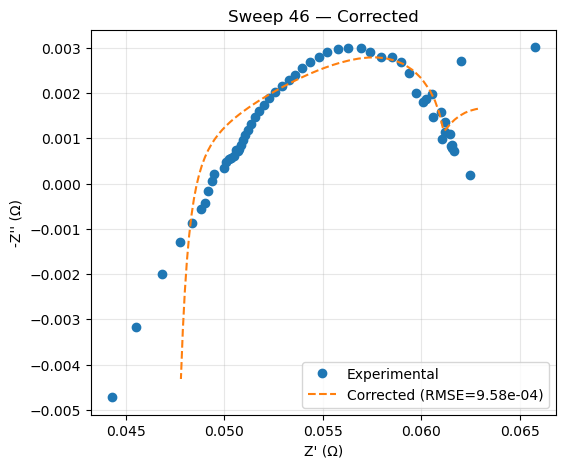

Sweep 47 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.70e-04, new RMSE=9.70e-04


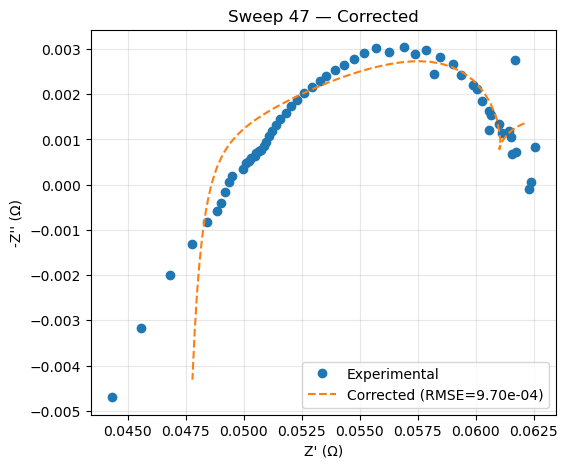

Sweep 48 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.88e-04, new RMSE=9.73e-04


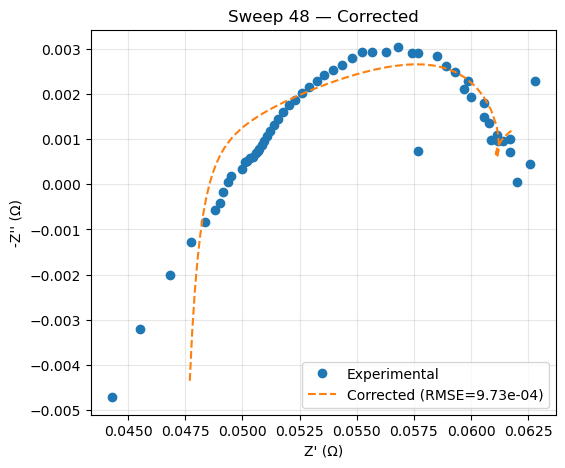

Sweep 49 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.41e-04, new RMSE=1.02e-03


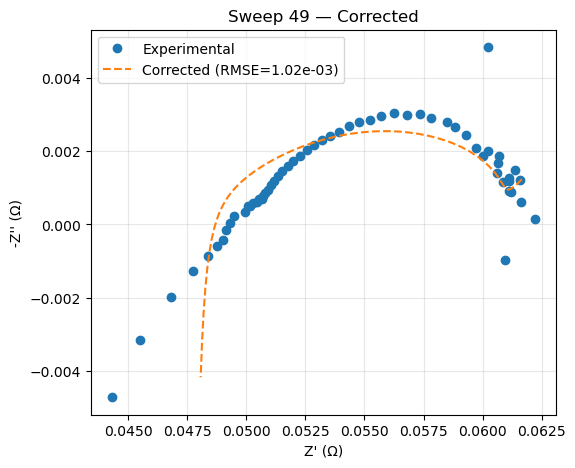

Sweep 50 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.91e-04, new RMSE=9.68e-04


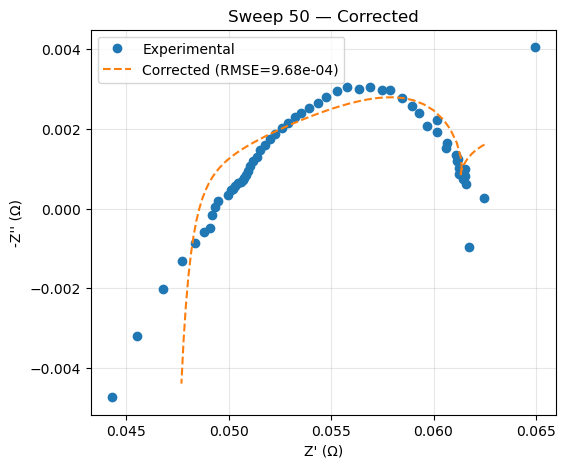

Sweep 51 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.16e-04, new RMSE=1.02e-03


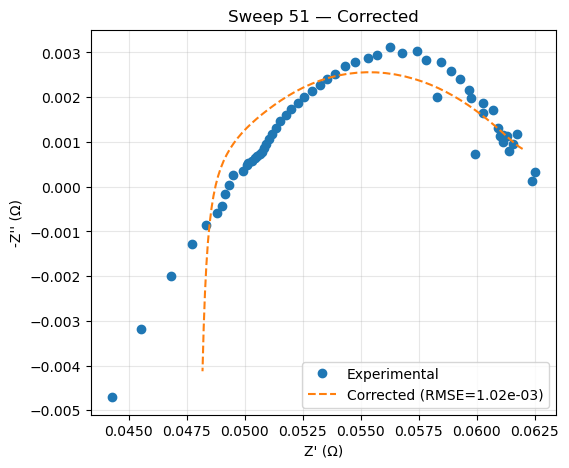

Sweep 52 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.56e-04, new RMSE=1.03e-03


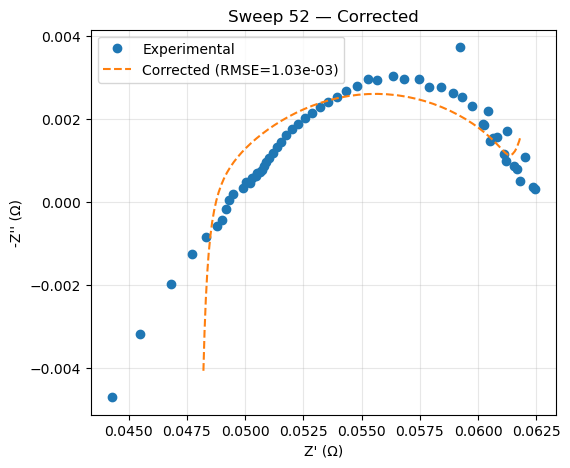

Sweep 53 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.22e-04, new RMSE=9.99e-04


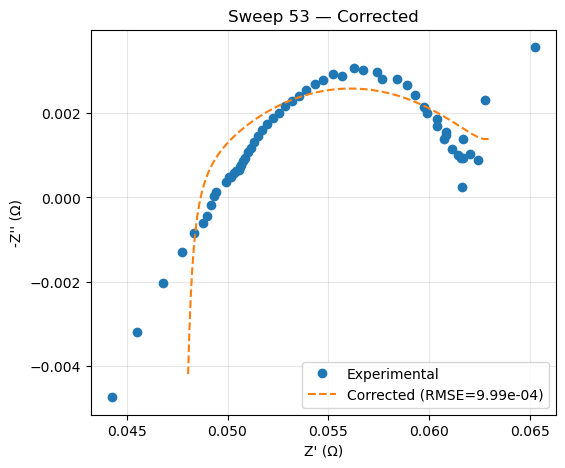

Sweep 54 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.96e-03, new RMSE=1.01e-03


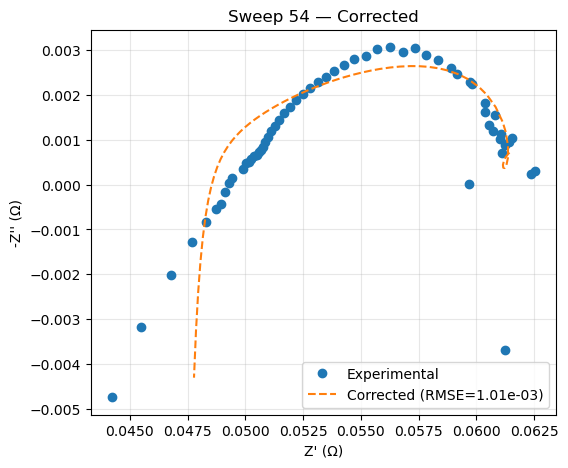

Sweep 55 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.82e-04, new RMSE=1.05e-03


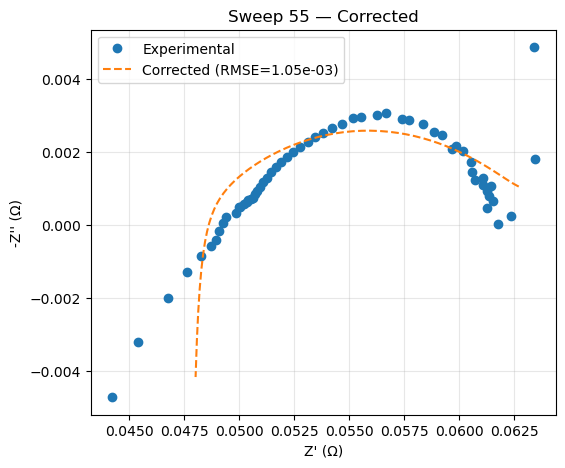

Sweep 56 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.47e-04, new RMSE=1.06e-03


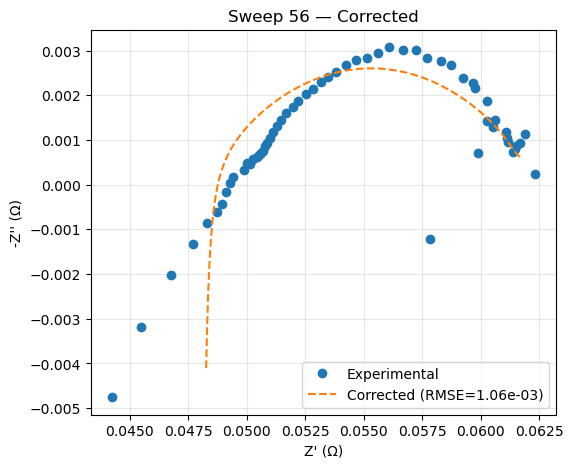

Sweep 57 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.66e-04, new RMSE=1.14e-03


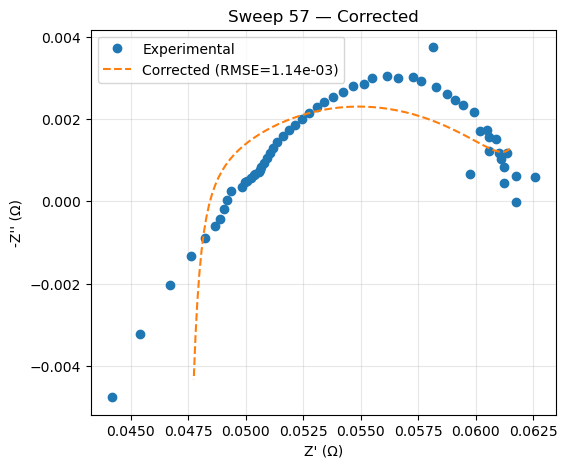

Sweep 58 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.20e-04, new RMSE=1.01e-03


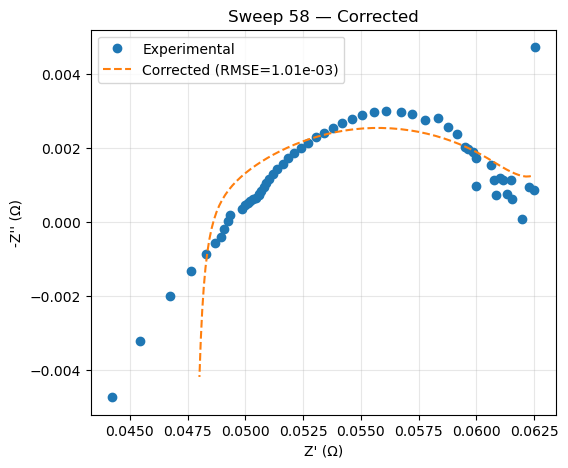

Sweep 59 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.36e-04, new RMSE=1.00e-03


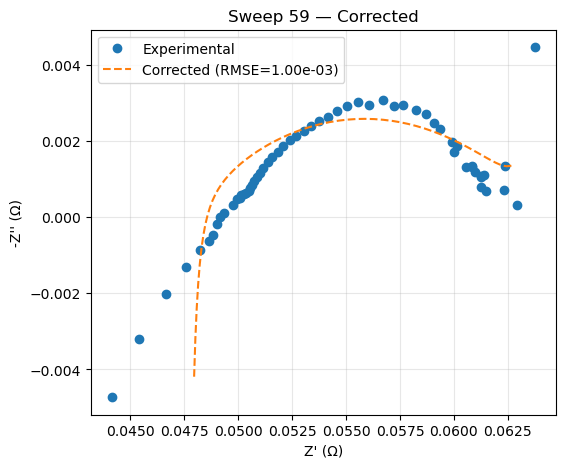

Sweep 60 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.95e-03, new RMSE=9.84e-04


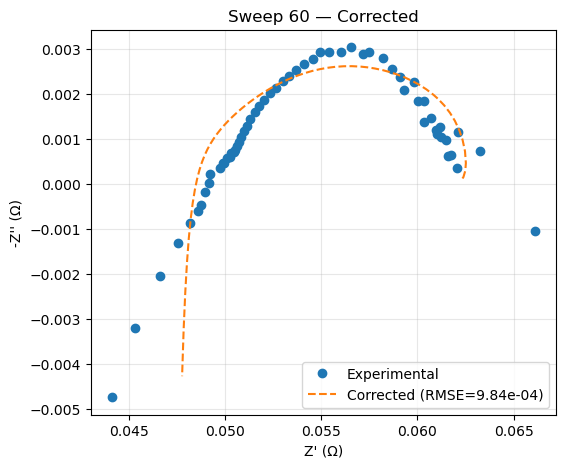

Sweep 61 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.87e-04, new RMSE=9.87e-04


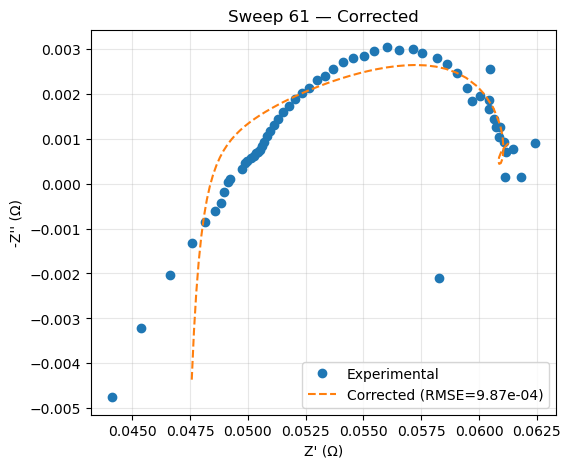

Sweep 62 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.77e-04, new RMSE=9.79e-04


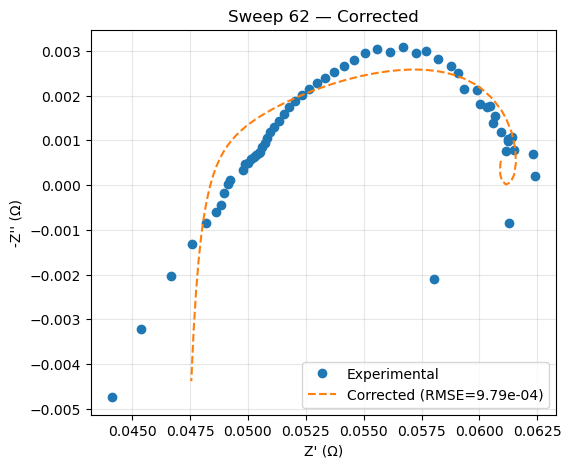

Sweep 63 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.97e-03, new RMSE=1.05e-03


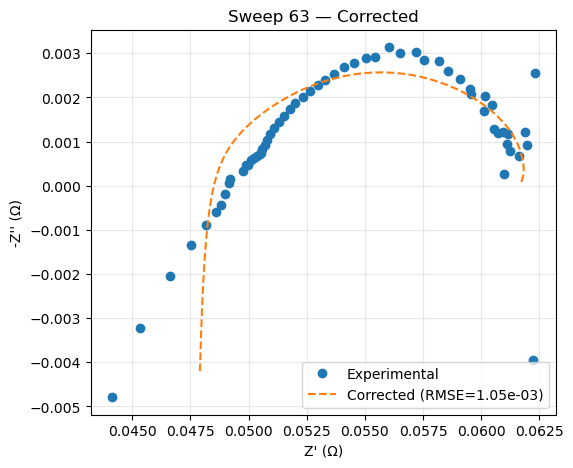

Sweep 64 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.04e-03, new RMSE=1.09e-03


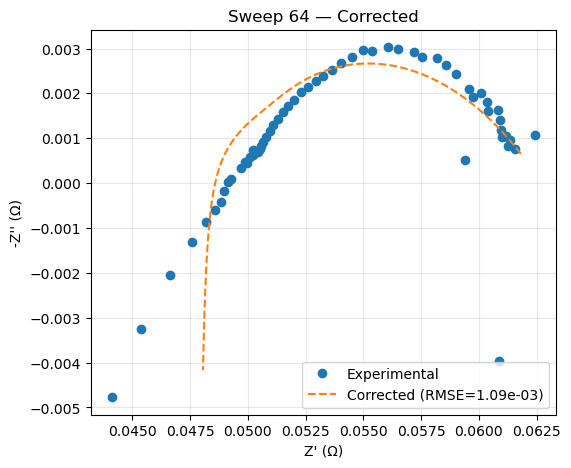

Sweep 65 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.11e-03, new RMSE=1.05e-03


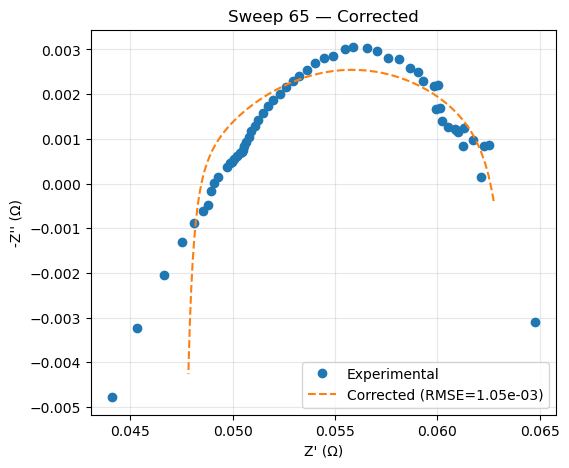

Sweep 66 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.02e-03, new RMSE=1.02e-03


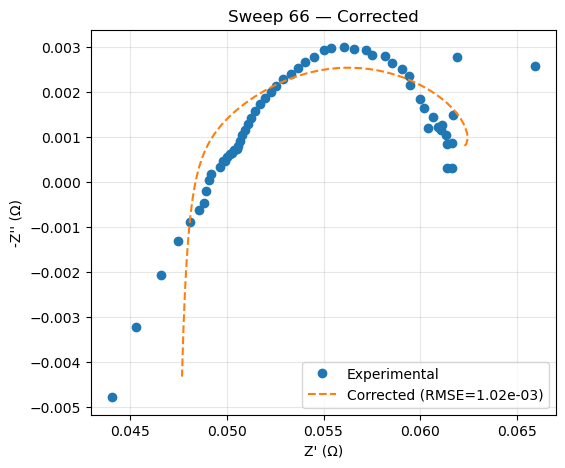

Sweep 67 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.95e-03, new RMSE=9.80e-04


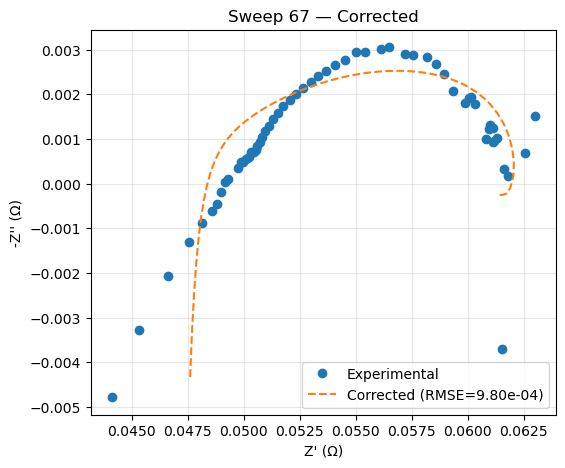

Sweep 68 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.94e-03, new RMSE=9.93e-04


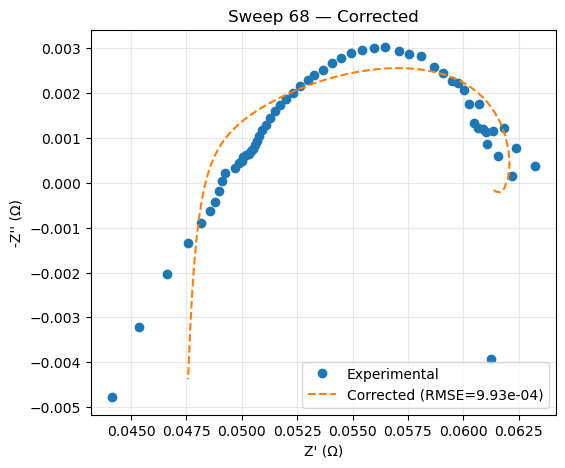

Sweep 69 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.95e-04, new RMSE=8.81e-04


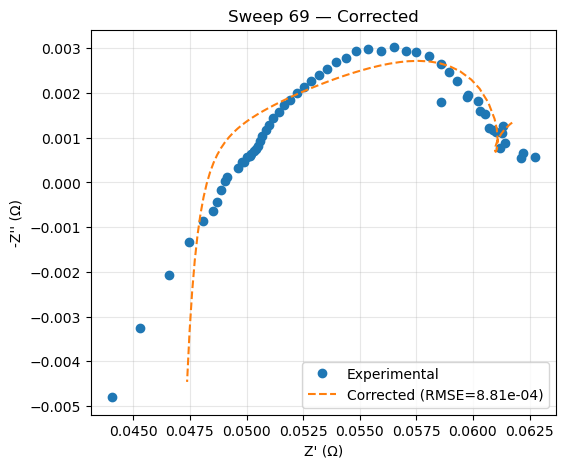

Sweep 70 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.98e-04, new RMSE=9.92e-04


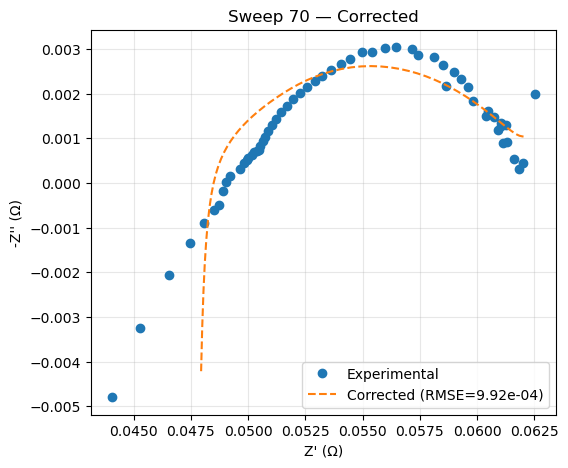

Sweep 71 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.65e-04, new RMSE=7.88e-04


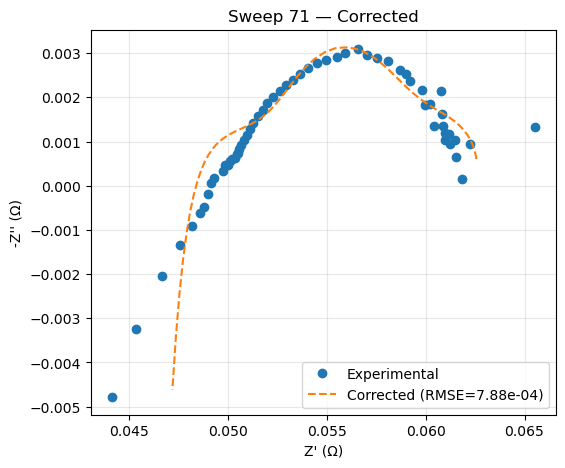

Sweep 72 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=8.82e-04, new RMSE=9.56e-04


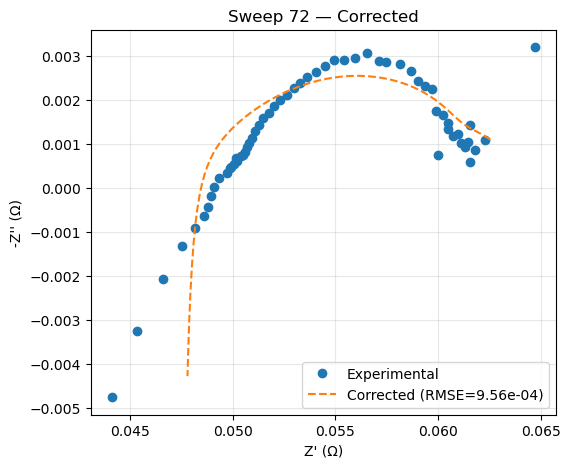

Sweep 73 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=9.45e-04, new RMSE=9.53e-04


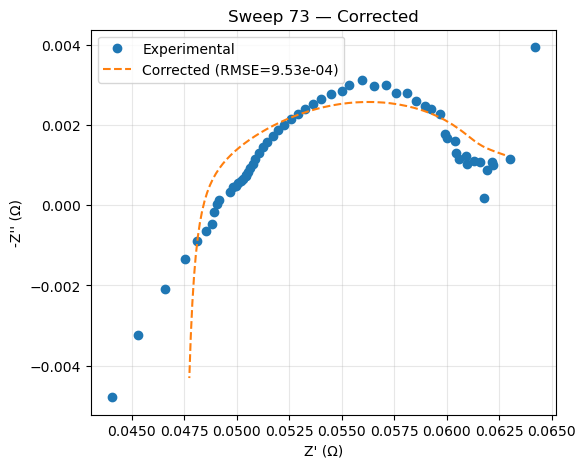

Sweep 74 new initial guess: [4.94065646e-324 6.97469388e-032 2.51268995e+002 9.40397226e+001
 2.52335495e-001 2.90250995e-002 9.60922425e-001 9.75580144e-002
 2.03222897e+000 7.72227525e-001]
  original RMSE=1.94e-03, new RMSE=8.51e-04


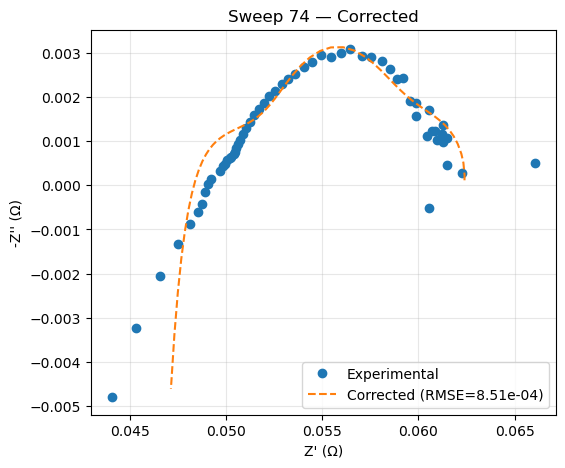

Saved uncorrected outliers for review:
    sweep_id   time_hr            L0            R0        R1        L1  \
0          2  0.156667  7.045385e-09  4.027785e-02  0.120260  0.045671   
1          4  0.313889  7.057725e-09  4.573824e-02  0.085295  0.017783   
2          8  0.665278  8.345267e-09  3.930228e-02  0.107474  0.054207   
3         10  0.822500  7.767734e-09  4.505813e-02  0.073945  0.013581   
4         11  0.901389  7.766691e-09  4.516416e-02  0.065493  0.019309   
5         12  0.979722  8.679712e-09  3.897528e-02  0.126035  0.033024   
6         14  1.137222  8.334531e-09  4.194111e-02  0.080365  0.034786   
7         18  1.451667  8.572054e-09  4.079623e-02  0.091486  0.033143   
8         31  2.473611  8.746254e-09  4.116953e-02  0.086048  0.025576   
9         34  2.710000  8.064862e-09  4.573174e-02  0.071845  0.020269   
10        40  3.180833  8.574272e-09  4.294786e-02  0.069754  0.017197   
11        49  3.901667  8.464229e-09  4.331986e-02  0.061840  0.013217   

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from impedance.models.circuits import CustomCircuit

# --- ASSUMED AVAILABLE ---
# df_eis: raw EIS data with sweep_id, frequency, Z_real, Z_imag_neg
# fit_df: fit results with columns 'sweep_id', 'params', 'rmse', 'RelTime_hr'
# adv: dict with keys 'circuit', 'initial_guess', 'param_names'

###############################################################################
# 1. OUTLIER TAGGING (Frozen Once)
###############################################################################
alpha_cols = [c for c in adv['param_names'] if 'alpha' in c.lower()]
alpha_mask = fit_df[alpha_cols].min(axis=1) < 0.5

if alpha_mask.all():
    z = (fit_df['rmse'] - fit_df['rmse'].mean()) / fit_df['rmse'].std()
    alpha_mask = abs(z) > 2
    print("Alpha rule caught all; using RMSE Z-score rule instead.")

fit_df['is_outlier'] = alpha_mask

majority_df = fit_df[~fit_df['is_outlier']].copy()
outlier_df  = fit_df[ fit_df['is_outlier']].copy()

###############################################################################
# 2. STATS SUMMARY
###############################################################################
maj = majority_df
out = outlier_df

maj_mean = maj['rmse'].mean()    if not maj.empty else np.nan
maj_med  = maj['rmse'].median()  if not maj.empty else np.nan
out_mean = out['rmse'].mean()    if not out.empty else np.nan
out_med  = out['rmse'].median()  if not out.empty else np.nan

print("RMSE statistics:")
print(f"  Majority fits: mean RMSE = {maj_mean:.3e}, median RMSE = {maj_med:.3e}, count = {len(maj)}")
print(f"  Outlier  fits: mean RMSE = {out_mean:.3e}, median RMSE = {out_med:.3e}, count = {len(out)}")

###############################################################################
# 3. VISUALIZE BEST/WORST EXAMPLES
###############################################################################
def plot_example(sweep_id, label):
    grp = df_eis[df_eis['sweep_id']==sweep_id].sort_values('frequency')
    freq = grp['frequency'].values
    Z_exp = grp['Z_real'].values + 1j*(-grp['Z_imag_neg'].values)
    row = fit_df[fit_df['sweep_id']==sweep_id].iloc[0]
    circuit = CustomCircuit(circuit=adv['circuit'], initial_guess=adv['initial_guess'])
    circuit.parameters_ = row['params']
    Z_fit = circuit.predict(freq)
    plt.figure(figsize=(6,5))
    plt.plot(Z_exp.real, -Z_exp.imag, 'o', label='Experimental', markersize=4)
    plt.plot(Z_fit.real, -Z_fit.imag, '-', label=f'{label} fit (RMSE={row["rmse"]:.2e})', linewidth=2)
    plt.xlabel("Z' (Ω)"); plt.ylabel("-Z'' (Ω)")
    plt.xlim(0, 0.08)
    plt.ylim(-0.004, 0.005)
    plt.title(f"Sweep {sweep_id} — {label}")
    plt.legend(); plt.grid(alpha=0.3); plt.show()

if not maj.empty and not out.empty:
    best_maj_id = maj.loc[maj['rmse'].idxmin(), 'sweep_id']
    worst_out_id = out.loc[out['rmse'].idxmax(), 'sweep_id']
    plot_example(best_maj_id, "Best Majority")
    plot_example(worst_out_id, "Worst Outlier")
else:
    print("Not enough data in one of the groups to plot examples.")

###############################################################################
# 4. OUTLIER CORRECTION WITH FIXED WINDOW
###############################################################################
window = 5
uncorrected = []

for _, out_row in outlier_df.iterrows():
    sid = out_row['sweep_id']
    t0  = out_row['RelTime_hr']

    # Find nearest majority neighbors
    majority_df['time_diff'] = abs(majority_df['RelTime_hr'] - t0)
    nbrs = majority_df.nsmallest(window, 'time_diff')
    if nbrs.empty:
        continue

    new_guess = np.stack(nbrs['params'].values).mean(axis=0)
    print(f"Sweep {sid} new initial guess:", new_guess)

    # Refit with new guess
    grp = df_eis[df_eis['sweep_id']==sid].sort_values('frequency')
    freq = grp['frequency'].values
    Z_exp = grp['Z_real'].values + 1j*(-grp['Z_imag_neg'].values)
    circuit = CustomCircuit(circuit=adv['circuit'], initial_guess=new_guess)
    try:
        circuit.fit(freq, Z_exp)
        Z_fit = circuit.predict(freq)
        new_rmse = np.sqrt(np.mean(np.abs(Z_exp - Z_fit)**2))
    except:
        new_rmse = np.nan

    print(f"  original RMSE={out_row['rmse']:.2e}, new RMSE={new_rmse:.2e}")

    # Plot correction
    plt.figure(figsize=(6,5))
    plt.plot(Z_exp.real, -Z_exp.imag, 'o', label='Experimental')
    plt.plot(Z_fit.real, -Z_fit.imag, '--', label=f'Corrected (RMSE={new_rmse:.2e})')
    plt.title(f"Sweep {sid} — Corrected")
    plt.xlabel("Z' (Ω)"); plt.ylabel("-Z'' (Ω)")
    plt.legend(); plt.grid(alpha=0.3); plt.show()

    if np.isnan(new_rmse) or new_rmse >= out_row['rmse']:
        uncorrected.append({
            'sweep_id': sid,
            'time_hr': t0,
            **{p: out_row[p] for p in adv['param_names']},
            'orig_rmse': out_row['rmse'],
            'new_rmse': new_rmse
        })

###############################################################################
# 5. SAVE UNCORRECTED OUTLIERS FOR REVIEW
###############################################################################
if uncorrected:
    review_df = pd.DataFrame(uncorrected)
    review_df.to_excel("uncorrected_outliers.xlsx", index=False)
    print("Saved uncorrected outliers for review:")
    print(review_df)
else:
    print("All outliers improved on first correction.")

=== RMSE Comparison ===
Majority (n=33): mean RMSE = 9.538e-04, median RMSE = 9.470e-04
Outliers (n=42): mean RMSE = 1.928e-03, median RMSE = 1.017e-03

Plotting best‐majority (sweep 69) and worst‐outlier (sweep 0):


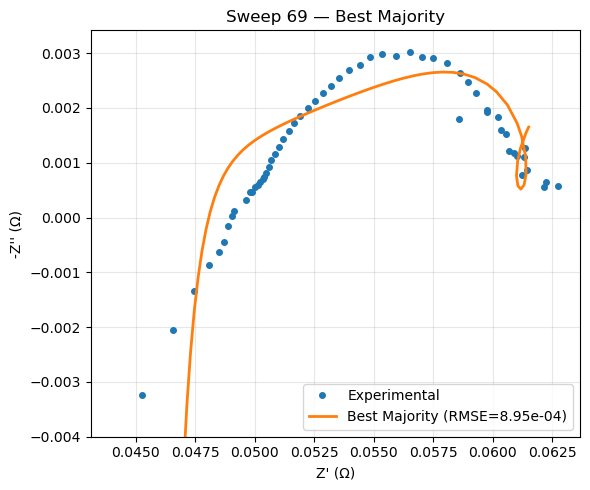

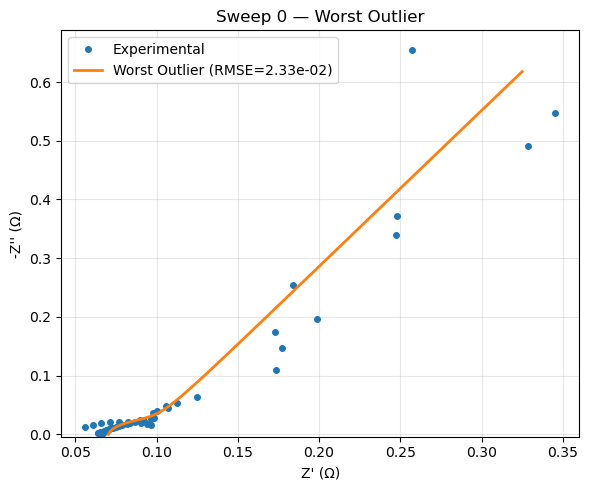

In [47]:
###############################################################################
# --- 8. MOVING‐WINDOW RMSE COMPARISON & EXAMPLE PLOTTING ----------------------
###############################################################################

# 1) Tag each sweep as outlier or majority (alpha > as we guess)
alpha_cols = [c for c in param_names if 'alpha' in c.lower()]
fit_df['is_alpha_outlier'] = fit_df[alpha_cols].max(axis=1) > 0.9

# 2) Split into majority vs outlier
maj = fit_df[~fit_df['is_alpha_outlier']].copy()
out = fit_df[ fit_df['is_alpha_outlier']].copy()

# 3) Compute mean & median RMSE
maj_mean = maj['rmse'].mean()    if len(maj) else np.nan
maj_med  = maj['rmse'].median()  if len(maj) else np.nan
out_mean = out['rmse'].mean()    if len(out) else np.nan
out_med  = out['rmse'].median()  if len(out) else np.nan

print("=== RMSE Comparison ===")
print(f"Majority (n={len(maj)}): mean RMSE = {maj_mean:.3e}, median RMSE = {maj_med:.3e}")
print(f"Outliers (n={len(out)}): mean RMSE = {out_mean:.3e}, median RMSE = {out_med:.3e}")

# 4) Plot examples (best‐majority, worst‐outlier)
if len(maj) and len(out):
    best_maj_id  = maj.loc[maj['rmse'].idxmin(), 'sweep_id']
    worst_out_id = out.loc[out['rmse'].idxmax(),'sweep_id']

    def plot_nyquist_example(sweep_id, label):
        grp = df_eis[df_eis['sweep_id']==sweep_id].sort_values('frequency')
        freq = grp['frequency'].values
        Z_exp = grp['Z_real'].values + 1j*(-grp['Z_imag_neg'].values)

        row = fit_df[fit_df['sweep_id']==sweep_id].iloc[0]
        circuit = CustomCircuit(circuit=advanced_model_info['circuit'],
                                initial_guess=advanced_model_info['initial_guess'])
        circuit.parameters_ = row['params']
        Z_fit = circuit.predict(freq)

        plt.figure(figsize=(6,5))
        plt.plot(Z_exp.real, -Z_exp.imag, 'o', label='Experimental', markersize=4)
        plt.plot(Z_fit.real, -Z_fit.imag, '-', 
                 label=f'{label} (RMSE={row["rmse"]:.2e})', linewidth=2)
        plt.xlabel("Z' (Ω)")
        plt.ylabel("-Z'' (Ω)")
        plt.title(f"Sweep {sweep_id} — {label}")
        plt.legend()
        plt.grid(alpha=0.3)
        plt.ylim(-0.004, None)
        plt.tight_layout()
        plt.show()

    print(f"\nPlotting best‐majority (sweep {best_maj_id}) and worst‐outlier (sweep {worst_out_id}):")
    plot_nyquist_example(best_maj_id,  "Best Majority")
    plot_nyquist_example(worst_out_id, "Worst Outlier")
else:
    print("Not enough data in one of the groups to plot examples.")

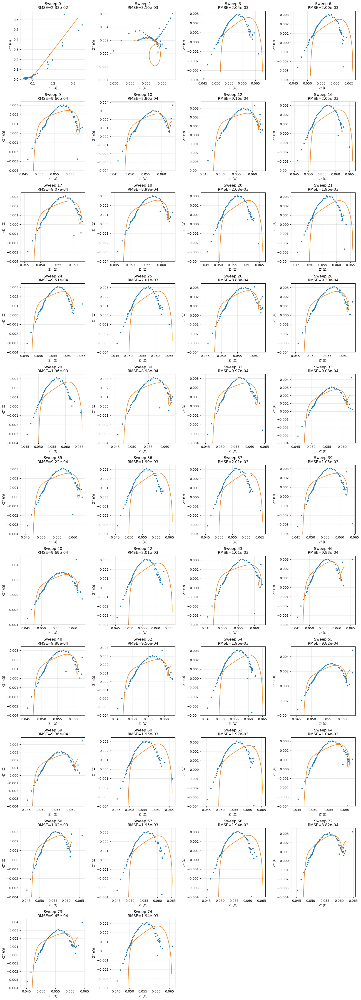

In [49]:
###############################################################################
# --- 9. PLOT ALL CORRECTED SWEEPS ------------------------------------
###############################################################################

# Identify which sweeps were corrected:
corrected_ids = out['sweep_id'].tolist()

# Decide on grid layout (e.g. 4 columns)
n = len(corrected_ids)
cols = 4
rows = int(np.ceil(n / cols))

fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows), squeeze=False)

for idx, sweep_id in enumerate(corrected_ids):
    ax = axes[idx // cols][idx % cols]

    # Experimental data
    grp = df_eis[df_eis['sweep_id'] == sweep_id].sort_values('frequency')
    freq = grp['frequency'].values
    Z_exp = grp['Z_real'].values + 1j * (-grp['Z_imag_neg'].values)

    # Corrected fit parameters (from fit_df['params'])
    row = fit_df[fit_df['sweep_id'] == sweep_id].iloc[0]
    circ = CustomCircuit(circuit=advanced_model_info['circuit'],
                         initial_guess=advanced_model_info['initial_guess'])
    circ.parameters_ = row['params']
    Z_fit = circ.predict(freq)

    # Plot
    ax.plot(Z_exp.real, -Z_exp.imag, 'o', markersize=3, label='Exp')
    ax.plot(Z_fit.real, -Z_fit.imag, '-', linewidth=1.5, label='Corrected Fit')

    # Use the rmse column you have
    ax.set_title(f"Sweep {sweep_id}\nRMSE={row['rmse']:.2e}")
    ax.set_xlabel("Z' (Ω)")
    ax.set_ylabel("-Z'' (Ω)")
    ax.grid(alpha=0.3)
    ax.set_ylim(-0.004, None)

# Turn off any unused subplots
for j in range(n, rows*cols):
    axes[j//cols][j%cols].axis('off')

plt.tight_layout()
plt.show()